# Model analysis v5-BAFigs

March 1, 2023. Updated March 11, 2026.

Caroline Juang, c.juang@columbia.edu

Data used:
* WUMI Burned Area dataset (updated through 2020, extended 2021 using MODIS)
* Climate data (updated through 2021)
* NOAA SST (updated through 2021), https://psl.noaa.gov/data/gridded/data.noaa.ersst.v5.html
* Data is prepared using:
    * `data\Data_CreateENSOIndex` to create SST gradient
    * `Ecoprovinces_ExtendData` to extend WUMI with MODIS
    * `data\Data_CreateModelData` to make final data by season
* Bailey's Ecoprovinces:
    * US Forest service data: https://data.nal.usda.gov/dataset/baileys-ecoregions-and-subregions-united-states-puerto-rico-and-us-virgin-islands
* Rufenacht forest area to differentiate all, forest, and nonforest regions.
* Census Bureau Cartographic Boundary Files for western US region
    * Regions: https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.html

Models used:
* `Model_ENSOclim_Akaike` creates the SST-climate models, trained on SST data. Predicts climate data. Only run this when the observed data updates.
* `Model_Akaike` creates the climate-burned area models, trained on climate data. Predicts area burned. Only run this when the observd data updates.
* This final file is based on model runs: `Model_ENSOfull12-2022`, which intake the SST data and predicts burned area. Also included: climate observed vs. predicted, and burned area observed vs. model-predicted (both SST-climate-BA and climate-BA)

In [1]:
# import
from customconfig import *
from customscripts import *

import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.stats import pearsonr
from scipy.stats.mstats import theilslopes
import scipy
import joblib
import datetime
from itertools import compress

# formatting shapefiles
from matplotlib.patches import Rectangle
from shapely.geometry import Polygon
from shapely.geometry import JOIN_STYLE
from shapely.ops import unary_union


# mapping
import geopandas as gpd
import cartopy.crs as ccrs
from cartopy.feature import NaturalEarthFeature, OCEAN, LAND, COASTLINE
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
#states = NaturalEarthFeature(category='cultural', scale='50m', facecolor='none',
#                             name='admin_1_states_provinces_shp')

# set figures formatting
import matplotlib
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
from matplotlib import rc
import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar
from matplotlib.ticker import FuncFormatter
import colorcet # more colormaps
# import
import matplotlib.patheffects as pe
from matplotlib.patches import Patch

import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('retina')
plt.rcParams['figure.dpi'] = 200

MANUALLY DEFINED, no forest models:
['ecoprov1', 'ecoprov3', 'ecoprov7', 'ecoprov18', 'ecoprov21']
MANUALLY DEFINED, no nonforest models:
[]
Ensemble is 500 members


In [2]:
# suppress deprecation warnings (temporarily using this bc matplotlib warnings)
import warnings
def fxn():
    warnings.warn("deprecated", DeprecationWarning)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

In [3]:
### manual variables to change

# importing data string
# Read the climate index from the .txt file
with open('0_climindname.txt', 'r') as f:
    climindnameObs = f.read().strip()
print(climindnameObs +' will be used for the SST gradient')
climindnameDT = 'DeTrend_'+climindnameObs
climfilename = 'DeTrendClimObs_'+climindnameObs # same as Model_ENSOfull
#data_string = 'data\\'
data_string = 'data//'
#model_string = 'model\\'+climindnameObs+'\\'
model_string = 'model//'+climindnameObs+'//'
#predict_string = 'predicted\\'+climindnameObs+'\\'
predict_string = 'predicted//'+climindnameObs+'//'

dfnum = [item for item in range(1,len(province_names)+1+1)]
dfnum.remove(11) # remove empty ecoregion - no overlap btwn westUS map and ecoregion
dfnum = np.array(dfnum)

# data manipulation
firstyear = 1984
finalyear = 2022
years = np.arange(firstyear, finalyear+1)
# translate years into dates
firsttime = str(firstyear)+'-01-01'
finaltime = str(finalyear)+'-12-31'

# color palette for SST gradient
#colorobs = '#E2725B' # a warm red to denote warming
colorobs = '#fc8d62' # light orange, from colorbrewer2
#colorDT = '#9BC6F0' # blue color for neutral cool
#colorDT = '#3366CC' # darker blue color?
colorDT = '#8da0cb' # periwinkle blue, from colorbrewer2

patch125-155_nino3-34 will be used for the SST gradient


In [4]:
# skip analysis for these ecoprovinces for low fire occurrence
# create filter for westUS + ecoprovs
df_filter = np.ones(len(dfnames))
dfnames_filter = ['ecoprov3', 'ecoprov6', 'ecoprov18']
for thisname in dfnames_filter:
    df_filter[dfnames.index(thisname)] = 0 # filter out this ecoregion
# filter arrays
dfnames = list(compress(dfnames, df_filter))

# create filter for ecoprovs
df_filternum = np.ones(len(dfnum))
dfnum_filter = np.array([3,6,18])
for thisnum in dfnum_filter:
    df_filternum[dfnum==thisnum] = 0 # filter out this ecoregion
# filter arrays
province_names = list(compress(province_names, df_filternum))
prov_abbr_names = list(compress(prov_abbr_names, df_filternum))
dfnum = np.array(list(compress(dfnum, df_filternum)))

# scripts

Imported via `customscripts.py` 

In [5]:
# need these two scripts because of forest and nonforest variables
# they cannot be moved to customscripts.py.
def in_forest(variable, thisregion):
    """
    For getting the average values only in a forest area.
    Requirements: the forest netCDF.
    Returns one weighted average of the variable for each timestep.
    """
    forestregion = forest*thisregion # get in the region
    weightedsum = (variable*(forestregion)).sum(dim=['X','Y'], skipna=True)
    forestsum = (forestregion).sum()
    return  weightedsum / forestsum


def in_nonforest(variable, thisregion):
    """
    For getting the average values only in a nonforested area in the western US.
    Requirements: the forest netCDF, a mask of the western US.
    Returns one weighted average of the variable for each timestep and the selected region.
    """
    nonforestregion = nonforest*thisregion # get in the region
    weightedsum = (variable*(nonforestregion)).sum(dim=['X','Y'], skipna=True)
    nonforestsum = (nonforestregion).sum()
    return  weightedsum / nonforestsum

# Import data
from `data\Data_CreateModelData`

## for Ecoprovince map

* `Becoprov` to plot shapefiles of Bailey's Ecoprovinces on a map so they can be colored according to data.
    * The CRS used is defined within the shapefile, so **no need to call `transform` when plotting**
* `ecoreg` to plot xarray-based gridded data of Bailey's ecoprovinces on a figure.
    * Use CRS `ccrs.PlateCarree()` when plotting

In [6]:
# import Bailey's Ecoregions
#Bailey_string = '1km\\landcover\\ecoregions\\shapefiles\\bailey\\eco-us-shp-GCS\\eco-us-shp-GCS.shp'
Bailey_string = '1km//landcover//ecoregions//shapefiles//bailey//eco-us-shp-GCS//eco-us-shp-GCS.shp'
Becoreg = gpd.read_file(directory + Bailey_string)

# projection info from file
Bailey_crs = Becoreg.crs
# projection info from website
#EPA_crs2 = ccrs.LambertAzimuthalEqualArea(central_longitude=-100, central_latitude=45, 
#                                         false_easting=0.0, false_northing=0.0, globe=None)

# get shapefile of just western US from US Census Bureau
# for some reason it includes Hawaii and Alaska
#Census_string = directory + 'Census Bureau\\Cartographic Boundary Files_Regions\\cb_2018_us_region_500k.shp'
Census_string = 'Census Bureau//Cartographic Boundary Files_Regions//cb_2018_us_region_500k.shp'
wUSregion = gpd.read_file(directory + Census_string)
wUSregion = wUSregion[wUSregion.NAME=='West']
# remove HI and AK
extentpoly = Polygon([(-130,30), (-130,50), (-100,50),(-100,30)])
poly_gdf = gpd.GeoDataFrame(geometry=[extentpoly], crs=ccrs.PlateCarree())
wUSregion = wUSregion.clip(extentpoly)

wUSregion = wUSregion.to_crs(Bailey_crs) # transform projection

# clip the ecoregions to just western US
Becoreg = gpd.clip(Becoreg, wUSregion)
# sort to the same order as data
Becoreg = Becoreg.set_index('PROVINCE')
Becoreg = Becoreg.loc[province_names]

# iterate through ecoregions and merge into ecoprovinces
# group the data by ecoregion
Becoprov = gpd.GeoDataFrame(columns=['PROVINCE','NUMBER','geometry'], geometry='geometry')
gbecoreg = Becoreg.groupby('PROVINCE')
i = 0 # start counter
eps = 0.001 # define buffer
# iterate through each province and MERGE the ecoregions
for thisname, thisgroup in gbecoreg:
    thisgeometry = thisgroup.geometry.to_crs('epsg:5070') # set CRS with m as unit
    thisgeometry = thisgeometry.buffer(eps, 1, join_style=JOIN_STYLE.mitre) # add buffer
    thisgeometry = unary_union(thisgeometry).buffer(-eps, 1, join_style=JOIN_STYLE.mitre) # merge, then remove buffer
    thisgeometry = gpd.GeoSeries(thisgeometry).set_crs('epsg:5070').to_crs('epsg:4326') # set CRS with degrees
    #thisgeometry = gpd.GeoSeries(unary_union(thisgroup.geometry))
    thisprovince = gpd.GeoDataFrame(data={'PROVINCE': thisname, 
                                          'NUMBER': dfnum[i], 
                                          'geometry': thisgeometry}, geometry='geometry')
    # append to create ecoprovince geodataframe
    Becoprov = gpd.GeoDataFrame(pd.concat([Becoprov, thisprovince], ignore_index=True))
    i+=1

# Becoprov is now a geodataframe I can use, with SHAPEFILES of provinces.

## import ecoprovinces xarray (gridded version)

In [7]:
#ecoreg_string = directory + '12km\\landcover\\Ecoregions_EPA\\bailey_ecoprovince.nc'
ecoreg_string = directory + '12km//landcover//Ecoregions_EPA//bailey_ecoprovince.nc'
ecoreg = xr.open_dataset(ecoreg_string, engine='netcdf4')
print(ecoreg.bailey_ecoprovince.province.legend)
ecoreg = ecoreg.bailey_ecoprovince

# add in entire western US
#ecoreg = xr.concat([westUS, ecoreg.bailey_ecoprovince], dim='province')
# remove the ecoregion that does not overlap with the western US
ecoreg = ecoreg.sel(province=dfnum)

1: American Semi-Desert and Desert Province, 2: Arizona-New Mexico Mountains Semi-Desert-Open Woodland-Coniferous Forest-Alpine Meadow Province, 3: Black Hills Coniferous Forest Province, 4: California Coastal Chapparral Forest and Shrub Province, 5: California Coastal Range Open Woodland-Shrub-Coniferous Forest-Meadow Province, 6: California Coastal Steppe-Mixed Forest-Redwood Forest Province, 7: California Dry Steppe Province, 8: Cascade Mixed Forest-Coniferous Forest-Alpine Meadow Province, 9: Chihuahuan Semi-Desert Province, 10: Colorado Plateau Semi-Desert Province, 11: Great Plains Steppe Province, 12: Great Plains-Palouse Dry Steppe Province, 13: Intermountain Semi-Desert Province, 14: Intermountain Semi-Desert and Desert Province, 15: Middle Rocky Mountain Steppe-Coniferous Forest-Alpine Meadow Province, 16: Nevada-Utah Mountains-Semi-Desert-Coniferous Forest-Alpine Meadow Province, 17: Northern Rocky Mountain Forest-Steppe-Coniferous Forest-Alpine Meadow Province, 18: Pacific 

## import forest and nonforest area
* `westUS` is xarray-based gridded data of the western US region.
* `forest` is xarray-based forest gridded data, within western US.
* `nonforest` is xarray-based nonforest gridded data within western US.
* `ecoreg` is xarray-based ecoprovinces
* `ecoregfor` is xarray-based ecoprovinces, forest area only
* `ecoregnon` is xarray-based ecoprovinces, nonforest area only

In [8]:
# import western US study area
#westUS_string = directory + '12km\\study_area\\westUS.nc'
westUS_string = directory + '12km//study_area//westUS.nc'
westUS = xr.open_dataset(westUS_string, engine='netcdf4')
westUS = westUS.westUS

# import forest
#forest_string = directory + '12km\\landcover\\US_ForestType_Ruefenacht\\forest_type_frac.nc'
forest_string = directory + '12km//landcover//US_ForestType_Ruefenacht//forest_type_frac.nc'
forest = xr.open_dataset(forest_string, engine='netcdf4')
forest = forest.forest_type_frac.sum(dim='ftype') # sum over all forest types

# create forest and nonforest area 
forest = westUS*forest
nonforest = westUS*(1-forest)
# add province as dimension to the westUS, to combine with ecoregions
westUS = westUS.expand_dims({'province':[0]})

In [9]:
# divide forest and nonforest into ecoprovinces

ecoregfor = [] # storage
ecoregnon = []

# get forest and nonforest pixels only where greater than .5
for thisregnum in dfnum:
    tmpfor = (forest.where(forest>.50))*ecoreg.sel(province=thisregnum)
    tmpnon = (nonforest.where(nonforest>.50))*ecoreg.sel(province=thisregnum)
    ecoregfor.append(tmpfor.to_numpy())
    ecoregnon.append(tmpnon.to_numpy())

# create xarray out of the data
ecoregfor = xr.DataArray(ecoregfor, coords={'province':ecoreg.province,
                                'Y':forest.Y, 'X':forest.X})
ecoregnon = xr.DataArray(ecoregnon, coords={'province':ecoreg.province,
                                'Y':forest.Y, 'X':forest.X})

## for Burned Area, individual fires and collective burned area

Make sure the model is trained on the updated data. Follow instructions on the README.
Make sure that `Model_ENSOfull12-2022` is updated with the burned area predictions.

Results:
* `intagency` is list of individual fire events
* `wumi` is gridded observed burn area
* `wumifor` is gridded observed forest burned area
* `wuminon` is gridded observed nonforest burned area
* `BAclimpredfor` for forest burned area from observed climate
* `BAclimprednon` for nonforest burned area from observed climate
* `BAclimpredfor_DT` for forest burned area, SST influence removed
* `BAclimprednon_DT` for nonforest burned area, SST influence removed

In [10]:
# import burned area from WUMI

# import list of individual fires (for number of fires)
filename = directory + 'NWCG-MTBS//west_US_fires_1984-2020_WUMI2.txt'
intagency = pd.read_csv(filename, sep = ',', header=0)
print('fires in interagency-MTBS database: '+ str(intagency.final_year.count()))
intagency = intagency[intagency.final_year <= finalyear] # time period
intagency = intagency[intagency.final_forest_area_ha>0] # forest fires only
print('forest fires only <2020 interagency-MTBS database: '+ str(intagency.final_year.count()))

fires in interagency-MTBS database: 21693
forest fires only <2020 interagency-MTBS database: 11107


In [11]:
# import OBSERVED burned area wumi
filename = data_string + 'WUMI-ecoprovinces'
wumi = pd.read_csv(filename+'_all.txt').set_index('Unnamed: 0')
wumifor = pd.read_csv(filename+'_for.txt').set_index('Unnamed: 0')
wuminon = pd.read_csv(filename+'_non.txt').set_index('Unnamed: 0')

# import DETRENDED burned area wumi
# this is observed BA minus the 
# contribution of gSST (modelBA_fromobsclim - modelBA_fromDTsst)
filename = predict_string + 'BurnArea_wumiDT'
filenameend = '_'+str(firstyear)+'-'+str(finalyear)+'.txt'
wumiDT = pd.read_csv(filename+'_all_'+climfilename+filenameend).set_index('Unnamed: 0')
wumiforDT = pd.read_csv(filename+'_for_'+climfilename+filenameend).set_index('Unnamed: 0')
wuminonDT = pd.read_csv(filename+'_non_'+climfilename+filenameend).set_index('Unnamed: 0')

# PREDICTED BURNED AREA from observed SST and observed climate 
# (Model_ENSOfull12-2022 must be updated)

#filename = predict_string + 'BurnArea_'
filename = predict_string + 'BurnArea_'

# predicted burned area from observed climate
BAclimpredall = pd.read_csv(filename+'climpred_all_'+str(firstyear)+'-'+str(finalyear)+'.txt').set_index('Unnamed: 0')
BAclimpredfor = pd.read_csv(filename+'climpred_for_'+str(firstyear)+'-'+str(finalyear)+'.txt').set_index('Unnamed: 0')
BAclimprednon = pd.read_csv(filename+'climpred_non_'+str(firstyear)+'-'+str(finalyear)+'.txt').set_index('Unnamed: 0')

# predicted burned area removing SST gradient trend
# (observed climate - climate without effect of SST trend)
BAclimpredall_DT = pd.read_csv(filename+'sstpred_all_'+climfilename+'_'+str(firstyear)+'-'+str(finalyear)+'.txt').set_index('Unnamed: 0')
BAclimpredfor_DT = pd.read_csv(filename+'sstpred_for_'+climfilename+'_'+str(firstyear)+'-'+str(finalyear)+'.txt').set_index('Unnamed: 0')
BAclimprednon_DT = pd.read_csv(filename+'sstpred_non_'+climfilename+'_'+str(firstyear)+'-'+str(finalyear)+'.txt').set_index('Unnamed: 0')


In [12]:
# skip analysis for these ecoprovinces for low fire occurrence
# note that the 'allwestUS' has already been checked to be the sum of the
# other ecoprovinces in the full model

dfnum_list = [str(x) for x in dfnum]

# append '0' allwestUS to the dfnum_list
dfnum_list = ['0']+dfnum_list

# Forest and nonforest burned area (timeseries)

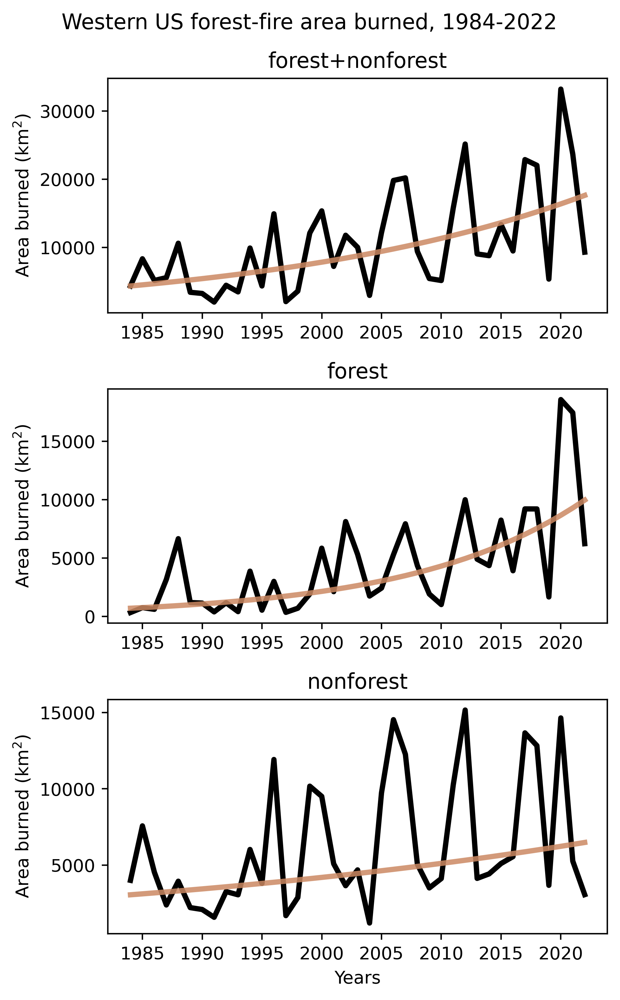

In [13]:
# get timeseries of burned area from all western US
# OBSERVED
sumswumi = [wumi.loc[:,'0'], wumifor.loc[:,'0'], wuminon.loc[:,'0']]
landtypes = ['forest+nonforest', 'forest', 'nonforest']
xyears = np.arange(firstyear,finalyear+1,1)
tmpbestfitsm = []
tmpbestfitsb = []

fig, ax = plt.subplots(3,1,figsize=(5,8))
for i in np.arange(0,3):
    ax[i].plot(sumswumi[i], color='k', linewidth=3)

    # decorate
    ax[i].set_ylabel('Area burned (km$^2$)')

    # line of best fit (theil-sen)
    tmpbestfit = theilslopes(np.log10(sumswumi[i]), x=sumswumi[i].index, method='joint') # regression
    tmpbestfitsm.append(tmpbestfit.slope)
    tmpbestfitsb.append(tmpbestfit.intercept)
    ax[i].plot(xyears, (10**(xyears*tmpbestfit.slope + tmpbestfit.intercept)), color='#cc8963', 
            linewidth='3', label='Exponential Trend', alpha=0.85)
    ax[i].set_title(landtypes[i])

fig.suptitle('Western US forest-fire area burned, 1984-'+str(finalyear))
ax[2].set_xlabel('Years')
fig.tight_layout()
#plt.savefig(figfolder + 'AGU2022_AreaBurned.png')

## Observed percent change

growth = ((predicted - initial) / initial

where predicted = 10^(m*finalyear + b)

and initial = 10^(m*firstyear + b)

In [14]:
print('OBSERVED TRENDS')
# get the % change from beginning to current-year burned area
for i in np.arange(0,3):
    tmpfirst = 10**(tmpbestfitsm[i]*firstyear + tmpbestfitsb[i])
    tmpfinal = 10**(tmpbestfitsm[i]*finalyear + tmpbestfitsb[i])
    tmppctchange = (tmpfinal-tmpfirst)/(tmpfirst)*100
    print('Percent change in BA for {}: {:.2f}%'.format(landtypes[i], tmppctchange))

OBSERVED TRENDS
Percent change in BA for forest+nonforest: 306.23%
Percent change in BA for forest: 1320.05%
Percent change in BA for nonforest: 111.92%


# Burned Area Timeseries (for observed and model), Figure 2(c,d,e)

##### burned area 

* all western US as summed by the various models
    * `wumi` (all, for, non) 
    * `BAclimpred` (all, for, non)
    * `BAclimpred_DT` (all, for, non)

Note that the entire western US values are the sum of the ecoregions.

Note that the all landcover type is the sum of forest + nonforest.

* example northern ecoregion
* example southern ecoregion
* get r-values of contribution of SST-observed and Reverse-trend
    * compare the log(`wumi`) vs. log(`BAsstpredfor`)

# Burned Area Timeseries (for observed and DETRENDED-scenario), Figure 2(c,d,e)

##### burned area 

* summed from the ecoregions
    * `wumi` (all, for, non) - the observed burned area 
    * `wumiDT` (all, for, non) - observed minus SST gradient contribution
 
I checked: WUMI is equal to the sum of WUMI-forest and WUMI-nonforest. No worries about summing them. (8/10/2023) This action is performed in the `Model_ENSOFull file`.

In [15]:
# get the averages for BA_climpred and BA_climpred DT
# note, I use the 'allwestUS' columns because they are already the calculated
# sum of the rest of the ecoprovinces (in Model_ENSOFull)
# out of the 500 members
ecoregname = 'allwestUS'
tmpBAall = (10**BAclimpredall.filter(like=ecoregname))
tmpBAfor = (10**BAclimpredfor.filter(like=ecoregname))
tmpBAnon = (10**BAclimprednon.filter(like=ecoregname))
tmpBAall_DT = (10**BAclimpredall_DT.filter(like=ecoregname))
tmpBAfor_DT = (10**BAclimpredfor_DT.filter(like=ecoregname))
tmpBAnon_DT = (10**BAclimprednon_DT.filter(like=ecoregname))

# get mean values
sum_BAclimpredall = tmpBAall.mean(axis=1) # modeled from obs clim
sum_BAclimpredfor = tmpBAfor.mean(axis=1)
sum_BAclimprednon = tmpBAnon.mean(axis=1)

sum_BAclimpredall_DT = tmpBAall_DT.mean(axis=1) # modeled from detrended clim
sum_BAclimpredfor_DT = tmpBAfor_DT.mean(axis=1)
sum_BAclimprednon_DT = tmpBAnon_DT.mean(axis=1)

## 500-member trendlines
for each member time series, find the trendline associated with the log(BA) time series.

In [16]:
# script for getting all slopes from 500-member ensemble
def ensemble_trends(df, years):
    slopes = []
    intercepts = []
    for col in df.columns:
        y = np.log10(df[col])
        fit = theilslopes(
            y,x=years,
            method='joint')
        slopes.append(fit.slope)
        intercepts.append(fit.intercept)
    return np.array(slopes), np.array(intercepts)

In [17]:
# GET ALL THEIL SEN TRENDLINES
# USE THEM TO GET 95TH CONFIDENCE INTERVAL (6/18/2026)

# ALL POSSIBLE THEIL SEN TRENDLINES
slopes_all, intercepts_all = ensemble_trends(
    tmpBAall, xyears)
slopes_for, intercepts_for = ensemble_trends(
    tmpBAfor, xyears)
slopes_non, intercepts_non = ensemble_trends(
    tmpBAnon, xyears)
slopes_all_DT, intercepts_all_DT = ensemble_trends(
    tmpBAall_DT, xyears)
slopes_for_DT, intercepts_for_DT = ensemble_trends(
    tmpBAfor_DT, xyears)
slopes_non_DT, intercepts_non_DT = ensemble_trends(
    tmpBAnon_DT, xyears)

# calculate all possible trendline VALUES based on 500-member ensemble trendlines
# this is for all years, but in prep to get first and last years

# shape: (500, nyears)
tmpBAall_trendspread = 10**(
    slopes_all[:, None] * xyears[None, :] + intercepts_all[:, None])
tmpBAfor_trendspread = 10**(
    slopes_for[:, None] * xyears[None, :] + intercepts_for[:, None])
tmpBAnon_trendspread = 10**(
    slopes_non[:, None] * xyears[None, :] + intercepts_non[:, None])
tmpBAall_trendspread_DT = 10**(
    slopes_all_DT[:, None] * xyears[None, :] + intercepts_all_DT[:, None])
tmpBAfor_trendspread_DT = 10**(
    slopes_for_DT[:, None] * xyears[None, :] + intercepts_for_DT[:, None])
tmpBAnon_trendspread_DT = 10**(
    slopes_non_DT[:, None] * xyears[None, :] + intercepts_non_DT[:, None])

# calculate 95th percentile confidence interval for each year

all_lo, all_hi = np.percentile(tmpBAall_trendspread, [2.5, 97.5], axis=0)
for_lo, for_hi = np.percentile(tmpBAfor_trendspread, [2.5, 97.5], axis=0)
non_lo, non_hi = np.percentile(tmpBAnon_trendspread, [2.5, 97.5], axis=0)

all_lo_DT, all_hi_DT = np.percentile(tmpBAall_trendspread_DT, [2.5, 97.5], axis=0)
for_lo_DT, for_hi_DT = np.percentile(tmpBAfor_trendspread_DT, [2.5, 97.5], axis=0)
non_lo_DT, non_hi_DT = np.percentile(tmpBAnon_trendspread_DT, [2.5, 97.5], axis=0)

## (Not included as figure) 3-Plot time series with uncertainty errorbars

r (log(BA_WUMI), log(BA_from obs clim): 0.904
r (log(BA_WUMI), log(BA_from clim, no SST trend): 0.892
r (log(BA_WUMI), log(BA_from obs clim): 0.951
r (log(BA_WUMI), log(BA_from clim, no SST trend): 0.933
r (log(BA_WUMI), log(BA_from obs clim): 0.829
r (log(BA_WUMI), log(BA_from clim, no SST trend): 0.827


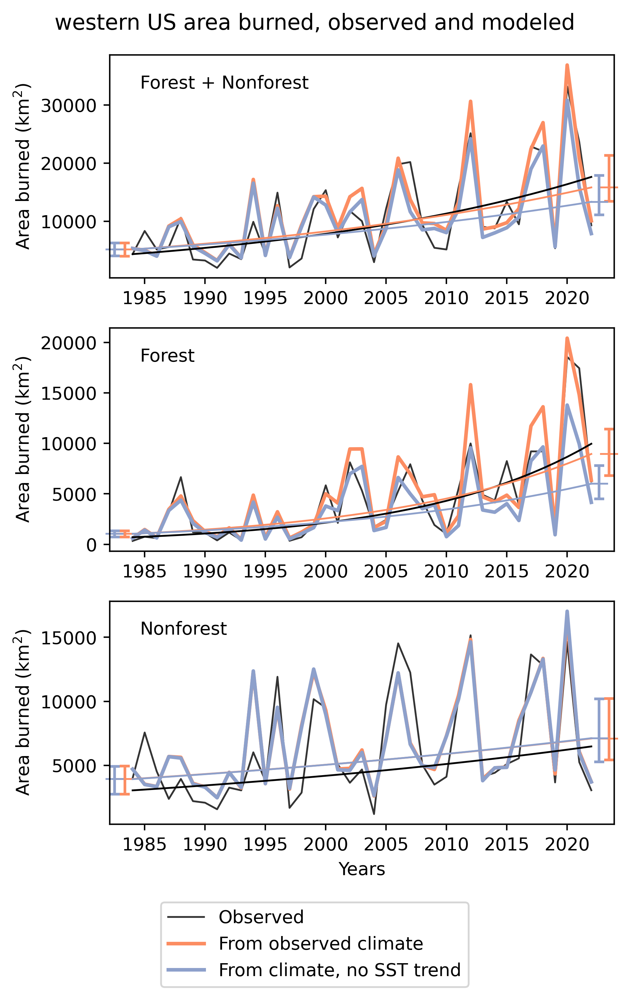

In [18]:
# all of western US area burned, observed and modeled FOREST

# final years
xyears = np.arange(firstyear,finalyear+1,1)

# put them together
sumswumi = [wumi.loc[:,'0'], wumifor.loc[:,'0'], wuminon.loc[:,'0']]
sumsBA = [sum_BAclimpredall, sum_BAclimpredfor, sum_BAclimprednon]
sumsBA_DT = [sum_BAclimpredall_DT, sum_BAclimpredfor_DT, sum_BAclimprednon_DT]
# trendline confidence intervals for modeled runs
trendBA_hi = [all_hi, for_hi, non_hi]
trendBA_lo = [all_lo, for_lo, non_lo]
trendBA_lo_DT = [all_lo_DT, for_lo_DT, non_lo_DT]
trendBA_hi_DT = [all_hi_DT,for_hi_DT, non_hi_DT]

# line of best fit
tmpm = np.zeros(3)
tmpmBA = np.zeros(3)
tmpmBA_DT = np.zeros(3)
tmpb = np.zeros(3)
tmpbBA = np.zeros(3)
tmpbBA_DT = np.zeros(3)
for i in np.arange(len(tmpm)):
    # wumi lines of best fit
    tmpbestfit = theilslopes(np.log10(sumswumi[i]), x=xyears, method='joint') # regression
    tmpm[i] = tmpbestfit.slope
    tmpb[i] = tmpbestfit.intercept
    # BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA[i]), x=xyears, method='joint') # regression
    tmpmBA[i] = tmpbestfit.slope
    tmpbBA[i] = tmpbestfit.intercept
    # detrended BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA_DT[i]), x=xyears, method='joint') # regression
    tmpmBA_DT[i] = tmpbestfit.slope
    tmpbBA_DT[i] = tmpbestfit.intercept

# make plot
fig, ax = plt.subplots(3,1, figsize=(5,7))

fig.suptitle('western US area burned, observed and modeled')
for i in np.arange(0,3):
    # plot area burned
    ax[i].plot(sumswumi[i], label='Observed', 
               c='k', alpha=0.8, linewidth=1)
    ax[i].plot(xyears, sumsBA[i], 
               label='From observed climate', 
               c=colorobs, linewidth=2)
    ax[i].plot(xyears, sumsBA_DT[i], 
               label='From climate, no SST trend', 
               c=colorDT, linewidth=2)
    # plot lines of best fit
    ax[i].plot(xyears, 10**(tmpm[i]*xyears+tmpb[i]), 
               linewidth=1, c='k', zorder=3)
    ax[i].plot(xyears, 10**(tmpmBA[i]*xyears+tmpbBA[i]), 
               linewidth=1,c=colorobs, zorder=3)
    ax[i].plot(xyears, 10**(tmpmBA_DT[i]*xyears+tmpbBA_DT[i]), 
               linewidth=1,  c=colorDT, zorder=3)
    # decorate
    ax[i].set_ylabel('Area burned (km$^2$)')
    
    # TRENDLINE UNCERTAINTY WHISKERS (errorbars for 95th percentile confidence range)
    # trendlines already plotted above
    fit_obs = 10**(tmpmBA[i] * xyears + tmpbBA[i])
    fit_dt  = 10**(tmpmBA_DT[i] * xyears + tmpbBA_DT[i])
    
    # x positions in axes coordinates
    xleft_obs  = 0.03
    xleft_dt   = 0.01
    xright_obs = 0.99
    xright_dt  = 0.97
    capwidth = 0.010
    
    trans = ax[i].get_yaxis_transform()
    
    # --------------------------------
    # OBSERVED-CLIMATE TRENDLINE
    # left endpoint
    ym = fit_obs[0]
    y0 = trendBA_lo[i][0]
    y1 = trendBA_hi[i][0]
    
    ax[i].vlines(
        xleft_obs, y0, y1, color=colorobs, lw=1.5,
        transform=trans, clip_on=False
    )
    ax[i].hlines(
        [y0, y1],
        xleft_obs-capwidth,
        xleft_obs+capwidth, color=colorobs, lw=1.5,
        transform=trans, clip_on=False
    )
    ax[i].plot(
        xleft_obs, ym,
        marker='_', markersize=10, color=colorobs,
        transform=trans, clip_on=False
    )
    # right endpoint
    ym = fit_obs[-1]
    y0 = trendBA_lo[i][-1]
    y1 = trendBA_hi[i][-1]
    
    ax[i].vlines(
        xright_obs, y0, y1, color=colorobs, lw=1.5,
        transform=trans, clip_on=False)
    ax[i].hlines(
        [y0, y1],
        xright_obs-capwidth,
        xright_obs+capwidth, color=colorobs, lw=1.5,
        transform=trans, clip_on=False)
    ax[i].plot(
        xright_obs, ym,
        marker='_', markersize=10, color=colorobs,
        transform=trans, clip_on=False)
    # --------------------------
    # DETRENDED-SST TRENDLINE
    
    # left endpoint
    ym = fit_dt[0]
    y0 = trendBA_lo_DT[i][0]
    y1 = trendBA_hi_DT[i][0]
    
    ax[i].vlines(
        xleft_dt, y0, y1, color=colorDT, lw=1.5,
        transform=trans, clip_on=False)
    ax[i].hlines(
        [y0, y1],
        xleft_dt-capwidth,
        xleft_dt+capwidth, color=colorDT, lw=1.5,
        transform=trans, clip_on=False)
    ax[i].plot(
        xleft_dt, ym,
        marker='_', markersize=10, color=colorDT,
        transform=trans, clip_on=False)
    # right endpoint
    ym = fit_dt[-1]
    y0 = trendBA_lo_DT[i][-1]
    y1 = trendBA_hi_DT[i][-1]
    
    ax[i].vlines(
        xright_dt, y0, y1,
        color=colorDT, lw=1.5,
        transform=trans, clip_on=False)
    ax[i].hlines(
        [y0, y1],
        xright_dt-capwidth,
        xright_dt+capwidth, color=colorDT, lw=1.5,
        transform=trans, clip_on=False)
    ax[i].plot(
        xright_dt, ym,
        marker='_', markersize=10, color=colorDT,
        transform=trans, clip_on=False)

# line of best fit
for i in np.arange(0,3):
    corr_climpred = pearsonr(np.log10(sumswumi[i]), 
                             np.log10(sumsBA[i]))
    #ax[i].annotate("r$^2$(log(BA_obs), log(BA_climate obs) = {:.2f}".format((corr_climpred.rvalue**2)), 
    #            (0.06,0.75), c=colorobs, xycoords='axes fraction' )
    corr_climpred_DT = pearsonr(np.log10(sumswumi[i]), 
                                np.log10(sumsBA_DT[i]))
    #ax[i].annotate("r$^2$(log(BA_obs),log(BA_clim, no SST trend)) = {:.2f}".format(corr_climpred_DT.rvalue**2), 
    #        (0.06,0.65), c=colorDT, xycoords='axes fraction' )
    print('r (log(BA_WUMI), log(BA_from obs clim):', '{:.3}'.format(corr_climpred.statistic))
    print('r (log(BA_WUMI), log(BA_from clim, no SST trend):', '{:.3}'.format(corr_climpred_DT.statistic))

ax[2].set_xlabel('Years')
fig.legend(['Observed', 'From observed climate', 
            'From climate, no SST trend'], 
           bbox_to_anchor=(0.5,-0.05), loc='center')
ax[0].annotate('Forest + Nonforest',(0.06,0.85), c='#000', xycoords='axes fraction' )
ax[1].annotate('Forest',(0.06,0.85), c='#000', xycoords='axes fraction' )
ax[2].annotate('Nonforest',(0.06,0.85), c='#000', xycoords='axes fraction' )
fig.tight_layout()
#plt.savefig(figfolder + 'AGU2022_AreaBurned_models.png')

## Trend from gSST

Contribution of the gSST trend to the observed burned area trend. This means that we are looking for a percentage of the slope from the Theil-sen trendline.

In [19]:
# script for calculating percent change contribution
# from orange line minus blue line
# modified for accepting a different denominator value
# (i.e. for keeping the initial value consistent to compare with WUMI)
def percent_change_distribution(slopes, intercepts, xyears, denom=None):
    x0 = xyears[0]
    x1 = xyears[-1]
    
    y0 = 10**(slopes * x0 + intercepts)
    y1 = 10**(slopes * x1 + intercepts)

    if denom is None:
        pct = (y1 - y0) / y0 * 100 # use initial value as denominator
    else:
        pct = (y1 - y0) / denom * 100 # use denom value as denominator
    return pct

In [20]:
# SUM for all regions
# use allwestern US means (since we know it's the sum of all ecoprovinces, confirmed)

# get mean values AGAIN (also done in steps above)
sum_BAclimpredall = tmpBAall.mean(axis=1) # modeled from obs clim
sum_BAclimpredfor = tmpBAfor.mean(axis=1)
sum_BAclimprednon = tmpBAnon.mean(axis=1)

sum_BAclimpredall_DT = tmpBAall_DT.mean(axis=1) # modeled from detrended clim
sum_BAclimpredfor_DT = tmpBAfor_DT.mean(axis=1)
sum_BAclimprednon_DT = tmpBAnon_DT.mean(axis=1)

# put them together for iterating through a figure
sumswumi = [wumi.loc[:,'0'], wumifor.loc[:,'0'], wuminon.loc[:,'0']]
sumsBA = [sum_BAclimpredall, sum_BAclimpredfor, sum_BAclimprednon]
sumsBA_DT = [sum_BAclimpredall_DT, sum_BAclimpredfor_DT, sum_BAclimprednon_DT]

# THEIL SEN TRENDLINES
# trendlines from observed BA
m_all_obs = theilslopes(np.log10(wumi.iloc[:,0]), x=xyears, method='joint')
m_for_obs = theilslopes(np.log10(wumifor.iloc[:,0]), x=xyears, method='joint')
m_non_obs = theilslopes(np.log10(wuminon.iloc[:,0]), x=xyears, method='joint')

# trendlines from trended scenario (climate-BA model)
m_all_clim = theilslopes(np.log10(sum_BAclimpredall), x=xyears, method='joint')
m_for_clim = theilslopes(np.log10(sum_BAclimpredfor), x=xyears, method='joint')
m_non_clim = theilslopes(np.log10(sum_BAclimprednon), x=xyears, method='joint')

# trendlines from detrended scenario (climate-BA model)
m_all_climdt = theilslopes(np.log10(sum_BAclimpredall_DT), x=xyears, method='joint')
m_for_climdt = theilslopes(np.log10(sum_BAclimpredfor_DT), x=xyears, method='joint')
m_non_climdt = theilslopes(np.log10(sum_BAclimprednon_DT), x=xyears, method='joint')

In [21]:
# CALCULATE PERCENT CHANGE
# (6/19/2026) use pairwise modeled BA to get the contribution to observed BA trend
# (8/8/2024) for timeseries, I make all intercepts the observed BA trendline intercept
# for proper % comparison. Add the percent change to the figures.

xyears = np.arange(firstyear,finalyear+1,1)

# what is the trendline contribution?

# small graph of the trendlines to confirm
# all of western US area burned, observed and modeled FOREST

# final years
xyears = np.arange(firstyear,finalyear+1,1)

# print the trendline contribution
print('How much of the trend is from the SST gradient?\n(trendline is Theil-Sen)')

# calculate the difference in before/after for each to get percent change
# (8/8/2024) Purposely changed percentage change denominator to be obs BA
# ALL!!!!!!!--------------------------
print('ALL')
# OBSERVED BA
tmpinit0 = 10**(m_all_obs.slope*xyears[0]+m_all_obs.intercept)
tmpfinal = 10**(m_all_obs.slope*xyears[-1]+m_all_obs.intercept)
rawchange1all= (tmpfinal-tmpinit0)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange1all))
tmppctchange1all = ((tmpfinal - tmpinit0)/tmpinit0)*100
print('\t% change in observed trendline: {:.2f} %'.format(tmppctchange1all))

# modeled, from clim, MEAN BA
tmpinit = 10**(m_all_clim.slope*xyears[0]+m_all_clim.intercept)
tmpfinal = 10**(m_all_clim.slope*xyears[-1]+m_all_clim.intercept)
rawchange2all = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange2all))
tmppctchange2all = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(observed clim): {:.2f} %'.format(tmppctchange2all))

# modeled, from DT clim, MEAN BA
tmpinit = 10**(m_all_climdt.slope*xyears[0]+m_all_climdt.intercept)
tmpfinal = 10**(m_all_climdt.slope*xyears[-1]+m_all_climdt.intercept)
rawchange3all = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange3all))
tmppctchange3all = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(DT clim): {:.2f} %'.format(tmppctchange3all))

# get percent change from pairs in 500-member ensemble
# pairwise for each member:
# get percent change for orange member
# get percent change for blue member
percchange = percent_change_distribution(slopes_all, intercepts_all, xyears, denom=tmpinit0)
percchange_DT = percent_change_distribution(slopes_all_DT,
                                                intercepts_all_DT, xyears, denom=tmpinit0)
# get confidence interval in fully-calibrated model:
tmppercchange_CI = np.percentile(percchange, [2.5,97.5])
print('fully-calibrated % change, 95%CI: {:.2f} to {:.2f} %'.format(tmppercchange_CI[0], 
                                                                   tmppercchange_CI[1]))

# get difference in percent change for pairwise
percchange_diff = percchange - percchange_DT
# get confidence interval in percent change difference
percchange_diff_CI = np.percentile(percchange_diff, [2.5,97.5])
print('$\Delta_obsclim$ minus $\Delta_DTclim$ = {:.2f} %'.format(tmppctchange2all-tmppctchange3all))
print('difference in % change, 95%CI:: {:.2f} to {:.2f} %'.format(percchange_diff_CI[0], 
                                                                   percchange_diff_CI[1]))

# calculate percent change contribution to observed trend
finalrawchange_all = rawchange2all-rawchange3all
finaltrendper_all = (tmppctchange2all-tmppctchange3all)/tmppctchange1all*100
finaltrendper_all_hi = (percchange_diff_CI[1])/tmppctchange1all*100
finaltrendper_all_lo = (percchange_diff_CI[0])/tmppctchange1all*100
print('\nALL: How much of the trend? {:.2f} km2/yr, {:.2f} %'.format(finalrawchange_all, finaltrendper_all))
print('\tlower bound: {:.2f}% , upper bound: {:.2f}%'.format(finaltrendper_all_lo, 
                                                            finaltrendper_all_hi))


# FOREST!!!!!!----------------------
print('\nFOREST')
tmpinit0 = 10**(m_for_obs.slope*xyears[0]+m_for_obs.intercept)
tmpfinal = 10**(m_for_obs.slope*xyears[-1]+m_for_obs.intercept)
rawchange1for = (tmpfinal-tmpinit0)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange1for))
tmppctchange1for = ((tmpfinal - tmpinit0)/tmpinit0)*100
print('\t% change in observed trendline: {:.2f} %'.format(tmppctchange1for))

tmpinit = 10**(m_for_clim.slope*xyears[0]+m_for_clim.intercept)
tmpfinal = 10**(m_for_clim.slope*xyears[-1]+m_for_clim.intercept)
rawchange2for = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange2for))
tmppctchange2for = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(observed clim): {:.2f} %'.format(tmppctchange2for))

# modeled, from DT clim, MEAN BA
tmpinit = 10**(m_for_climdt.slope*xyears[0]+m_for_climdt.intercept)
tmpfinal = 10**(m_for_climdt.slope*xyears[-1]+m_for_climdt.intercept)
rawchange3for = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange3for))
tmppctchange3for = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(DT clim): {:.2f} %'.format(tmppctchange3all))


# get percent change from pairs in 500-member ensemble
# pairwise for each member:
# get percent change for orange member
# get percent change for blue member
percchange = percent_change_distribution(slopes_for, intercepts_for, 
                                         xyears, denom=tmpinit0)
percchange_DT = percent_change_distribution(slopes_for_DT,
                                            intercepts_for_DT, xyears, denom=tmpinit0)
# get confidence interval in fully-calibrated model:
tmppercchange_CI = np.percentile(percchange, [2.5,97.5])
print('fully-calibrated % change, 95%CI: {:.2f} to {:.2f} %'.format(tmppercchange_CI[0], 
                                                                   tmppercchange_CI[1]))

# get difference in percent change for pairwise
percchange_diff = percchange - percchange_DT
# get confidence interval in percent change difference
percchange_diff_CI = np.percentile(percchange_diff, [2.5,97.5])
print('$\Delta_obsclim$ minus $\Delta_DTclim$ = {:.2f} %'.format(tmppctchange2for-tmppctchange3for))
print('difference in % change, 95%CI: {:.2f} to {:.2f} %'.format(percchange_diff_CI[0], 
                                                                   percchange_diff_CI[1]))

# calculate percent change contribution to observed trend
finalrawchange_for = rawchange2for-rawchange3for
finaltrendper_for = (tmppctchange2for-tmppctchange3for)/tmppctchange1for*100
finaltrendper_for_hi = (percchange_diff_CI[1])/tmppctchange1for*100
finaltrendper_for_lo = (percchange_diff_CI[0])/tmppctchange1for*100
print('\nFOREST: How much of the trend? {:.2f} km2/yr, {:.2f} %'.format(finalrawchange_for, 
                                                                        finaltrendper_for))
print('\tlower bound: {:.2f}% , upper bound: {:.2f}%'.format(finaltrendper_for_lo, 
                                                            finaltrendper_for_hi))


# NON-FOREST!!!!!----------------------
print('\nNONFOREST')
tmpinit0 = 10**(m_non_obs.slope*xyears[0]+m_non_obs.intercept)
tmpfinal = 10**(m_non_obs.slope*xyears[-1]+m_non_obs.intercept)
print('\ttmpinit0={:.2f}'.format(tmpinit0))
print('\ttmpfinal={:.2f}'.format(tmpfinal))
rawchange1non = (tmpfinal-tmpinit0)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange1non))
tmppctchange1non = ((tmpfinal - tmpinit0)/tmpinit0)*100
print('\t% change in observed trendline: {:.2f} %'.format(tmppctchange1non))

tmpinit = 10**(m_non_clim.slope*xyears[0]+m_non_clim.intercept)
tmpfinal = 10**(m_non_clim.slope*xyears[-1]+m_non_clim.intercept)
print('\ttmpinit0={:.2f}'.format(tmpinit0))
print('\ttmpinit={:.2f}'.format(tmpinit))
print('\ttmpfinal={:.2f}'.format(tmpfinal))
rawchange2non = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange2non))
tmppctchange2non = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(observed clim): {:.2f} %'.format(tmppctchange2non))

# modeled, from DT clim, MEAN BA
tmpinit = 10**(m_non_climdt.slope*xyears[0]+m_non_climdt.intercept)
tmpfinal = 10**(m_non_climdt.slope*xyears[-1]+m_non_climdt.intercept)
rawchange3non = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange3non))
tmppctchange3non = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(DT clim): {:.2f} %'.format(tmppctchange3all))

# get percent change from pairs in 500-member ensemble
# pairwise for each member:
# get percent change for orange member
# get percent change for blue member
percchange = percent_change_distribution(slopes_non, intercepts_non, xyears, denom=tmpinit0)
percchange_DT = percent_change_distribution(slopes_non_DT,
                                                intercepts_non_DT, xyears, denom=tmpinit0)
# get confidence interval in fully-calibrated model:
tmppercchange_CI = np.percentile(percchange, [2.5,97.5])
print('fully-calibrated % change, 95%CI: {:.2f} to {:.2f} %'.format(tmppercchange_CI[0], 
                                                                   tmppercchange_CI[1]))

# get difference in percent change for pairwise
percchange_diff = percchange - percchange_DT
# get confidence interval in percent change difference
percchange_diff_CI = np.percentile(percchange_diff, [2.5,97.5])
print('$\Delta_obsclim$ minus $\Delta_DTclim$ = {:.2f} %'.format(tmppctchange2non-tmppctchange3non))
print('difference in % change, 95%CI:: {:.2f} to {:.2f} %'.format(percchange_diff_CI[0], 
                                                                   percchange_diff_CI[1]))

# calculate percent change contribution to observed trend
finalrawchange_non = rawchange2non-rawchange3non
finaltrendper_non = (tmppctchange2non-tmppctchange3non)/tmppctchange1non*100
finaltrendper_non_hi = (percchange_diff_CI[1])/tmppctchange1non*100
finaltrendper_non_lo = (percchange_diff_CI[0])/tmppctchange1non*100
print('\nNON-FOREST: How much of the trend? {:.2f} km2/yr, {:.2f} %'.format(finalrawchange_non, finaltrendper_non))
print('\tlower bound: {:.2f}% , upper bound: {:.2f}%'.format(finaltrendper_non_lo, 
                                                            finaltrendper_non_hi))

How much of the trend is from the SST gradient?
(trendline is Theil-Sen)
ALL
$\Delta$ = 340.67 km$^2$/yr
	% change in observed trendline: 306.23 %
$\Delta$ = 274.07 km$^2$/yr
	% change in model(observed clim): 246.37 %
$\Delta$ = 209.85 km$^2$/yr
	% change in model(DT clim): 188.64 %
fully-calibrated % change, 95%CI: 189.32 to 379.74 %
$\Delta_obsclim$ minus $\Delta_DTclim$ = 57.73 %
difference in % change, 95%CI:: 33.68 to 101.77 %

ALL: How much of the trend? 64.23 km2/yr, 18.85 %
	lower bound: 11.00% , upper bound: 33.23%

FOREST
$\Delta$ = 237.36 km$^2$/yr
	% change in observed trendline: 1320.05 %
$\Delta$ = 202.90 km$^2$/yr
	% change in model(observed clim): 1128.45 %
$\Delta$ = 127.03 km$^2$/yr
	% change in model(DT clim): 188.64 %
fully-calibrated % change, 95%CI: 799.95 to 1492.79 %
$\Delta_obsclim$ minus $\Delta_DTclim$ = 421.96 %
difference in % change, 95%CI: 281.28 to 596.07 %

FOREST: How much of the trend? 75.87 km2/yr, 31.97 %
	lower bound: 21.31% , upper bound: 45.16%


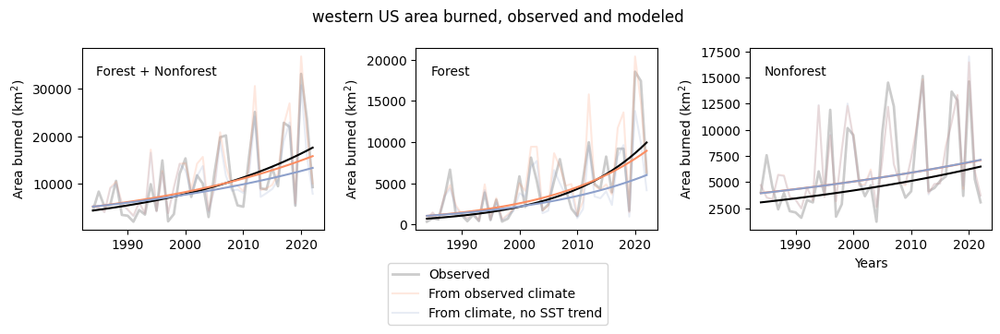

In [22]:
# lil plot of the percent change

# make plot
fig, ax = plt.subplots(1,3, figsize=(11,3), dpi=50)

fig.suptitle('western US area burned, observed and modeled')
for i in np.arange(0,3):
    ax[i].plot(sumswumi[i], label='Observed', c='k', linewidth=2, alpha=0.2)
    ax[i].plot(xyears, sumsBA[i], label='From observed climate', c=colorobs, alpha=0.2)
    ax[i].plot(xyears, sumsBA_DT[i], label='From climate, no SST trend', c=colorDT, alpha=0.2)
    ax[i].set_ylabel('Area burned (km$^2$)')

ax[2].set_xlabel('Years')
fig.legend(['Observed', 'From observed climate', 'From climate, no SST trend'], bbox_to_anchor=(0.5,-0.05), loc='center')
ax[0].annotate('Forest + Nonforest',(0.06,0.85), c='#000', xycoords='axes fraction' )
ax[1].annotate('Forest',(0.06,0.85), c='#000', xycoords='axes fraction' )
ax[2].annotate('Nonforest',(0.06,0.85), c='#000', xycoords='axes fraction' )

# (8/8/2024) Purposely changed all trendline starts to the observed BA intercept
# plot 1 trendlines
ax[0].plot(xyears, 10**(m_all_obs.slope*xyears+m_all_obs.intercept), c='k')
ax[0].plot(xyears, 10**(m_all_clim.slope*xyears+m_all_clim.intercept), c=colorobs)
ax[0].plot(xyears, 10**(m_all_climdt.slope*xyears+m_all_climdt.intercept), c=colorDT)

# plot 2 trendlines
ax[1].plot(xyears, 10**(m_for_obs.slope*xyears+m_for_obs.intercept), c='k')
ax[1].plot(xyears, 10**(m_for_clim.slope*xyears+m_for_clim.intercept), c=colorobs)
ax[1].plot(xyears, 10**(m_for_climdt.slope*xyears+m_for_climdt.intercept), c=colorDT)

# plot 3 trendlines
ax[2].plot(xyears, 10**(m_non_obs.slope*xyears+m_non_obs.intercept), c='k')
ax[2].plot(xyears, 10**(m_non_clim.slope*xyears+m_non_clim.intercept), c=colorobs)
ax[2].plot(xyears, 10**(m_non_climdt.slope*xyears+m_non_climdt.intercept), c=colorDT)

fig.tight_layout()
#plt.savefig(figfolder + 'AGU2022_AreaBurned_models.png')


## Sum of burned area from gSST

In [23]:
# calculations
print('Proportion of TOTAL (SUM) BA from gSST')
print('all: {:.2f}%'.format((sum_BAclimpredall.sum()-sum_BAclimpredall_DT.sum())/(sum_BAclimpredall.sum())*100))
print('forest: {:.2f}%'.format((sum_BAclimpredfor.sum()-sum_BAclimpredfor_DT.sum())/(sum_BAclimpredfor.sum())*100))
print('nonforest: {:.2f}%'.format((sum_BAclimprednon.sum()-sum_BAclimprednon_DT.sum())/(sum_BAclimprednon.sum())*100))

Proportion of TOTAL (SUM) BA from gSST
all: 11.16%
forest: 25.97%
nonforest: 0.26%


# Percent change maps for observed and SST-predicted ecoregions

* Two maps:
    * first map: % magnitude of the observed BA trend (0-1500%)
    * second map: proportion of the trend that would have changed if ENSO trend was reversed: 
        * ((SST-predicted, negative -  SSTpredicted, observed) / observed % change in BA)*100
        
We calculate with the log-transformed data to avoid the y-intercept being a negative burned area amount.

For calculating the percent change in SST-trended vs. SST-detrended timeseries:

growth = ((predicted - initial) / initial

where predicted = 10^(m*finalyear + b)

and initial = 10^(m*firstyear + b)


In [24]:
# need a custom log percentage formatter for the colorbar
# Custom formatter to handle both positive and negative ticks
# thank you ChatGPT and the GitHub and StackOverflow it is based off.
def format_LogToIntegercolorbar(val, pos):
    if val == 0:
        return "0"
    elif val < 0:
        return f"-{int(-val)}"  # Handle negative values with proper sign
    else:
        return f"{int(val)}"    # Handle positive values

1 WUMI_for 56.85/5.09*100=1117.86
2 WUMI_for 652.17/49.94*100=1305.90
4 WUMI_for nan/nan*100=nan
5 WUMI_for 4.18/6.13*100=68.30
7 WUMI_for nan/nan*100=nan
8 WUMI_for 812.58/20.77*100=3912.54
9 WUMI_for nan/nan*100=nan
10 WUMI_for 513.69/10.35*100=4962.35
12 WUMI_for 101.80/20.54*100=495.68
13 WUMI_for 79.13/17.98*100=439.98
14 WUMI_for 158.52/22.01*100=720.34
15 WUMI_for 1009.76/174.87*100=577.44
16 WUMI_for 129.85/11.27*100=1152.04
17 WUMI_for 255.82/14.41*100=1775.34
19 WUMI_for 2932.04/113.55*100=2582.17
20 WUMI_for 1050.78/22.26*100=4721.09
21 WUMI_for nan/nan*100=nan


/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y


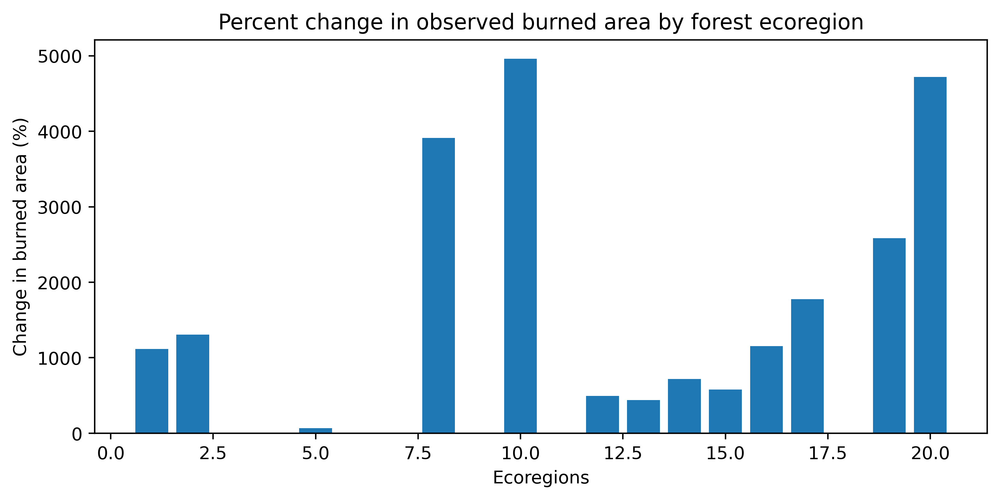

In [25]:
# get OBSERVED burn area trend FORESTS, by ECOPROVINCE
# I used Theil-Sen Trendlines instead of the least-squares, in order
# to get trends while de-emphasizing extremes
trend_wumifor_ecoprov = np.zeros(len(dfnum))
btrendwumifor = np.zeros(len(dfnum))
xyears = np.arange(firstyear,finalyear+1,1)

# iterate through ecoregion
for i, thisecoreg in enumerate(dfnum):
    # get the timeseries for ecoregion
    sum_wumifor = (wumifor.loc[:,str(thisecoreg)])
    # save the trend
    tmptrend = theilslopes(np.log10(sum_wumifor), x=xyears, method='joint')

    trend_wumifor_ecoprov[i] = tmptrend[0]
    btrendwumifor[i] = tmptrend[1]

# get the percent change in burned area, using the m and b values calculated above
delta_wumifor_ecoprov = np.zeros(len(dfnum))

for i in np.arange(len(dfnum)):
    # wumi observed
    pred = 10**(trend_wumifor_ecoprov[i]*(xyears[-1]) + btrendwumifor[i])
    init = 10**(trend_wumifor_ecoprov[i]*(xyears[0]) + btrendwumifor[i])
    tmpresult = ((pred - init) / init)*100
    delta_wumifor_ecoprov[i] = tmpresult
    print('{:} WUMI_for {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (pred-init),init,tmpresult))

# check to see the trendlines
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=dfnum, height=delta_wumifor_ecoprov)
ax.set_xlabel('Ecoregions')
ax.set_ylabel('Change in burned area (%)')
ax.set_title('Percent change in observed burned area by forest ecoregion');

1 WUMI_non -7.35/114.28*100=-6.43
2 WUMI_non 42.99/20.41*100=210.60
4 WUMI_non 27.05/69.42*100=38.96
5 WUMI_non -23.44/309.98*100=-7.56
7 WUMI_non -0.96/40.13*100=-2.39
8 WUMI_non 144.17/17.71*100=814.27
9 WUMI_non 63.69/93.65*100=68.01
10 WUMI_non 88.14/34.17*100=257.95
12 WUMI_non 597.88/115.81*100=516.26
13 WUMI_non 1711.23/1201.61*100=142.41
14 WUMI_non -64.88/396.97*100=-16.34
15 WUMI_non 188.55/71.86*100=262.38
16 WUMI_non 31.86/36.32*100=87.71
17 WUMI_non 88.78/8.96*100=991.12
19 WUMI_non 297.53/88.17*100=337.44
20 WUMI_non 111.31/26.57*100=418.98
21 WUMI_non nan/nan*100=nan


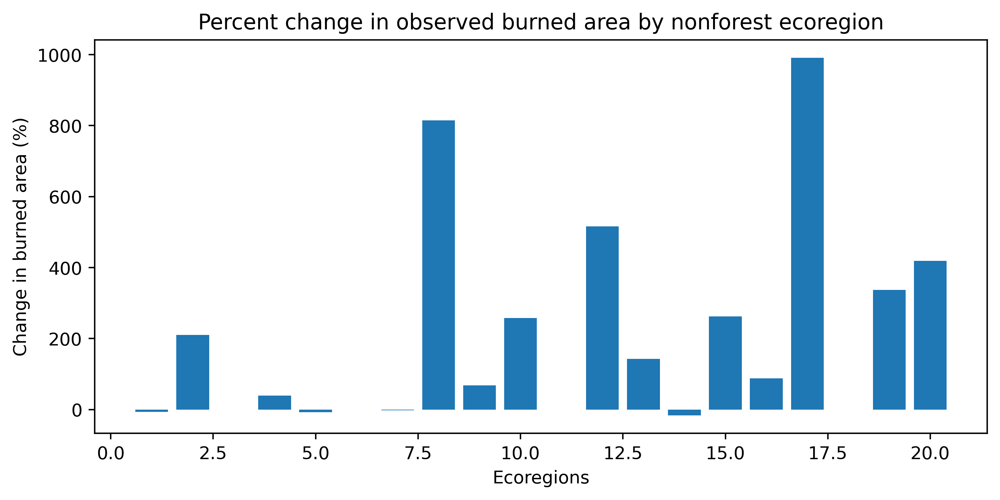

In [26]:
# get OBSERVED burn area trend by NONFORESTS, by ECOPROVINCE
# I used Theil-Sen Trendlines instead of the least-squares, in order
# to get trends while de-emphasizing extremes
trend_wuminon_ecoprov = np.zeros(len(dfnum))
btrendwuminon = np.zeros(len(dfnum))
xplot = np.arange(0, len(wuminon['0']))
xyears = np.arange(firstyear,finalyear+1,1)

# iterate through ecoregion
for i, thisecoreg in enumerate(dfnum):
    # get the timeseries for ecoregion
    sum_wuminon = (wuminon.loc[:,str(thisecoreg)])
    # save the trend
    tmptrend = scipy.stats.mstats.theilslopes(np.log10(sum_wuminon), x=xyears, method='joint')
    trend_wuminon_ecoprov[i] = tmptrend[0]
    btrendwuminon[i] = tmptrend[1]

# get the percent change in burned area, using the m and b values calculated above
delta_wuminon_ecoprov = np.zeros(len(dfnum))

for i in np.arange(len(dfnum)):
    # observed
    pred = 10**(trend_wuminon_ecoprov[i]*(xyears[-1]) + btrendwuminon[i])
    init = 10**(trend_wuminon_ecoprov[i]*(xyears[0]) + btrendwuminon[i])
    tmpresult = ((pred - init) / init)*100
    delta_wuminon_ecoprov[i] = tmpresult
    print('{:} WUMI_non {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (pred-init),init,tmpresult))

# check to see the trendlines
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=dfnum, height=delta_wuminon_ecoprov)
ax.set_xlabel('Ecoregions')
ax.set_ylabel('Change in burned area (%)')
ax.set_title('Percent change in observed burned area by nonforest ecoregion');

## plot percent change in observed burned area (but colored by LOG SCALE)
* This is calculated by WUMI minus the SST-contribution to WUMI (the difference between observed climate into the climate-BA model and SST-removed climate into the climate-BA model.

## Custom Colormap for log(BA) plots

(5/2024) Created a custom colormap with the following requirements:
* Cut the minimum value to 10^2, but maximum is 10^3, so the white needs to be re-centered to the location of zero.
* Red needs to be positive values
* Blue needs to be negative values
* Need to differentiate the 10^2 from 10^1 values. Need a colorbar that can show distinct colors without going rainbow.

(8/2024) using Colorcet
https://colorcet.holoviz.org/user_guide/index.html

In [27]:
# custom colormap attempt 3
# (thanks chatgpt and all that's being trained, 
# including stackoverflow and github)

# Load the CET-D01A colormap from colorcet
# color guide: https://colorcet.holoviz.org/user_guide/index.html
cet_d01a = matplotlib.colormaps['cet_CET_D1A']
#cet_d01a = matplotlib.colormaps['cet_CET_D9'] 

# divergingbwr

# Define the number of colors
N = 256

# Initialize the array for colors with alpha channel set to 1
vals = np.ones((N, 4))

# Split the colormap into 1/3 red and 2/3 blue
num_blue = 1 * N // 7 # for the blue section
num_white = 3 * N // 7 # add white
num_red = 3 * N // 7  # for the red section

# Get the colors from CET-D1A and split into red and blue segments
blue_segment = cet_d01a(np.linspace(0.20, 0.49, num_blue))  # First half for red
white_segment = cet_d01a(np.linspace(0.49, 0.51, num_white))  # Pure white section
red_segment = cet_d01a(np.linspace(0.51, 1, num_red))  # Second half for blue01A and split into red, white, and blue segments


# Combine red and blue segments
newcolors = np.vstack((blue_segment, white_segment, red_segment))

# Create the custom colormap
custom_RdBu3 = mcolors.ListedColormap(newcolors, name='custom_RdBu3')

## Plotting

68.2994154398994
4962.353947102011
-16.343704949879026
991.1150415109965


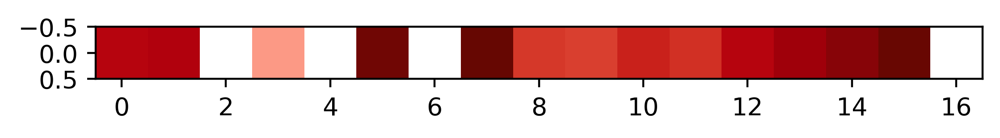

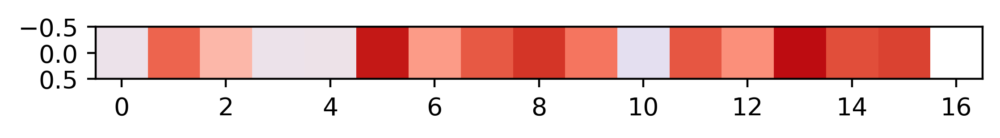

In [28]:
# colorbar
# set vmin and vmax with these
cbarmax = 5000
cbarmin = -100 # minimum possible %

# log-scaled colorbar. 
# linthresh=10 makes the first marker start at 10^1 instead of 10^0
thisnorm = mcolors.SymLogNorm(linthresh=10, base=10,
           vmin=cbarmin, vmax=cbarmax)

# for colorbar
tmpdelta_wumifor = np.expand_dims(delta_wumifor_ecoprov, axis=0)
fig, ax = plt.subplots()
d1 = ax.imshow(tmpdelta_wumifor,cmap=custom_RdBu3, 
               norm=thisnorm)
print(np.nanmin(delta_wumifor_ecoprov))
print(np.nanmax(delta_wumifor_ecoprov))

tmpdelta_wuminon = np.expand_dims(delta_wuminon_ecoprov, axis=0)
fig, ax = plt.subplots()
d1 = ax.imshow(tmpdelta_wuminon, cmap=custom_RdBu3,
              norm=thisnorm)
print(np.nanmin(delta_wuminon_ecoprov))
print(np.nanmax(delta_wuminon_ecoprov))


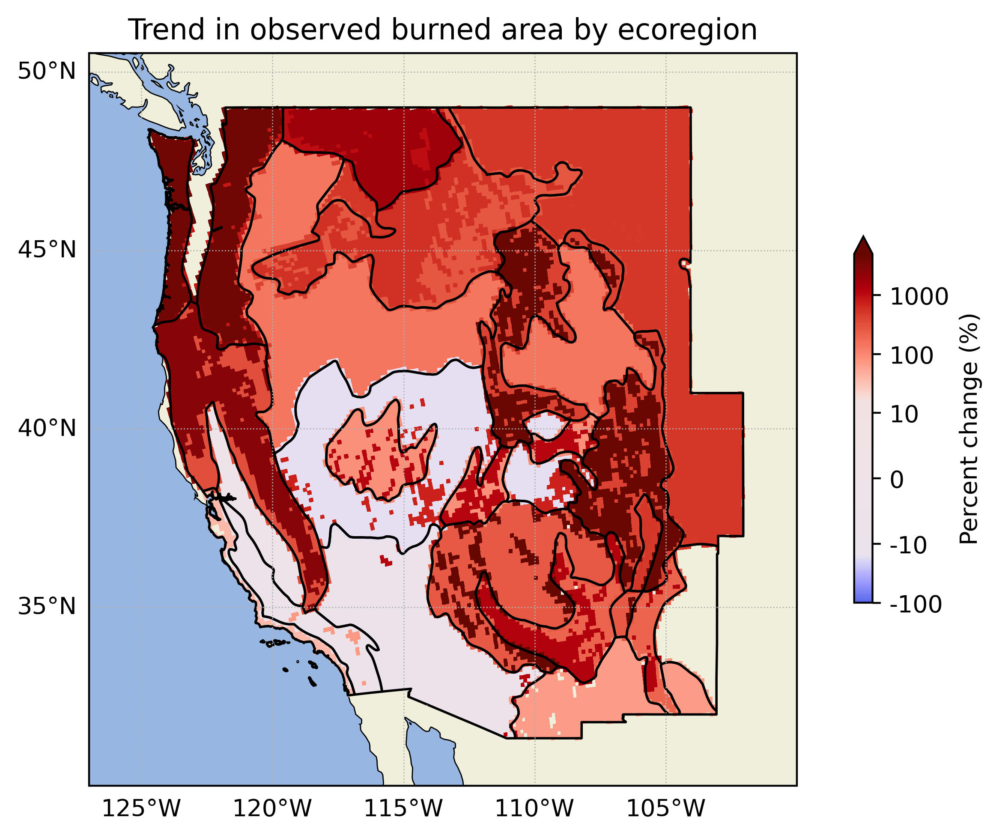

In [29]:
# OBSERVED % change in burned area
# put percent change on map, by forest and nonforest

fig, ax = plt.subplots(figsize=(7,5),
                       subplot_kw={'projection':ccrs.PlateCarree()})

# plot the western US
extent = [-127,-100,30,50]
# add map features
ax.set_extent(extent)
ax.add_feature(LAND, edgecolor='black')
ax.add_feature(OCEAN)
#ax.add_feature(states, linewidth=0.8, edgecolor='k', alpha=0.5, zorder=2)


# PLOT DATA
counter = 0 # start at first province, since 0=allwestUS
# diverging colormap centered at zero

# add the VPD data
for thisregnum in dfnum:
    xr.where((ecoregfor.sel(province=thisregnum))>0,
             delta_wumifor_ecoprov[counter],np.nan).plot(
        ax=ax, cmap=custom_RdBu3, 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        norm=thisnorm)
    xr.where((ecoregnon.sel(province=thisregnum))>0,
             delta_wuminon_ecoprov[counter],np.nan).plot(
        ax=ax, cmap=custom_RdBu3,
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=0,
        norm=thisnorm)
    counter+=1

# decorate

# add edgeline of each ecoregion
Becoprov.boundary.plot(linewidth=1,
               edgecolor='k', ax=ax, zorder=2)

# decorate
ax.set_title('Trend in observed burned area by ecoregion')
ax.set_aspect(1.362/1)
#ax.set_yticks(([30, 35, 40, 45, 50]))
#ax.set_xticks((range(-130, -95, 5)))
ax.set_ylabel('Latitude ($^\circ$)')
ax.set_xlabel('Longitude ($^\circ$)')
BAgrid1 = ax.gridlines(xlocs=(range(-130, -95, 5)), 
             ylocs=([30, 35, 40, 45, 50]), crs=ccrs.PlateCarree(), 
             draw_labels=True,
             linewidth=0.5, linestyle=':')
BAgrid1.top_labels = False
BAgrid1.right_labels = False

# colorbar from other jupyterlab cell
thiscbar = fig.colorbar(d1, label='Percent change (%)', extend='max', cmap=custom_RdBu3, shrink=0.5, ax=ax)
thiscbar.formatter = FuncFormatter(format_LogToIntegercolorbar) # change 10^2% to 100%, custom formatter
thiscbar.update_ticks()

ax.set_facecolor("white")
fig.patch.set_alpha(0)

fig.tight_layout()
#plt.savefig(figfolder + 'EcoregMap_pctchange_wumiBA.png')

## plot percent change in DT-scenario burned area TAKE 2 (but colored by LOG SCALE)
* This is model-observed SST trend minus model-detrended SST-scenario trend

ecoprov1
1 model -0.99/5.09*100=-19.49
1 modelDT -0.99/5.09*100=-19.49
$\Delta_obsclim$ minus $\Delta_DTclim$ = 0.00 %
difference in % change, 95%CI:: 0.00 to 0.00 %

FOREST: How much of the trend? 0.00 km2/yr, 0.00 %
	lower bound: 0.00% , upper bound: 0.00%
ecoprov2
2 model 338.21/49.94*100=677.23
2 modelDT 180.79/49.94*100=362.02
$\Delta_obsclim$ minus $\Delta_DTclim$ = 315.21 %
difference in % change, 95%CI:: 219.62 to 689.19 %

FOREST: How much of the trend? 315.21 km2/yr, 24.14 %
	lower bound: 16.82% , upper bound: 52.77%
ecoprov4
4 model 1.87/nan*100=nan
4 modelDT 1.62/nan*100=nan
$\Delta_obsclim$ minus $\Delta_DTclim$ = nan %
difference in % change, 95%CI:: nan to nan %

FOREST: How much of the trend? nan km2/yr, nan %
	lower bound: nan% , upper bound: nan%
ecoprov5
5 model 22.21/6.13*100=362.62
5 modelDT 12.32/6.13*100=201.21
$\Delta_obsclim$ minus $\Delta_DTclim$ = 161.42 %
difference in % change, 95%CI:: 36.15 to 520.56 %

FOREST: How much of the trend? 161.42 km2/yr, 236.33 

Text(0.5, 1.0, 'Difference (ppts) of gSST-contributed trend by forest ecoregion')

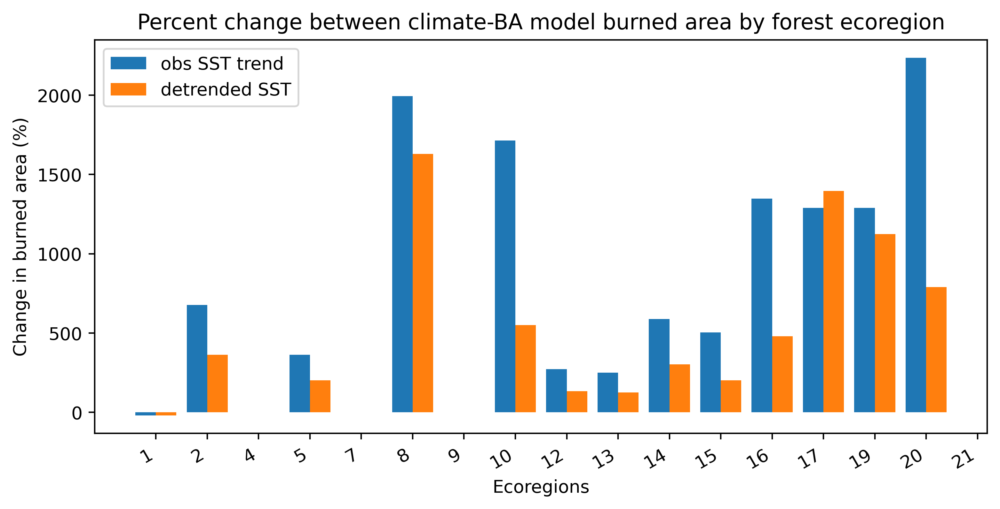

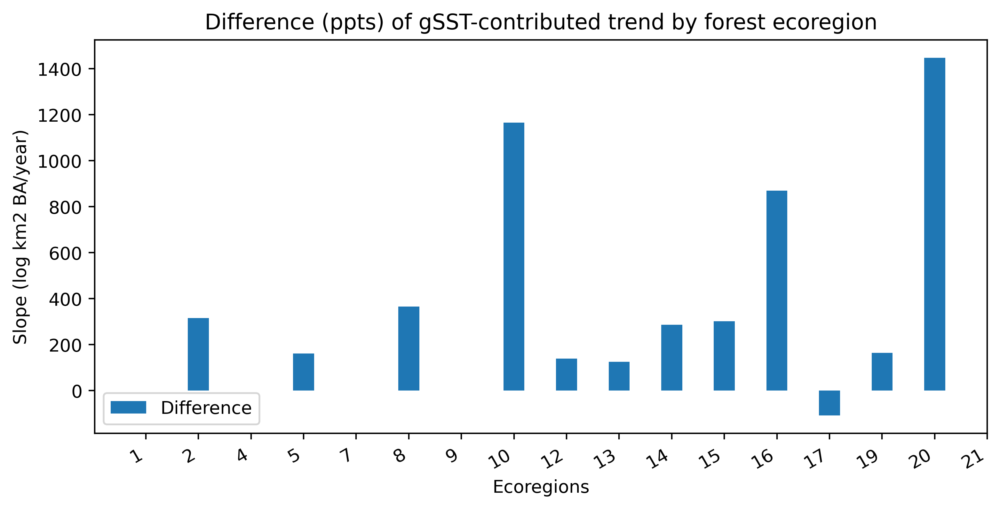

19 model 1463.67/113.55*100=1289.02
19 modelDT 1677.96/113.55*100=1477.74
$\Delta_obsclim$ minus $\Delta_DTclim$ = -188.72 %
difference in % change, 95%CI:: -298.44 to -111.70 %

FOREST: How much of the trend? -188.72 km2/yr, -7.31 %
	lower bound: -11.56% , upper bound: -4.33%
ecoprov20


20 model 497.74/22.26*100=2236.31
20 modelDT 175.65/22.26*100=789.17
$\Delta_obsclim$ minus $\Delta_DTclim$ = 1447.14 %
difference in % change, 95%CI:: 897.85 to 3280.86 %

FOREST: How much of the trend? 1447.14 km2/yr, 30.65 %
	lower bound: 19.02% , upper bound: 69.49%
ecoprov21
21 model -0.01/nan*100=nan
21 modelDT -0.01/nan*100=nan
$\Delta_obsclim$ minus $\Delta_DTclim$ = nan %
difference in % change, 95%CI:: nan to nan %

FOREST: How much of the trend? nan km2/yr, nan %
	lower bound: nan% , upper bound: nan%


Text(0.5, 1.0, 'Difference (ppts) of gSST-contributed trend by forest ecoregion')

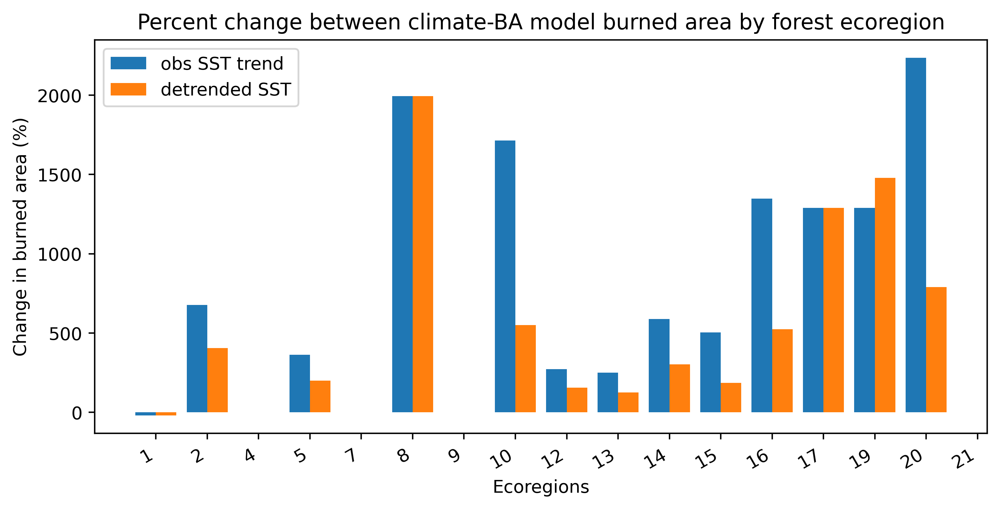

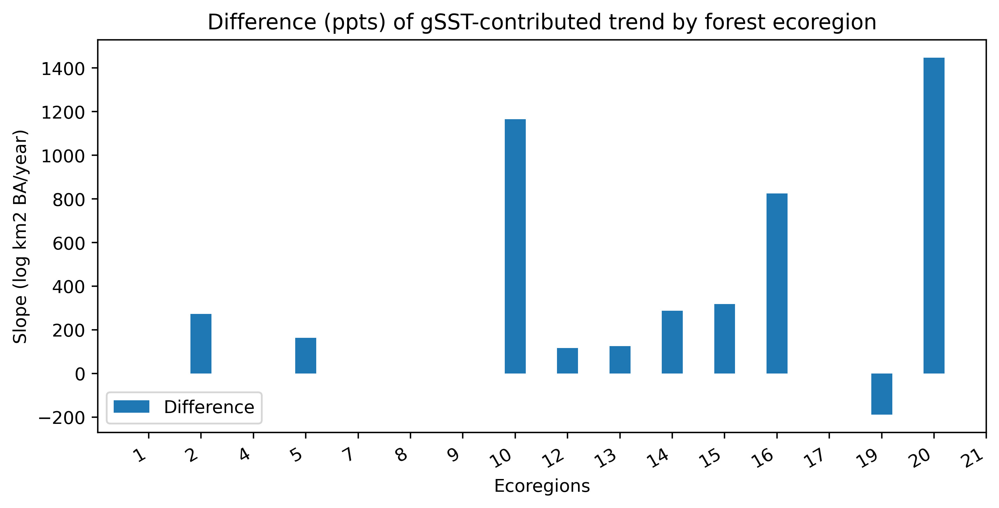

In [30]:
# get MODELED burn area trend FORESTS, by ECOPROVINCE
# I used Theil-Sen Trendlines instead of the least-squares, in order
# to get trends while de-emphasizing extremes
trend_modelfor_ecoprov = np.zeros(len(dfnum))
btrendmodelfor = np.zeros(len(dfnum))
trend_modelforDT_ecoprov = np.zeros(len(dfnum))
btrendmodelforDT = np.zeros(len(dfnum))

# storage for percent change in burned area, using MEAN BA trend
delta_modelfor_ecoprov = np.zeros(len(dfnum))
delta_modelforDT_ecoprov = np.zeros(len(dfnum))
# storage for percent change confidence intervals
delta_modelfor_ecoprov_lo = np.zeros(len(dfnum))
delta_modelfor_ecoprov_hi = np.zeros(len(dfnum))

xyears = np.arange(firstyear,finalyear+1,1)
xplot = np.arange(0, len(BAclimpredfor['ecoprov1_0']))

# CALCULATE MODELED TRENDS BY ECOREGION
for i, thisdfnum in enumerate(dfnum):
    # select all that have the ecoregion name in it
    thisname = []
    thisname.extend(BAclimpredfor.filter(like=(dfnames[i+1]+'_')).columns)
    print(dfnames[i+1])
    # start with area burned for the ecoprovince
    model_members = (BAclimpredfor.loc[:,thisname])
    modelDT_members = (BAclimpredfor_DT.loc[:,thisname])
    
    # apply Theil-Sen trendline to each member 
    # (the ensemble_trends script takes in unlogged BA)
    tmpslopes, tmpintercepts = ensemble_trends(10**model_members, xyears)
    tmpslopes_DT, tmpintercepts_DT = ensemble_trends(10**modelDT_members, xyears)
    
    # get wumi initial value from observed trendline
    tmpinit0 = 10**(trend_wumifor_ecoprov[i]*(xyears[0]) + btrendwumifor[i])
    # get percent change from pairs in 500-member ensemble
    # pairwise for each member:
    # get percent change for orange member
    # get percent change for blue member
    percchange = percent_change_distribution(tmpslopes,
                                             tmpintercepts, 
                                             xyears, denom=tmpinit0)
    percchange_DT = percent_change_distribution(tmpslopes_DT,
                                                tmpintercepts_DT,
                                                xyears, denom=tmpinit0)
    # MEAN
    sum_modelfor = model_members.mean(axis=1)
    sum_modelforDT = modelDT_members.mean(axis=1)
    # save the MEAN trend
    tmptrend = theilslopes(sum_modelfor, x=xyears, method='joint')
    tmptrendDT = theilslopes(sum_modelforDT, x=xyears, method='joint')
    
    trend_modelfor_ecoprov[i] = tmptrend.slope
    btrendmodelfor[i] = tmptrend.intercept
    trend_modelforDT_ecoprov[i] = tmptrendDT.slope
    btrendmodelforDT[i] = tmptrendDT.intercept
    
    # model observed SST scenario
    init0 = 10**(trend_wumifor_ecoprov[i]*(xyears[0])+btrendwumifor[i])
    pred = 10**(trend_modelfor_ecoprov[i]*(xyears[-1]) + btrendmodelfor[i])
    init = 10**(trend_modelfor_ecoprov[i]*(xyears[0]) + btrendmodelfor[i])
    tmpresult = ((pred - init)/(init0))*100
    delta_modelfor_ecoprov[i] = tmpresult
    print('{:} model {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (pred-init),
                                                      init0,tmpresult))
    # model DT-scenario
    predDT = 10**(trend_modelforDT_ecoprov[i]*(xyears[-1]) + btrendmodelforDT[i])
    initDT = 10**(trend_modelforDT_ecoprov[i]*(xyears[0]) + btrendmodelforDT[i])
    tmpresult = ((predDT - initDT)/(init0))*100
    delta_modelforDT_ecoprov[i] = tmpresult
    print('{:} modelDT {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (predDT-initDT),
                                                        init0,tmpresult))
    
    
    # get difference in percent change for pairwise ensemble members
    percchange_diff = percchange - percchange_DT
    # get confidence interval in percent change difference
    percchange_diff_CI = np.percentile(percchange_diff, [2.5,97.5])
    print('$\Delta_obsclim$ minus $\Delta_DTclim$ = {:.2f} %'.format(
        delta_modelfor_ecoprov[i]-delta_modelforDT_ecoprov[i]))
    print('difference in % change, 95%CI:: {:.2f} to {:.2f} %'.format(percchange_diff_CI[0], 
                                                                   percchange_diff_CI[1]))
    
    # calculate percent change contribution to observed trend
    finalrawchange_for = delta_modelfor_ecoprov[i]-delta_modelforDT_ecoprov[i]
    finaltrendper_for = (delta_modelfor_ecoprov[i]-delta_modelforDT_ecoprov[i])/(delta_wumifor_ecoprov[i])*100
    finaltrendper_for_hi = (percchange_diff_CI[1])/delta_wumifor_ecoprov[i]*100
    finaltrendper_for_lo = (percchange_diff_CI[0])/delta_wumifor_ecoprov[i]*100
    print('\nFOREST: How much of the trend? {:.2f} km2/yr, {:.2f} %'.format(finalrawchange_for, 
                                                                            finaltrendper_for))
    print('\tlower bound: {:.2f}% , upper bound: {:.2f}%'.format(finaltrendper_for_lo, 
                                                                finaltrendper_for_hi))
    # store confidence intervals
    delta_modelfor_ecoprov_lo[i] = finaltrendper_for_lo
    delta_modelfor_ecoprov_hi[i] = finaltrendper_for_hi
    
    
xplot = np.arange(len(dfnum))

# check to see the trendlines
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=xplot-0.2, height=delta_modelfor_ecoprov, width=0.4,
       label='obs SST trend')
ax.bar(x=xplot+0.2, height=delta_modelforDT_ecoprov, width=0.4,
       label='detrended SST')
ax.set_xlabel('Ecoregions')
ax.set_xticks(xplot, dfnum, rotation=30, ha='right')
ax.legend()
ax.set_ylabel('Change in burned area (%)')
ax.set_title('Percent change between climate-BA model burned area by forest ecoregion')

# check to see percentage point difference
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=xplot, height=(delta_modelfor_ecoprov-delta_modelforDT_ecoprov), width=0.4,
       label='Difference')
ax.set_xlabel('Ecoregions')
ax.legend()
ax.set_xticks(xplot, dfnum, rotation=30, ha='right')
ax.set_ylabel('Slope (log km2 BA/year)')
ax.set_title('Difference (ppts) of gSST-contributed trend by forest ecoregion')

ecoprov1
1 model -15.64/114.28*100=-13.68
1 modelDT 14.93/114.28*100=13.06
$\Delta_obsclim$ minus $\Delta_DTclim$ = -26.75 %
difference in % change, 95%CI:: -50.13 to -17.15 %

NON-FOREST: How much of the trend? -32.55 km2/yr, 506.04 %
	lower bound: 779.34% , upper bound: 266.58%
ecoprov2
2 model 62.83/20.41*100=307.85
2 modelDT 36.78/20.41*100=180.22
$\Delta_obsclim$ minus $\Delta_DTclim$ = 127.63 %
difference in % change, 95%CI:: 61.25 to 392.39 %

NON-FOREST: How much of the trend? 497.01 km2/yr, 235.99 %
	lower bound: 29.08% , upper bound: 186.32%
ecoprov4
4 model 55.90/69.42*100=80.53
4 modelDT 55.03/69.42*100=79.28
$\Delta_obsclim$ minus $\Delta_DTclim$ = 1.25 %
difference in % change, 95%CI:: 0.66 to 3.57 %

NON-FOREST: How much of the trend? nan km2/yr, nan %
	lower bound: 1.70% , upper bound: 9.15%
ecoprov5
5 model 203.94/309.98*100=65.79
5 modelDT 277.18/309.98*100=89.42
$\Delta_obsclim$ minus $\Delta_DTclim$ = -23.63 %
difference in % change, 95%CI:: -51.54 to -13.50 %

NON-

Text(0.5, 1.0, 'Difference (ppts) of gSST-contributed trend by non-forest ecoregion')

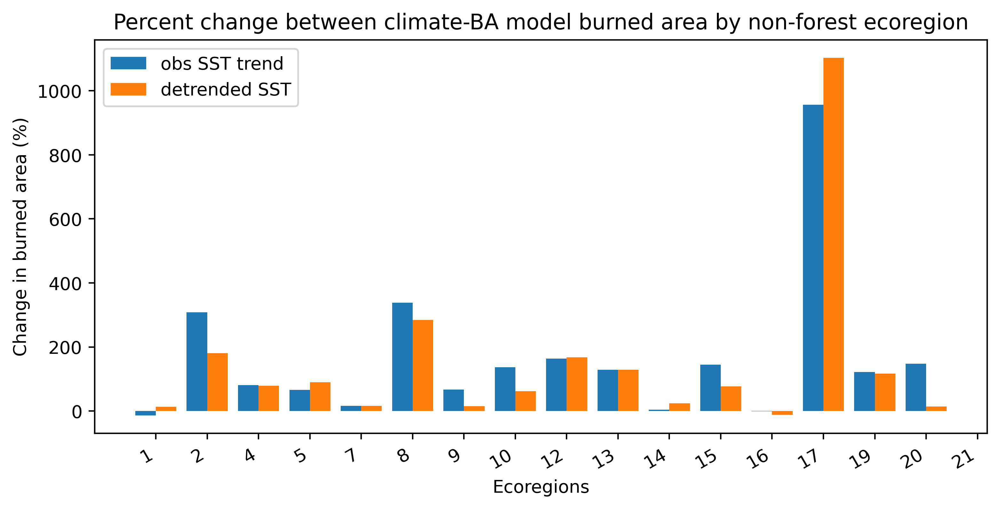

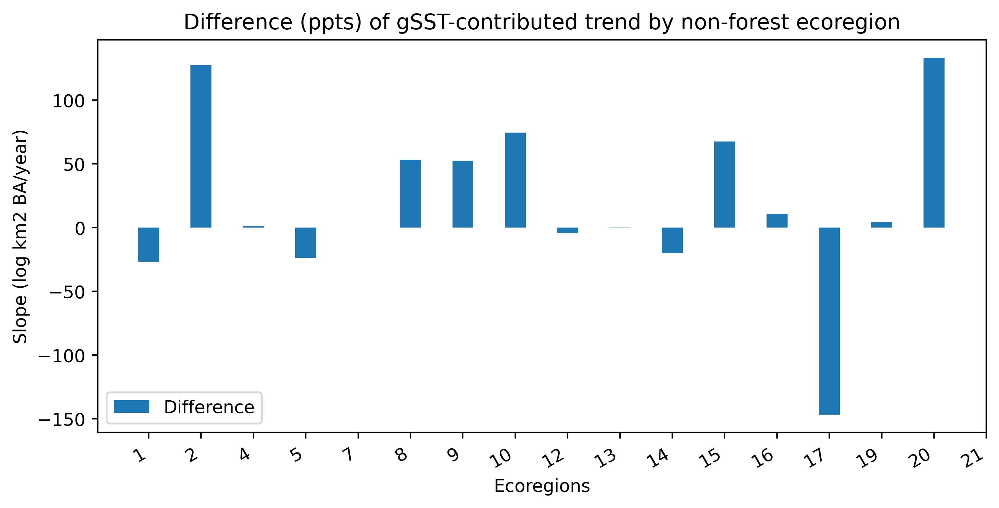

19 model 107.12/88.17*100=121.49
19 modelDT 107.02/88.17*100=121.38
$\Delta_obsclim$ minus $\Delta_DTclim$ = 0.12 %
difference in % change, 95%CI:: -0.58 to 0.71 %

NON-FOREST: How much of the trend? 1167.64 km2/yr, 346.03 %
	lower bound: -0.17% , upper bound: 0.21%
ecoprov20
20 model 39.10/26.57*100=147.20
20 modelDT 9.43/26.57*100=35.50
$\Delta_obsclim$ minus $\Delta_DTclim$ = 111.69 %
difference in % change, 95%CI:: 60.89 to 165.60 %

NON-FOREST: How much of the trend? 2200.80 km2/yr, 525.27 %
	lower bound: 14.53% , upper bound: 39.52%
ecoprov21


21 model -57.33/nan*100=nan
21 modelDT -65.73/nan*100=nan
$\Delta_obsclim$ minus $\Delta_DTclim$ = nan %
difference in % change, 95%CI:: nan to nan %

NON-FOREST: How much of the trend? nan km2/yr, nan %
	lower bound: nan% , upper bound: nan%


Text(0.5, 1.0, 'Difference (ppts) of gSST-contributed trend by non-forest ecoregion')

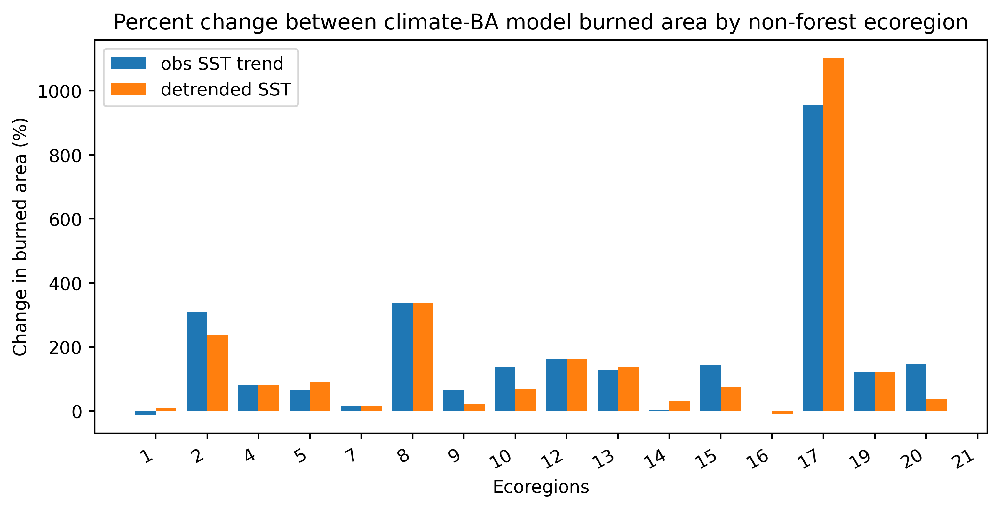

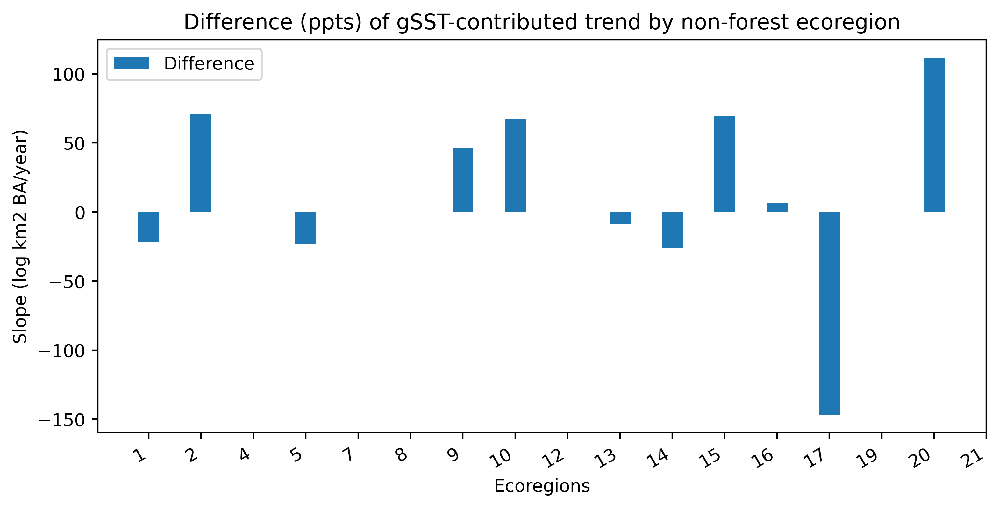

In [31]:
# get MODELED burn area trend NON-FORESTS, by ECOPROVINCE
# I used Theil-Sen Trendlines instead of the least-squares, in order
# to get trends while de-emphasizing extremes
trend_modelnon_ecoprov = np.zeros(len(dfnum))
btrendmodelnon = np.zeros(len(dfnum))
trend_modelnonDT_ecoprov = np.zeros(len(dfnum))
btrendmodelnonDT = np.zeros(len(dfnum))

# storage for percent change in burned area, using MEAN BA trend
delta_modelnon_ecoprov = np.zeros(len(dfnum))
delta_modelnonDT_ecoprov = np.zeros(len(dfnum))
# storage for percent change confidence intervals
delta_modelnon_ecoprov_lo = np.zeros(len(dfnum))
delta_modelnon_ecoprov_hi = np.zeros(len(dfnum))

xyears = np.arange(firstyear,finalyear+1,1)
xplot = np.arange(0, len(BAclimprednon['ecoprov1_0']))

# CALCULATE MODELED TRENDS BY ECOREGION
for i, thisdfnum in enumerate(dfnum):
    # select all that have the ecoregion name in it
    thisname = []
    thisname.extend(BAclimprednon.filter(like=(dfnames[i+1]+'_')).columns)
    print(dfnames[i+1])
    # start with area burned for the ecoprovince
    model_members = (BAclimprednon.loc[:,thisname])
    modelDT_members = (BAclimprednon_DT.loc[:,thisname])
    
    # apply Theil-Sen trendline to each member 
    # (the ensemble_trends script takes in unlogged BA)
    tmpslopes, tmpintercepts = ensemble_trends(10**model_members, xyears)
    tmpslopes_DT, tmpintercepts_DT = ensemble_trends(10**modelDT_members, xyears)
    
    # get wumi initial value from observed trendline
    tmpinit0 = 10**(trend_wuminon_ecoprov[i]*(xyears[0]) + btrendwuminon[i])
    # get percent change from pairs in 500-member ensemble
    # pairwise for each member:
    # get percent change for orange member
    # get percent change for blue member
    percchange = percent_change_distribution(tmpslopes,
                                             tmpintercepts, 
                                             xyears, denom=tmpinit0)
    percchange_DT = percent_change_distribution(tmpslopes_DT,
                                                tmpintercepts_DT,
                                                xyears, denom=tmpinit0)
    # MEAN
    sum_modelnon = model_members.mean(axis=1)
    sum_modelnonDT = modelDT_members.mean(axis=1)
    # save the MEAN trend
    tmptrend = theilslopes(sum_modelnon, x=xyears, method='joint')
    tmptrendDT = theilslopes(sum_modelnonDT, x=xyears, method='joint')
    
    trend_modelnon_ecoprov[i] = tmptrend.slope
    btrendmodelnon[i] = tmptrend.intercept
    trend_modelnonDT_ecoprov[i] = tmptrendDT.slope
    btrendmodelnonDT[i] = tmptrendDT.intercept
    
    # model observed SST scenario
    init0 = 10**(trend_wuminon_ecoprov[i]*(xyears[0])+btrendwuminon[i])
    pred = 10**(trend_modelnon_ecoprov[i]*(xyears[-1]) + btrendmodelnon[i])
    init = 10**(trend_modelnon_ecoprov[i]*(xyears[0]) + btrendmodelnon[i])
    tmpresult = ((pred - init)/(init0))*100
    delta_modelnon_ecoprov[i] = tmpresult
    print('{:} model {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (pred-init),
                                                      init0,tmpresult))
    # model DT-scenario
    predDT = 10**(trend_modelnonDT_ecoprov[i]*(xyears[-1]) + btrendmodelnonDT[i])
    initDT = 10**(trend_modelnonDT_ecoprov[i]*(xyears[0]) + btrendmodelnonDT[i])
    tmpresult = ((predDT - initDT)/(init0))*100
    delta_modelnonDT_ecoprov[i] = tmpresult
    print('{:} modelDT {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (predDT-initDT),
                                                        init0,tmpresult))
    
    
    # get difference in percent change for pairwise ensemble members
    percchange_diff = percchange - percchange_DT
    # get confidence interval in percent change difference
    percchange_diff_CI = np.percentile(percchange_diff, [2.5,97.5])
    print('$\Delta_obsclim$ minus $\Delta_DTclim$ = {:.2f} %'.format(
        delta_modelnon_ecoprov[i]-delta_modelnonDT_ecoprov[i]))
    print('difference in % change, 95%CI:: {:.2f} to {:.2f} %'.format(percchange_diff_CI[0], 
                                                                   percchange_diff_CI[1]))
    
    # calculate percent change contribution to observed trend
    finalrawchange_non = delta_modelfor_ecoprov[i]-delta_modelnonDT_ecoprov[i]
    finaltrendper_non = (delta_modelfor_ecoprov[i]-delta_modelnonDT_ecoprov[i])/(delta_wuminon_ecoprov[i])*100
    finaltrendper_non_hi = (percchange_diff_CI[1])/delta_wuminon_ecoprov[i]*100
    finaltrendper_non_lo = (percchange_diff_CI[0])/delta_wuminon_ecoprov[i]*100
    print('\nNON-FOREST: How much of the trend? {:.2f} km2/yr, {:.2f} %'.format(finalrawchange_non, 
                                                                            finaltrendper_non))
    print('\tlower bound: {:.2f}% , upper bound: {:.2f}%'.format(finaltrendper_non_lo, 
                                                                finaltrendper_non_hi))
    # store confidence intervals
    delta_modelnon_ecoprov_lo[i] = finaltrendper_non_lo
    delta_modelnon_ecoprov_hi[i] = finaltrendper_non_hi
    
    
xplot = np.arange(len(dfnum))

# check to see the trendlines
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=xplot-0.2, height=delta_modelnon_ecoprov, width=0.4,
       label='obs SST trend')
ax.bar(x=xplot+0.2, height=delta_modelnonDT_ecoprov, width=0.4,
       label='detrended SST')
ax.set_xlabel('Ecoregions')
ax.set_xticks(xplot, dfnum, rotation=30, ha='right')
ax.legend()
ax.set_ylabel('Change in burned area (%)')
ax.set_title('Percent change between climate-BA model burned area by non-forest ecoregion')

# check to see percentage point difference
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=xplot, height=(delta_modelnon_ecoprov-delta_modelnonDT_ecoprov), width=0.4,
       label='Difference')
ax.set_xlabel('Ecoregions')
ax.legend()
ax.set_xticks(xplot, dfnum, rotation=30, ha='right')
ax.set_ylabel('Slope (log km2 BA/year)')
ax.set_title('Difference (ppts) of gSST-contributed trend by non-forest ecoregion')

In [32]:
# get the difference between the % increase in burned area
# percentage points (ppts)
# difference will show how much of the observed trend is from SST

delta_modelforDiff_ecoprov = delta_modelfor_ecoprov - np.nan_to_num(delta_modelforDT_ecoprov)
delta_modelnonDiff_ecoprov = delta_modelnon_ecoprov - np.nan_to_num(delta_modelnonDT_ecoprov)

-107.97954167229477
1447.1386513055263
-146.64854820337428
133.4290228703874


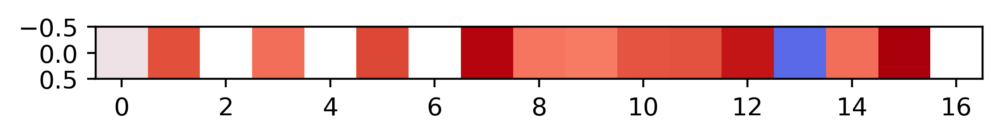

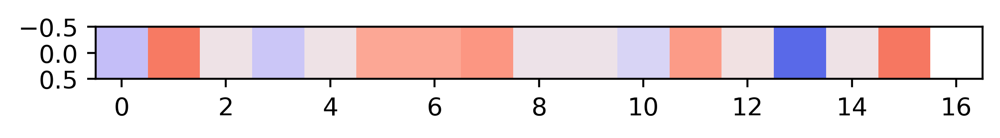

In [33]:
# colorbar
# set vmin and vmax with these
cbarmax = 5000
cbarmin = -100 # minimum possible %
thisplotcmap = custom_RdBu3

# for colorbar
tmpdelta_modelfor = np.expand_dims(delta_modelforDiff_ecoprov, axis=0)
fig, ax = plt.subplots()
d1 = ax.imshow(tmpdelta_modelfor,cmap=custom_RdBu3, 
               norm=mcolors.SymLogNorm(linthresh=10, base=10,
                vmin=cbarmin, vmax=cbarmax))
print(np.nanmin(delta_modelforDiff_ecoprov))
print(np.nanmax(delta_modelforDiff_ecoprov))

tmpdelta_modelnon = np.expand_dims(delta_modelnonDiff_ecoprov, axis=0)
fig, ax = plt.subplots()
d2 = ax.imshow(tmpdelta_modelnon, cmap=custom_RdBu3,
              norm=mcolors.SymLogNorm(linthresh=10, base=10,
            vmin=cbarmin, vmax=cbarmax))
print(np.nanmin(delta_modelnonDiff_ecoprov))
print(np.nanmax(delta_modelnonDiff_ecoprov))


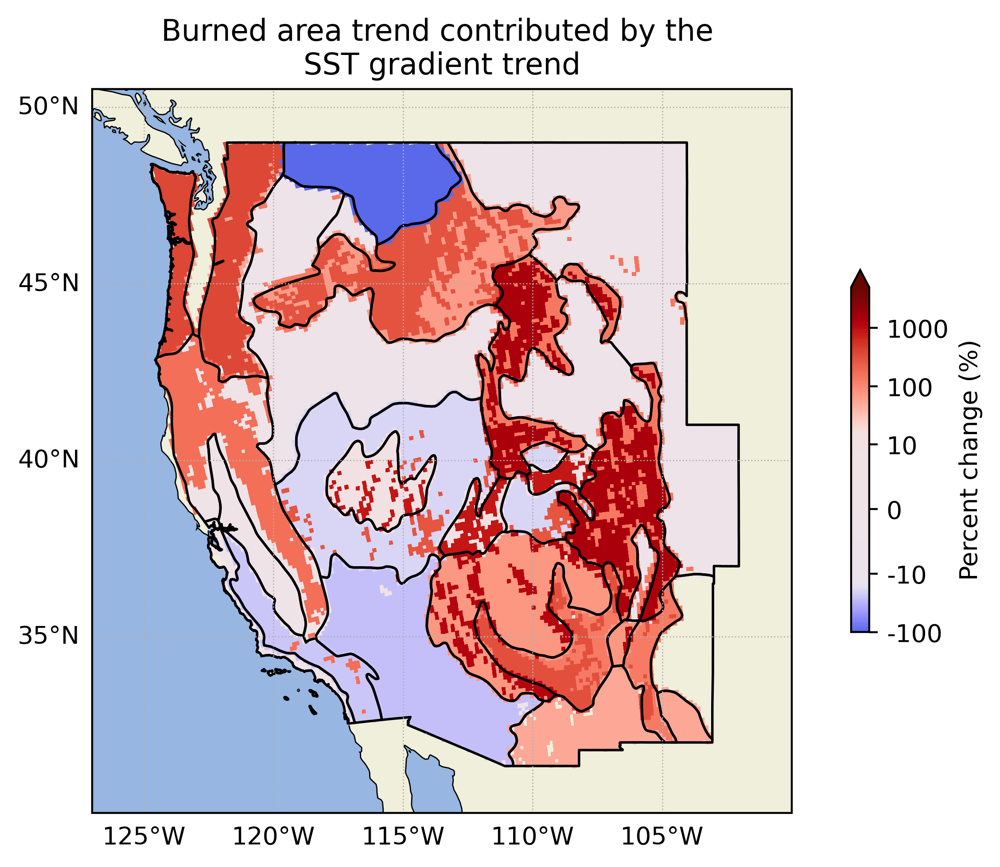

In [34]:
# MODEL DIFFERENCE (by difference in % change) in burned area
# This is the contribution of SST gradient to burned area
thisplotcmap = custom_RdBu3

fig, ax = plt.subplots(figsize=(7,5),
                       subplot_kw={'projection':ccrs.PlateCarree()})
# add map features
ax.set_extent(extent)
ax.add_feature(LAND, edgecolor='black')
ax.add_feature(OCEAN)
#ax.add_feature(states, linewidth=0.8, edgecolor='k', alpha=0.5, zorder=2)


# PLOT DATA
counter = 0 # start at first province, since 0=allwestUS
# add the VPD data
for thisregnum in dfnum:
    xr.where((ecoregfor.sel(province=thisregnum))>0,
             delta_modelforDiff_ecoprov[counter],np.nan).plot(
        ax=ax, cmap=thisplotcmap, 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
           vmin=cbarmin, vmax=cbarmax))
    xr.where((ecoregnon.sel(province=thisregnum))>0,
             delta_modelnonDiff_ecoprov[counter],np.nan).plot(
        ax=ax, cmap=thisplotcmap,
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=0,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
          vmin=cbarmin, vmax=cbarmax))
    counter+=1

# decorate

# add edgeline of each ecoregion
Becoprov.boundary.plot(linewidth=1,
               edgecolor='k', ax=ax, zorder=2)

# decorate
ax.set_title('Burned area trend contributed by the \nSST gradient trend')
ax.set_aspect(1.362/1)
#ax.set_yticks(([30, 35, 40, 45, 50]))
#ax.set_xticks((range(-130, -95, 5)))
ax.set_ylabel('Latitude ($^\circ$)')
ax.set_xlabel('Longitude ($^\circ$)')
BAgrid2 = ax.gridlines(xlocs=(range(-130, -95, 5)), 
             ylocs=([30, 35, 40, 45, 50]), crs=ccrs.PlateCarree(), 
             draw_labels=True,
             linewidth=0.5, linestyle=':')
BAgrid2.top_labels = False
BAgrid2.right_labels = False

# colorbar from other jupyterlab cell
thiscbar = fig.colorbar(d2, label='Percent change (%)', cmap=thisplotcmap,
             extend='max',shrink=0.5, ax=ax)
thiscbar.formatter = FuncFormatter(format_LogToIntegercolorbar) # change 10^2% to 100%, custom formatter
thiscbar.update_ticks()

ax.set_facecolor("white")
fig.patch.set_alpha(0)

fig.tight_layout()
#plt.savefig(figfolder + 'EcoregMap_pctchange_wumiBA.png')

## Stats for burned area percentage contribution


### filter the data

(1/19/2024)

We need to get the max value from forest and nonforest, but some regions have like 2 pixels that end up being the max value. The goal is to filter out max values in regions that only have a small number (5?) pixels that count as the region's trend, so the maximum value is selected only from what looks visibly feasible on the map.

In [35]:
# create a filter for filtering out small pixel counts
# create a filter for filtering out nan values

# for observed BA
wheremaxvalfor = np.zeros(len(dfnum))
wheremaxvalnon = np.zeros(len(dfnum))

# for contribution from SST gradient
wheremaxvalforSST = np.isnan(delta_modelforDiff_ecoprov)
wheremaxvalnonSST = np.isnan(delta_modelnonDiff_ecoprov)
    
# check for NaN values
tmpfilter2for = np.isnan(delta_wumifor_ecoprov)
tmpfilter2non = np.isnan(delta_wuminon_ecoprov)
tmpfilter3for = np.isnan(delta_modelforDiff_ecoprov)
tmpfilter3non = np.isnan(delta_modelnonDiff_ecoprov)

count = 0
for thisregnum in dfnum:
    tmppixelcount = 5
    tmpfilter = np.count_nonzero((ecoregfor.sel(province=thisregnum))>0)
    if (tmpfilter < tmppixelcount) or (tmpfilter2for[count]==True):
        wheremaxvalfor[count] = 1 # set to "True"
    if (tmpfilter < tmppixelcount) or (tmpfilter3for[count]==True):
        wheremaxvalforSST[count] = 1 # set to "True"
    
    tmpfilter = np.count_nonzero((ecoregnon.sel(province=thisregnum))>0)
    if (tmpfilter < tmppixelcount) or (tmpfilter2non[count]==True):
        wheremaxvalnon[count] = 1 # set to "True"
    if (tmpfilter < tmppixelcount) or (tmpfilter3non[count]==True):
        wheremaxvalnonSST[count] = 1 # set to "True"
    count+=1
wheremaxvalfor = wheremaxvalfor.astype(int)
wheremaxvalnon = wheremaxvalnon.astype(int)
wheremaxvalforSST = wheremaxvalforSST.astype(int)
wheremaxvalnonSST = wheremaxvalnonSST.astype(int)

In [36]:
# print out the stats of model trend predictions

print('\nFOREST')
print('{:35s}MODEL (OBS CLIM) TREND (%), \tMODEL (DT CLIM) TREND (%)\t% OF OBS TREND'.format('NAME'))
for i, thisname in enumerate(prov_abbr_names):
    print('{:34s}'.format(thisname) + '{:.0f}'.format(delta_modelfor_ecoprov[i]) +
         '\t{:.0f}'.format(delta_modelforDT_ecoprov[i])+
         '\t% contrib: {:.0f}'.format(delta_modelforDiff_ecoprov[i]/delta_wumifor_ecoprov[i]*100))

print('\nNONFOREST')
print('{:35s}MODEL (OBS CLIM) TREND (%), \tMODEL (DT CLIM) TREND (%)\t% OF OBS TREND'.format('NAME'))
for i, thisname in enumerate(prov_abbr_names):
    print('{:34s}'.format(thisname) + '{:.0f}'.format(delta_modelnon_ecoprov[i]) + 
         '\t{:.0f}'.format(delta_modelnonDT_ecoprov[i]) + 
         '\t% contrib: {:.0f}'.format(delta_modelnonDiff_ecoprov[i]/delta_wuminon_ecoprov[i]*100))


FOREST
NAME                               MODEL (OBS CLIM) TREND (%), 	MODEL (DT CLIM) TREND (%)	% OF OBS TREND
0: All western US                 -19	-19	% contrib: 0
1: American Semi-Desert           677	362	% contrib: 24
x: Black Hills Coniferous Forest  nan	nan	% contrib: nan
3: CA Coast Chapparral Forest     363	201	% contrib: 236
x: California Coastal Steppe-Redwoodnan	nan	% contrib: nan
5: CA Dry Steppe Province         1994	1629	% contrib: 9
6: Cascade Mixed Forest           nan	nan	% contrib: nan
7: Chihuahuan Semi-Desert         1715	550	% contrib: 23
8: CO Plateau                     271	132	% contrib: 28
9: Great Plains                   250	126	% contrib: 28
10: IM Semi-Desert                589	302	% contrib: 40
11: IM Semi-Desert and Desert     503	202	% contrib: 52
12: Middle Rocky Mountain Steppe  1348	479	% contrib: 75
13: NV-UT Mountains               1289	1397	% contrib: -6
x: Pacific Lowland Mixed Forest Province1289	1125	% contrib: 6
15: Sierran Steppe            

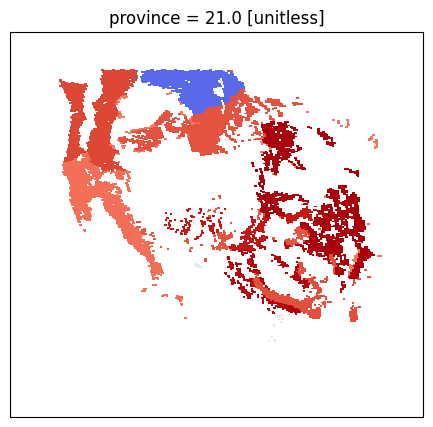

In [37]:
# plot just to look at it
fig, ax = plt.subplots(figsize=(7,5), dpi=50,
                       subplot_kw={'projection':ccrs.PlateCarree()})
# plot the western US
# PLOT DATA
counter = 0 # start at first province, since 0=allwestUS
# diverging colormap centered at zero

# add the VPD data
for thisregnum in dfnum:
    xr.where((ecoregfor.sel(province=thisregnum))>0,
             delta_modelforDiff_ecoprov[counter],np.nan).plot(
        ax=ax, cmap=custom_RdBu3, 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        norm=thisnorm)
#    xr.where((ecoregnon.sel(province=thisregnum))>0,
#             delta_modelnonDiff_ecoprov[counter],np.nan).plot(
#        ax=ax, cmap=custom_RdBu3,
#        add_colorbar=False, transform=ccrs.epsg(5070), zorder=0,
#        norm=thisnorm)
    counter+=1

# looks like precipitation affects more of the trend in the north,
# VPD affects more of the trend in the south

In [38]:
# print out some stats for burned area trends and gSST contributed

print('\nFOREST')
print('{:35s}OBS TREND, \tSST CONTRIB TREND (%)'.format('NAME'))
for i, thisname in enumerate(prov_abbr_names):
    print('{:34s}'.format(thisname) + '{:.0f}'.format(delta_wumifor_ecoprov[i]) +
         '\t{:.0f}'.format(delta_modelforDiff_ecoprov[i])+
         '\t% contrib: {:.0f}'.format(delta_modelforDiff_ecoprov[i]/delta_wumifor_ecoprov[i]*100))

# min/max stats for observed
tmpmaxval = np.ma.masked_where(wheremaxvalfor, delta_wumifor_ecoprov).max()
tmpmaxvali = (np.ma.masked_where(wheremaxvalfor, delta_wumifor_ecoprov).argmax())
print('\nMAX obs forest BA trend: \t{:.0f} % in {:}'.format(tmpmaxval,prov_abbr_names[tmpmaxvali]))
tmpminval = np.ma.masked_where(wheremaxvalfor, delta_wumifor_ecoprov).min()
tmpminvali = (np.ma.masked_where(wheremaxvalfor, delta_wumifor_ecoprov).argmin())
print('MIN obs forest BA trend: \t{:.0f} % in {:}'.format(tmpminval,prov_abbr_names[tmpminvali]))

# min/max stats for modeled contrib
tmpmaxval = np.ma.masked_where(wheremaxvalforSST, delta_modelforDiff_ecoprov).max()
tmpmaxvali = (np.ma.masked_where(wheremaxvalforSST, delta_modelforDiff_ecoprov).argmax())
print('\nMAX model contrib to forest BA trend: \t{:.0f} % in {:}'.format(tmpmaxval,prov_abbr_names[tmpmaxvali]))
tmpminval = np.ma.masked_where(wheremaxvalforSST, delta_modelforDiff_ecoprov).min()
tmpminvali = (np.ma.masked_where(wheremaxvalforSST, delta_modelforDiff_ecoprov).argmin())
print('MIN model contrib to forest BA trend: \t{:.0f} % in {:}'.format(tmpminval,prov_abbr_names[tmpminvali]))


print('\nNONFOREST')
print('{:34s}OBS TREND, \tSST CONTRIB TREND (ppts)'.format('NAME'))
for i, thisname in enumerate(prov_abbr_names):
    print('{:34s}'.format(thisname) + '{:.0f}'.format(delta_wuminon_ecoprov[i]) + 
         '\t{:.0f}'.format(delta_modelnonDiff_ecoprov[i]) + 
         '\t% contrib: {:.0f}'.format(delta_modelnonDiff_ecoprov[i]/delta_wuminon_ecoprov[i]*100))

# min/max stats for observed
tmpmaxval = np.ma.masked_where(wheremaxvalnon, delta_wuminon_ecoprov).max()
tmpmaxvali = (np.ma.masked_where(wheremaxvalnon, delta_wuminon_ecoprov).argmax())
print('\nMAX nonforest observed BA trend: \t{:.0f} % in {:}'.format(tmpmaxval,prov_abbr_names[tmpmaxvali]))
tmpminval = np.ma.masked_where(wheremaxvalnon, delta_wuminon_ecoprov).min()
tmpminvali = (np.ma.masked_where(wheremaxvalnon, delta_wuminon_ecoprov).argmin())
print('MIN nonforest obs BA trend: \t{:.0f} % in {:}'.format(tmpminval,prov_abbr_names[tmpminvali]))

# min/max stats for modeled contrib
tmpmaxval = np.ma.masked_where(wheremaxvalnonSST, delta_modelnonDiff_ecoprov).max()
tmpmaxvali = (np.ma.masked_where(wheremaxvalnonSST, delta_modelnonDiff_ecoprov).argmax())
print('\nMAX model contrib to forest BA trend: \t{:.0f} % in {:}'.format(tmpmaxval,prov_abbr_names[tmpmaxvali]))
tmpminval = np.ma.masked_where(wheremaxvalnonSST, delta_modelnonDiff_ecoprov).min()
tmpminvali = (np.ma.masked_where(wheremaxvalnonSST, delta_modelnonDiff_ecoprov).argmin())
print('MIN model contrib to forest BA trend: \t{:.0f} % in {:}'.format(tmpminval,prov_abbr_names[tmpminvali]))



FOREST
NAME                               OBS TREND, 	SST CONTRIB TREND (%)
0: All western US                 1118	0	% contrib: 0
1: American Semi-Desert           1306	315	% contrib: 24
x: Black Hills Coniferous Forest  nan	nan	% contrib: nan
3: CA Coast Chapparral Forest     68	161	% contrib: 236
x: California Coastal Steppe-Redwoodnan	nan	% contrib: nan
5: CA Dry Steppe Province         3913	366	% contrib: 9
6: Cascade Mixed Forest           nan	nan	% contrib: nan
7: Chihuahuan Semi-Desert         4962	1165	% contrib: 23
8: CO Plateau                     496	139	% contrib: 28
9: Great Plains                   440	125	% contrib: 28
10: IM Semi-Desert                720	287	% contrib: 40
11: IM Semi-Desert and Desert     577	301	% contrib: 52
12: Middle Rocky Mountain Steppe  1152	869	% contrib: 75
13: NV-UT Mountains               1775	-108	% contrib: -6
x: Pacific Lowland Mixed Forest Province2582	164	% contrib: 6
15: Sierran Steppe                4721	1447	% contrib: 31
16: Southe

## burned area coincides with VPD

(Feb 1, 2024) 

Burned area in non-forest regions has these spikes of high BA in in 2006-2007, 2011-2012, 2017-2018, and 2020. 

My plot Shows that these do not relate very well to higher vpd. Low fire also relates to high VPD, and 

In [49]:
# import VPD data
#vpd_string = '12km\\climate\\primary\\vpd.nc'
vpd_string = '12km//climate//primary//vpd.nc'
vpd = xr.open_dataset(directory + vpd_string, engine='netcdf4')

# prep data for correlation comparison
firstclimtime = str(firstyear-1)+'-01-01'

def is_springseason(month):
    return (month >= 4) & (month <=9)

# resample all data at yearly timescale (takes a while)
# get only spring data and resample by year
vpd_spring = vpd.sel(time=is_springseason(vpd['time.month'])).resample(time='Y').mean()
vpd_spring = vpd_spring.vpd.loc[firstclimtime:finaltime]

del vpd

In [50]:
# iterate through each ecoregion, sum vpd trend
# get the vpd trends by ecoregion (not incl. entire western US)
years = np.arange(firstyear-1, finalyear+1)
vpd_obs_trendfor = np.zeros(len(dfnames)-1) # storage, intercept
vpd_obs_trendnon = np.zeros(len(dfnames)-1)
vpd_obs_bfor = np.zeros(len(dfnames)-1) # storage, slope
vpd_obs_bnon = np.zeros(len(dfnames)-1)
vpd_timeseries_for = [] # storage, timeseries
vpd_timeseries_non = []

# iterate through to get the forest and nonforest timeseries
# and get trends for each
counter = 0
for thisregion in ecoreg:
    #print('region '+str(counter+1)+'/'+str(len(dfnum)))
    # calculate vpd, store timeseries
    tmpvpdfor = (in_forest(vpd_spring, thisregion))
    vpd_timeseries_for.append(tmpvpdfor.values)
    tmpvpdnon = in_nonforest(vpd_spring, thisregion)
    vpd_timeseries_non.append(tmpvpdnon.values)

    # store trendline
    tmpvpdtrendfor = scipy.stats.linregress(years, tmpvpdfor.values)
    tmpvpdtrendnon = scipy.stats.linregress(years, tmpvpdnon.values)
    vpd_obs_trendfor[counter] = tmpvpdtrendfor.slope
    vpd_obs_trendnon[counter] = tmpvpdtrendnon.slope
    vpd_obs_bfor[counter] = tmpvpdtrendfor.intercept
    vpd_obs_bnon[counter] = tmpvpdtrendnon.intercept
    counter+=1

forest: statistic = 0.888, pvalue=5e-14
nonforest: statistic = 0.528, pvalue=0.00054


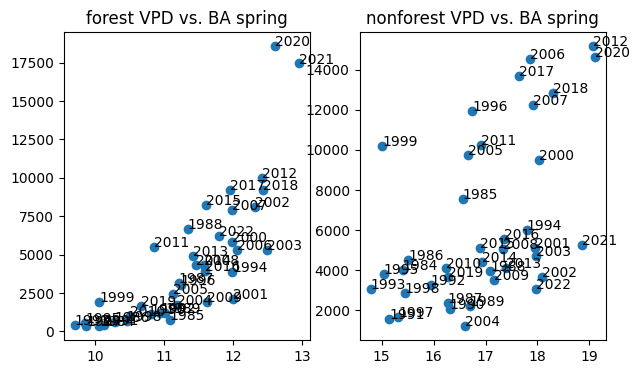

In [51]:
# start with vpd_spring, made earlier for Fig. 1
vpd_nonforest_wUS = in_nonforest(vpd_spring, westUS).values.flatten()
vpd_forest_wUS = in_forest(vpd_spring, westUS).values.flatten()

k = 1 # cut off one year to start at 1984
# plot to compare
fig, ax = plt.subplots(1,2,figsize=((7,4)),dpi=50)
ax[0].scatter(vpd_forest_wUS[k:], wumifor.loc[:,'0'])
ax[1].scatter(vpd_nonforest_wUS[k:], wuminon.loc[:,'0'])
ax[0].set_title('forest VPD vs. BA spring')
ax[1].set_title('nonforest VPD vs. BA spring')
for i, txt in enumerate(years[k:]):
    ax[0].annotate(str(txt), (vpd_forest_wUS[k:][i], wumifor.loc[:,'0'][i+1984]))
    ax[1].annotate(str(txt), (vpd_nonforest_wUS[k:][i], wuminon.loc[:,'0'][i+1984]))

# linear regression
tmpcorrfor = pearsonr(vpd_forest_wUS[k:], np.log10(wumifor.loc[:,'0']))
tmpcorrnon = pearsonr(vpd_nonforest_wUS[k:], np.log10(wuminon.loc[:,'0']))
print('forest: statistic = {:.3f}, pvalue={:.2}'.format(tmpcorrfor.statistic, tmpcorrfor.pvalue))
print('nonforest: statistic = {:.3f}, pvalue={:.2}'.format(tmpcorrnon.statistic, tmpcorrnon.pvalue))

## Block bootstrap for significance trends

(12/20/2024)

Add in block bootstrap of `n` repetitions that will let us know if the trend we're seeing falls within the normal distribution of possible trends. When calculating the fraction or p-value, the absolute value of the trends in the bootstrapped data must exceed the observed/modeled trend.

In [52]:
# printing significance
def addSigMarker(pvalue):
    """
    Add an asterisk for values that are significant.
    p<0.05, add *
    p<0.01, add **
    otherwise add an empty space
    """
    if pvalue<0.01:
        adddot = '**' # significance marker
    elif pvalue<0.05:
        adddot = '*'# add significance marker
    else:
        adddot = ' ' # no significance
    return adddot

In [53]:
# block bootstrap for all western US

nmembers = 10000
trendmembersobs = np.zeros((len(sumswumi), nmembers)) # storage
trendmembers = np.zeros((len(sumsBA), nmembers))
trendmembersDT = np.zeros((len(sumsBA_DT), nmembers))
block_size = 3 # grab x years at a time
block_size_extra = 2

# line of best fit from the observed and model
tmpm = np.zeros(3)
tmpmBA = np.zeros(3)
tmpmBA_DT = np.zeros(3)
tmpb = np.zeros(3)
tmpbBA = np.zeros(3)
tmpbBA_DT = np.zeros(3)
for i in np.arange(len(tmpm)):
    # wumi lines of best fit (theil-sen!!!!)
    tmpbestfit = theilslopes(np.log10(sumswumi[i]), x=xyears, method='joint') # regression
    tmpm[i] = tmpbestfit.slope
    tmpb[i] = tmpbestfit.intercept
    # BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA[i]), x=xyears, method='joint') # regression
    tmpmBA[i] = tmpbestfit.slope
    tmpbBA[i] = tmpbestfit.intercept
    # detrended BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA_DT[i]), x=xyears, method='joint') # regression
    tmpmBA_DT[i] = tmpbestfit.slope
    tmpbBA_DT[i] = tmpbestfit.intercept

# begin nmembers-length block bootstrap
for j in np.arange(0,len(sumsBA)):
    tmpwumi = sumswumi[j]
    tmpBA = sumsBA[j]
    tmpBA_DT = sumsBA_DT[j]
    # do nmembers-length block bootstrap
    for i in np.arange(0,nmembers):
        # block the data into consecutive-year chunks
        tmpblocksobs = [tmpwumi[i:i+block_size] for i in range(0, len(xyears), block_size)]
        tmpblocks = [tmpBA[i:i+block_size] for i in range(0, len(xyears), block_size)]
        tmpblocksDT = [tmpBA_DT[i:i+block_size] for i in range(0, len(xyears), block_size)]
        # if last block is only 2, I'll add one more year from previous block
        # tmpblocks.append(tmptimes[-block_size:])  # Last block of size 3
        # commented out: originally would be last block of size 2
        # tmpblocks.append(tmptimes[-block_size_extra:])  # Last block of size 3
        
        # randomly sample from blocks to get reshuffled timeseries
        num_blocks = len(tmpblocks)
        resampledi = np.random.choice(range(num_blocks), size=num_blocks, replace=True)
        # combine
        bootstrapped_timesobs = np.concatenate([tmpblocksobs[i] for i in resampledi])
        bootstrapped_times = np.concatenate([tmpblocks[i] for i in resampledi])
        bootstrapped_timesDT = np.concatenate([tmpblocksDT[i] for i in resampledi])
        # cut the timeseries so that it's always the same length as the original
        bootstrapped_timesobs = bootstrapped_timesobs[0:len(xyears)]
        bootstrapped_times = bootstrapped_times[0:len(xyears)]
        bootstrapped_timesDT = bootstrapped_timesDT[0:len(xyears)]

        # calculate the trend wumi observed
        reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression
        m = reg.slope
        trendmembersobs[j,i] = m # save the slope
        # calculate the trend
        reg = theilslopes(np.log10(bootstrapped_times), x=xyears, method='joint') # regression
        m = reg.slope
        trendmembers[j,i] = m # save the slope
        # calculate the trend DT
        reg = theilslopes(np.log10(bootstrapped_timesDT), x=xyears, method='joint') # regression
        m = reg.slope
        trendmembersDT[j,i] = m # save the slope
        
# calculate fraction with slope>observed trend
fractrendobs = np.zeros(len(sumswumi)) # storage
fractrend = np.zeros(len(sumsBA))
fractrendDT = np.zeros(len(sumsBA_DT))

for j in np.arange(0,len(sumsBA)):
    tmpobstrend = tmpm[j] # observed trend
    tmpboottrend = np.abs(trendmembersobs[j,:]) # bootstrapped trends
    # fraction above observed trend, which is the p-value
    fractrendobs[j] = ((tmpboottrend > tmpobstrend).sum())/nmembers

    tmpobstrend = tmpmBA[j] # observed trend
    tmpboottrend = np.abs(trendmembers[j,:]) # bootstrapped trends
    # fraction above observed trend, which is the p-value
    fractrend[j] = ((tmpboottrend > tmpobstrend).sum())/nmembers

    tmpobstrend = tmpmBA_DT[j] # observed trend
    tmpboottrend = np.abs(trendmembersDT[j,:]) # bootstrapped trends
    # fraction above observed trend, which is the p-value
    fractrendDT[j] = ((tmpboottrend > tmpobstrend).sum())/nmembers


In [54]:
# add significance for figures
fracsigobs = []
fracsig = []
fracsigDT = []
for j in np.arange(0,len(sumsBA)):
    fracsigobs.append(addSigMarker(fractrendobs[j]))
    fracsig.append(addSigMarker(fractrend[j]))
    fracsigDT.append(addSigMarker(fractrendDT[j]))

# Combined Figure 4

cbarmin = -100
cbarmax = 5000


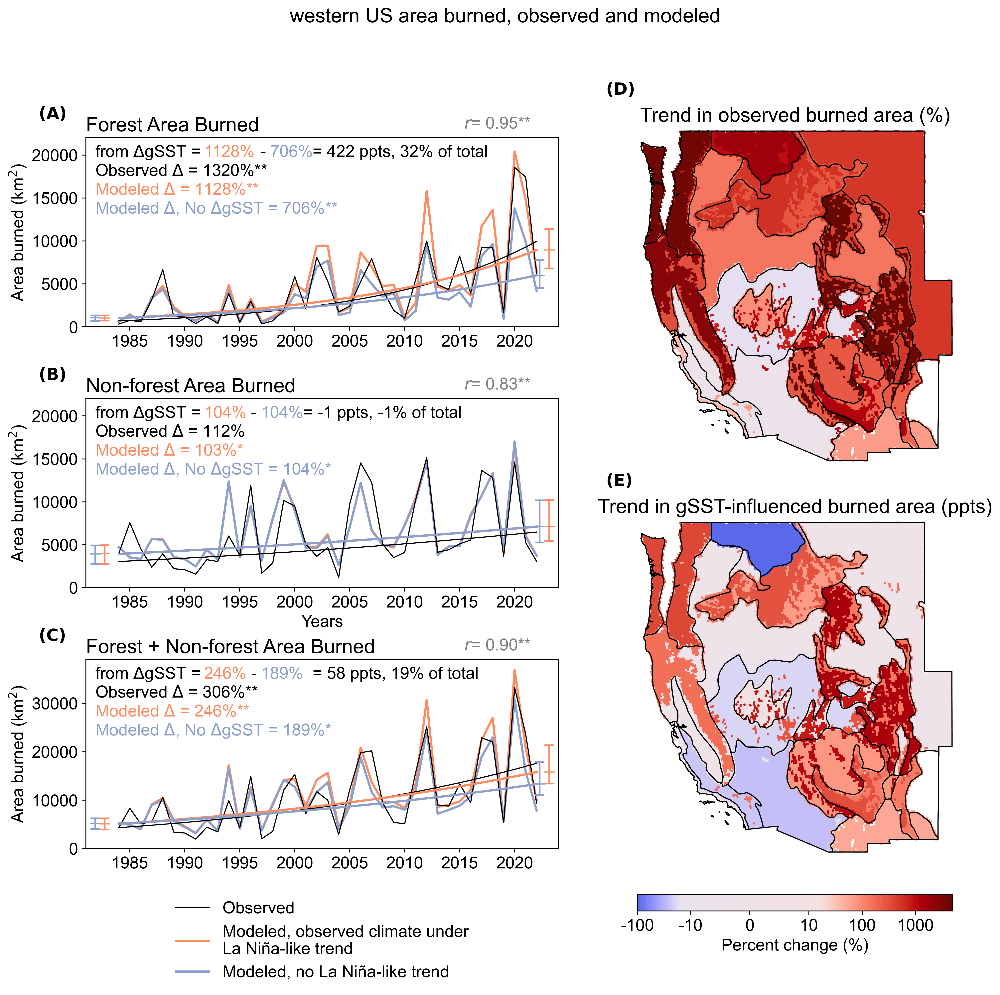

In [55]:
fig = plt.figure(figsize=(14, 13), dpi=200)
gs = fig.add_gridspec(7,2,height_ratios=[1,1,1,1,1,1,0.15],
                     width_ratios=[1.5,1])
print('cbarmin = {:}'.format(cbarmin))
print('cbarmax = {:}'.format(cbarmax))

changemap = custom_RdBu3
xyears = np.arange(firstyear,finalyear+1,1)

# set fonts
plt.rcParams.update({'font.size': 15})
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.family'] = 'Arial'

########### figure (a) map of observed BA
ax1 = fig.add_subplot(gs[0:3,1], projection=ccrs.PlateCarree())
# PLOT DATA
counter = 0 # start at first province, since 0=allwestUS
# add the data
extent = [-125,-102,31,49]
# add map features
ax1.set_extent(extent)
for thisregnum in dfnum:
    xr.where((ecoregfor.sel(province=thisregnum))>0,
             delta_wumifor_ecoprov[counter],np.nan).plot(
        ax=ax1, cmap=changemap, 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
           vmin=cbarmin, vmax=cbarmax))
    xr.where((ecoregnon.sel(province=thisregnum))>0,
             delta_wuminon_ecoprov[counter],np.nan).plot(
        ax=ax1, cmap=changemap,
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=0,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
          vmin=cbarmin, vmax=cbarmax))
    counter+=1

# decorate
# add edgeline of each ecoregion
Becoprov.boundary.plot(linewidth=1,
               edgecolor='k', ax=ax1, zorder=2)

# decorate
ax1.set_title('Trend in observed burned area (%)')
ax1.set_aspect(1.362/1)
ax1.axis('off') # turn off figure frame
ax1.set_ylabel('Latitude ($^\circ$)')
ax1.set_xlabel('Longitude ($^\circ$)')

########### figure (b) map of trend
ax2 = fig.add_subplot(gs[3:6,1], projection = ccrs.PlateCarree())

# PLOT DATA
counter = 0 # start at first province, since 0=allwestUS
# add the VPD data
ax2.set_extent(extent)
for thisregnum in dfnum:
    xr.where((ecoregfor.sel(province=thisregnum))>0,
             delta_modelforDiff_ecoprov[counter],np.nan).plot(
        ax=ax2, cmap=changemap, 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
           vmin=cbarmin, vmax=cbarmax))
    xr.where((ecoregnon.sel(province=thisregnum))>0,
             delta_modelnonDiff_ecoprov[counter],np.nan).plot(
        ax=ax2, cmap=changemap,
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=0,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
          vmin=cbarmin, vmax=cbarmax))
    counter+=1

# decorate
# add edgeline of each ecoregion
Becoprov.boundary.plot(linewidth=1,
               edgecolor='k', ax=ax2, zorder=2)

# decorate
ax2.set_title('Trend in gSST-influenced burned area (ppts)')
ax2.set_aspect(1.362/1)
#ax.set_yticks(([30, 35, 40, 45, 50]))
#ax.set_xticks((range(-130, -95, 5)))
ax2.set_ylabel('Latitude ($^\circ$)')
ax2.set_xlabel('Longitude ($^\circ$)')
ax2.axis('off') # turn off figure frame
ax2.set_facecolor("white")
fig.patch.set_alpha(0)


########### colorbar for fig a/b

axbar = fig.add_subplot(gs[6,1])
thiscbar = Colorbar(mappable=d2, label='Percent change (%)', cmap=changemap, orientation='horizontal', ax=axbar)
thiscbar.formatter = FuncFormatter(format_LogToIntegercolorbar) # change 10^2% to 100%, custom formatter
thiscbar.update_ticks()

########### figure (c) timeseries 1
# get the allwestUS data to plot from the different timeseries
sumswumi = [wumi.loc[:,'0'], wumifor.loc[:,'0'], wuminon.loc[:,'0']]
sumsBA = [sum_BAclimpredall, sum_BAclimpredfor, sum_BAclimprednon]
sumsBA_DT = [sum_BAclimpredall_DT, sum_BAclimpredfor_DT, sum_BAclimprednon_DT]

# line of best fit
tmpm = np.zeros(3)
tmpmBA = np.zeros(3)
tmpmBA_DT = np.zeros(3)
tmpb = np.zeros(3)
tmpbBA = np.zeros(3)
tmpbBA_DT = np.zeros(3)
for i in np.arange(len(tmpm)):
    # wumi lines of best fit (theil-sen!!!!)
    tmpbestfit = theilslopes(np.log10(sumswumi[i]), x=xyears, method='joint') # regression
    tmpm[i] = tmpbestfit.slope
    tmpb[i] = tmpbestfit.intercept
    # BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA[i]), x=xyears, method='joint') # regression
    tmpmBA[i] = tmpbestfit.slope
    tmpbBA[i] = tmpbestfit.intercept
    # detrended BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA_DT[i]), x=xyears, method='joint') # regression
    tmpmBA_DT[i] = tmpbestfit.slope
    tmpbBA_DT[i] = tmpbestfit.intercept


# get correlation BA_observed vs. BA_climpred
rvalueBAsums = [pearsonr(np.log10(sumswumi[0]), np.log10(sumsBA[0]))[0],
                pearsonr(np.log10(sumswumi[1]), np.log10(sumsBA[1]))[0],
                pearsonr(np.log10(sumswumi[2]), np.log10(sumsBA[2]))[0]]
# get correlation BA_observed vs. BA_climpred
pvalueBAsums = [pearsonr(np.log10(sumswumi[0]), np.log10(sumsBA[0]))[1],
                pearsonr(np.log10(sumswumi[1]), np.log10(sumsBA[1]))[1],
                pearsonr(np.log10(sumswumi[2]), np.log10(sumsBA[2]))[1]]

# ax3 is forest+nonforest
ax3 = fig.add_subplot(gs[4:6,0])
i=0 # all
# data
ax3.plot(sumswumi[i], label='Observed', 
         c='k', linewidth=1, zorder=2)
ax3.plot(xyears, sumsBA[i], label='From observed climate', 
         c=colorobs, linewidth=2, zorder=1)
ax3.plot(xyears, sumsBA_DT[i], 
         label='From climate, no SST trend', 
         c=colorDT, linewidth=2, zorder=1)
fig.suptitle('western US area burned, observed and modeled')
# plot lines of best fit
ax3.plot(xyears, 10**(tmpm[i]*xyears+tmpb[i]), 
           linewidth=1, c='k', zorder=3)
ax3.plot(xyears, 10**(tmpmBA[i]*xyears+tmpbBA[i]), 
           linewidth=2, c=colorobs, zorder=3)
ax3.plot(xyears, 10**(tmpmBA_DT[i]*xyears+tmpbBA_DT[i]), 
           linewidth=2, c=colorDT, zorder=3)
ax3.set_ylabel('Area burned (km$^2$)')
ax3.set_box_aspect(0.4) # fix the width/height

# add 95% confidence interval for trendlines
# TRENDLINE UNCERTAINTY WHISKERS (errorbars for 95th percentile confidence range)
# trendlines already plotted above
fit_obs = 10**(tmpmBA[i] * xyears + tmpbBA[i])
fit_dt  = 10**(tmpmBA_DT[i] * xyears + tmpbBA_DT[i])
# x positions in axes coordinates
xleft_obs  = 0.04
xleft_dt   = 0.02
xright_obs = 0.98
xright_dt  = 0.96
capwidth = 0.010
trans = ax3.get_yaxis_transform()
# --------------------------------
# OBSERVED-CLIMATE TRENDLINE
# left endpoint
ym = fit_obs[0]
y0 = trendBA_lo[i][0]
y1 = trendBA_hi[i][0]
ax3.vlines(
    xleft_obs, y0, y1, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax3.hlines([y0, y1],xleft_obs-capwidth,
    xleft_obs+capwidth, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax3.plot(xleft_obs, ym,
    marker='_', markersize=10, color=colorobs,
    transform=trans, clip_on=False)
# right endpoint
ym = fit_obs[-1]
y0 = trendBA_lo[i][-1]
y1 = trendBA_hi[i][-1]

ax3.vlines(xright_obs, y0, y1, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax3.hlines([y0, y1],
    xright_obs-capwidth,
    xright_obs+capwidth, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax3.plot(xright_obs, ym,
    marker='_', markersize=10, color=colorobs,
    transform=trans, clip_on=False)
# --------------------------
# DETRENDED-SST TRENDLINE

# left endpoint
ym = fit_dt[0]
y0 = trendBA_lo_DT[i][0]
y1 = trendBA_hi_DT[i][0]

ax3.vlines(xleft_dt, y0, y1, color=colorDT, lw=1.5,
    transform=trans, clip_on=False)
ax3.hlines([y0, y1],xleft_dt-capwidth,
    xleft_dt+capwidth, color=colorDT, lw=1.5,
    transform=trans, clip_on=False)
ax3.plot(xleft_dt, ym, marker='_', markersize=10, 
         color=colorDT, transform=trans, clip_on=False)
# right endpoint
ym = fit_dt[-1]
y0 = trendBA_lo_DT[i][-1]
y1 = trendBA_hi_DT[i][-1]

ax3.vlines(xright_dt, y0, y1,
    color=colorDT, lw=1.5,transform=trans, clip_on=False)
ax3.hlines([y0, y1],
    xright_dt-capwidth,xright_dt+capwidth, color=colorDT, lw=1.5,
    transform=trans, clip_on=False)
ax3.plot(xright_dt, ym,marker='_', markersize=10, color=colorDT,
    transform=trans, clip_on=False)

# pre-format numbers (these numbers from from waaaay up in the jupyter notebook)
# annotate manually (placement height on fig)
txtl1 = 0.90
txtl2 = 0.80
txtl3 = 0.70
txtl4 = 0.60
txtl5 = 1.05
# percent change
finaltrendper_all = (tmppctchange2all-tmppctchange3all)/tmppctchange1all*100
txt_pctchg2 = '{:.0f}%'.format(tmppctchange2all)
txt_pctchg3 = '{:.0f}%'.format(tmppctchange3all)
txt_pctchgppt = ' = {:.0f} ppts, {:.0f}% of total'.format(
    tmppctchange2all - tmppctchange3all, finaltrendper_all)

# r-value
tmppmarker = addSigMarker(pvalueBAsums[i]) # significance
ax3.annotate("$r$"+"= {:.2f}{:}".format(rvalueBAsums[i], tmppmarker), 
             (0.80,txtl5), c='gray', xycoords='axes fraction' )
# one-line of trend calculation
ax3.annotate('from $\Delta$gSST = ',
             (0.02,txtl1), c='k', xycoords='axes fraction' )
ax3.annotate(txt_pctchg2,  
             (0.25,txtl1), c=colorobs, xycoords='axes fraction' )
ax3.annotate('- ',
             (0.35,txtl1), c='k', xycoords='axes fraction' )
ax3.annotate(txt_pctchg3,
             (0.37,txtl1), c=colorDT, xycoords='axes fraction' )

# percent change and significance
ax3.annotate(txt_pctchgppt,
             (0.47,txtl1), c='k', xycoords='axes fraction' )
ax3.annotate('Observed $\Delta$ = {:.0f}%{:}'.format(tmppctchange1all, fracsigobs[i]), 
             (0.02,txtl2), c='k', xycoords='axes fraction' )
ax3.annotate('Modeled $\Delta$ = {:.0f}%{:}'.format(tmppctchange2all, fracsig[i]), 
             (0.02,txtl3), c=colorobs, xycoords='axes fraction' )
ax3.annotate('Modeled $\Delta$, No $\Delta$gSST = {:.0f}%{:}'.format(tmppctchange3all, fracsigDT[i]), 
             (0.02,txtl4), c=colorDT, xycoords='axes fraction' )


########### figure (d) timeseries 2 forest BA
ax4 = fig.add_subplot(gs[0:2,0])
i=1 # forest
# data
ax4.plot(sumswumi[i],label='Observed', 
         c='k', linewidth=1, zorder=2)
ax4.plot(xyears, sumsBA[i], label='From observed climate', 
         c=colorobs, linewidth=2, zorder=1)
ax4.plot(xyears, sumsBA_DT[i], label='From climate, no SST trend', 
         c=colorDT, linewidth=2, zorder=1)

# plot lines of best fit
ax4.plot(xyears, 10**(tmpm[i]*xyears+tmpb[i]),
           linewidth=1, c='k', zorder=3)
ax4.plot(xyears, 10**(tmpmBA[i]*xyears+tmpbBA[i]), 
           linewidth=2, c=colorobs, zorder=3)
ax4.plot(xyears, 10**(tmpmBA_DT[i]*xyears+tmpbBA_DT[i]), 
           linewidth=2, c=colorDT, zorder=3)
ax4.set_ylabel('Area burned (km$^2$)')
ax4.set_box_aspect(0.4) # fix the width/height

# add 95% confidence interval for trendlines
# TRENDLINE UNCERTAINTY WHISKERS (errorbars for 95th percentile confidence range)
# trendlines already plotted above
fit_obs = 10**(tmpmBA[i] * xyears + tmpbBA[i])
fit_dt  = 10**(tmpmBA_DT[i] * xyears + tmpbBA_DT[i])
# x positions in axes coordinates
xleft_obs  = 0.04
xleft_dt   = 0.02
xright_obs = 0.98
xright_dt  = 0.96
capwidth = 0.010
trans = ax4.get_yaxis_transform()
# --------------------------------
# OBSERVED-CLIMATE TRENDLINE
# left endpoint
ym = fit_obs[0]
y0 = trendBA_lo[i][0]
y1 = trendBA_hi[i][0]
ax4.vlines(
    xleft_obs, y0, y1, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax4.hlines([y0, y1],xleft_obs-capwidth,
    xleft_obs+capwidth, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax4.plot(xleft_obs, ym,
    marker='_', markersize=10, color=colorobs,
    transform=trans, clip_on=False)
# right endpoint
ym = fit_obs[-1]
y0 = trendBA_lo[i][-1]
y1 = trendBA_hi[i][-1]

ax4.vlines(xright_obs, y0, y1, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax4.hlines([y0, y1],
    xright_obs-capwidth,
    xright_obs+capwidth, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax4.plot(xright_obs, ym,
    marker='_', markersize=10, color=colorobs,
    transform=trans, clip_on=False)
# --------------------------
# DETRENDED-SST TRENDLINE

# left endpoint
ym = fit_dt[0]
y0 = trendBA_lo_DT[i][0]
y1 = trendBA_hi_DT[i][0]

ax4.vlines(xleft_dt, y0, y1, color=colorDT, lw=1.5,
    transform=trans, clip_on=False)
ax4.hlines([y0, y1],xleft_dt-capwidth,
    xleft_dt+capwidth, color=colorDT, lw=1.5,
    transform=trans, clip_on=False)
ax4.plot(xleft_dt, ym, marker='_', markersize=10, 
         color=colorDT, transform=trans, clip_on=False)
# right endpoint
ym = fit_dt[-1]
y0 = trendBA_lo_DT[i][-1]
y1 = trendBA_hi_DT[i][-1]

ax4.vlines(xright_dt, y0, y1,
    color=colorDT, lw=1.5,transform=trans, clip_on=False)
ax4.hlines([y0, y1],
    xright_dt-capwidth,xright_dt+capwidth, color=colorDT, lw=1.5,
    transform=trans, clip_on=False)
ax4.plot(xright_dt, ym,marker='_', markersize=10, color=colorDT,
    transform=trans, clip_on=False)

#----------------

# pre-format numbers (numbers all come from wayyyy up on the jupyter notebook)
finaltrendper_for = (tmppctchange2for-tmppctchange3for)/tmppctchange1for*100
txt_pctchg2 = '{:.0f}%'.format(tmppctchange2for)
txt_pctchg3 = '{:.0f}%'.format(tmppctchange3for)
txt_pctchgppt = ' = {:.0f} ppts, {:.0f}% of total'.format(
    tmppctchange2for - tmppctchange3for, finaltrendper_for)

# r-value
tmppmarker = addSigMarker(pvalueBAsums[i]) # significance
ax4.annotate("$r$"+"= {:.2f}{:}".format(rvalueBAsums[i], tmppmarker), 
             (0.80,txtl5), c='gray', xycoords='axes fraction' )
# one-line of trend calculation
ax4.annotate('from $\Delta$gSST = ',
             (0.02,txtl1), c='k', xycoords='axes fraction' )
ax4.annotate(txt_pctchg2,  
             (0.25,txtl1), c=colorobs, xycoords='axes fraction' )
ax4.annotate('  - ',
             (0.35,txtl1), c='k', xycoords='axes fraction' )
ax4.annotate(txt_pctchg3,
             (0.39,txtl1), c=colorDT, xycoords='axes fraction' )
ax4.annotate(txt_pctchgppt,
             (0.47,txtl1), c='k', xycoords='axes fraction' )
# percent change and significance
ax4.annotate('Observed $\Delta$ = {:.0f}%{:}'.format(tmppctchange1for, fracsigobs[i]), 
             (0.02,txtl2), c='k', xycoords='axes fraction' )
ax4.annotate('Modeled $\Delta$ = {:.0f}%{:}'.format(tmppctchange2for, fracsig[i]), 
             (0.02,txtl3), c=colorobs, xycoords='axes fraction' )
ax4.annotate('Modeled $\Delta$, No $\Delta$gSST = {:.0f}%{:}'.format(tmppctchange3for, fracsigDT[i]), 
             (0.02,txtl4), c=colorDT, xycoords='axes fraction' )

########### figure (e) timeseries 3 nonforest BA
ax5 = fig.add_subplot(gs[2:4,0])
i=2 # nonforest
# data
ax5.plot(sumswumi[i],label='Observed', 
         c='k', linewidth=1, zorder=2)
ax5.plot(xyears, sumsBA[i], label='From observed climate', 
         c=colorobs, linewidth=2, zorder=1)
ax5.plot(xyears, sumsBA_DT[i], label='From climate, no SST trend', 
         c=colorDT, linewidth=2, zorder=1)
# line of best fit
ax5.plot(xyears, 10**(tmpm[i]*xyears+tmpb[i]),
           linewidth=1, c='k', zorder=3)
ax5.plot(xyears, 10**(tmpmBA[i]*xyears+tmpbBA[i]), 
           linewidth=2, c=colorobs, zorder=3)
ax5.plot(xyears, 10**(tmpmBA_DT[i]*xyears+tmpbBA_DT[i]), 
           linewidth=2, c=colorDT, zorder=3)
# decorate
ax5.set_box_aspect(0.4) # fix the width/height
ax5.set_ylabel('Area burned (km$^2$)')
ax5.set_xlabel('Years')

# add 95% confidence interval for trendlines
# TRENDLINE UNCERTAINTY WHISKERS (errorbars for 95th percentile confidence range)
# trendlines already plotted above
fit_obs = 10**(tmpmBA[i] * xyears + tmpbBA[i])
fit_dt  = 10**(tmpmBA_DT[i] * xyears + tmpbBA_DT[i])
# x positions in axes coordinates
xleft_obs  = 0.04
xleft_dt   = 0.02
xright_obs = 0.98
xright_dt  = 0.96
capwidth = 0.010
trans = ax5.get_yaxis_transform()
# --------------------------------
# OBSERVED-CLIMATE TRENDLINE
# left endpoint
ym = fit_obs[0]
y0 = trendBA_lo[i][0]
y1 = trendBA_hi[i][0]
ax5.vlines(
    xleft_obs, y0, y1, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax5.hlines([y0, y1],xleft_obs-capwidth,
    xleft_obs+capwidth, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax5.plot(xleft_obs, ym,
    marker='_', markersize=10, color=colorobs,
    transform=trans, clip_on=False)
# right endpoint
ym = fit_obs[-1]
y0 = trendBA_lo[i][-1]
y1 = trendBA_hi[i][-1]

ax5.vlines(xright_obs, y0, y1, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax5.hlines([y0, y1],
    xright_obs-capwidth,
    xright_obs+capwidth, color=colorobs, lw=1.5,
    transform=trans, clip_on=False)
ax5.plot(xright_obs, ym,
    marker='_', markersize=10, color=colorobs,
    transform=trans, clip_on=False)
# --------------------------
# DETRENDED-SST TRENDLINE

# left endpoint
ym = fit_dt[0]
y0 = trendBA_lo_DT[i][0]
y1 = trendBA_hi_DT[i][0]

ax5.vlines(xleft_dt, y0, y1, color=colorDT, lw=1.5,
    transform=trans, clip_on=False)
ax5.hlines([y0, y1],xleft_dt-capwidth,
    xleft_dt+capwidth, color=colorDT, lw=1.5,
    transform=trans, clip_on=False)
ax5.plot(xleft_dt, ym, marker='_', markersize=10, 
         color=colorDT, transform=trans, clip_on=False)
# right endpoint
ym = fit_dt[-1]
y0 = trendBA_lo_DT[i][-1]
y1 = trendBA_hi_DT[i][-1]

ax5.vlines(xright_dt, y0, y1,
    color=colorDT, lw=1.5,transform=trans, clip_on=False)
ax5.hlines([y0, y1],
    xright_dt-capwidth,xright_dt+capwidth, color=colorDT, lw=1.5,
    transform=trans, clip_on=False)
ax5.plot(xright_dt, ym,marker='_', markersize=10, color=colorDT,
    transform=trans, clip_on=False)

# ---------------
# pre-format numbers (numbers from from waaaay up in the jupyter notebook)
finaltrendper_non = (tmppctchange2non-tmppctchange3non)/tmppctchange1non*100
txt_pctchg2 = '{:.0f}%'.format(np.ceil(tmppctchange2non))
txt_pctchg3 = '{:.0f}%'.format(np.floor(tmppctchange3non))
txt_pctchgppt = ' = {:.0f} ppts, {:.0f}% of total'.format(
    np.ceil(tmppctchange2non - tmppctchange3non), np.ceil(finaltrendper_non))

# r-value
tmppmarker = addSigMarker(pvalueBAsums[i]) # significance
ax5.annotate("$r$"+"= {:.2f}{:}".format(rvalueBAsums[i],tmppmarker), 
             (0.80,txtl5), c='gray', xycoords='axes fraction' )
# one-line of trend calculation
ax5.annotate('from $\Delta$gSST = ',
             (0.02,txtl1), c='k', xycoords='axes fraction' )
ax5.annotate(txt_pctchg2,  
             (0.25,txtl1), c=colorobs, xycoords='axes fraction' )
ax5.annotate('   - ',
             (0.32,txtl1), c='k', xycoords='axes fraction' )
ax5.annotate(txt_pctchg3,
             (0.37,txtl1), c=colorDT, xycoords='axes fraction' )
ax5.annotate(txt_pctchgppt,
             (0.45,txtl1), c='k', xycoords='axes fraction' )

# percent change and significance
ax5.annotate('Observed $\Delta$ = {:.0f}%{:}'.format(tmppctchange1non, fracsigobs[i]), 
             (0.02,txtl2), c='k', xycoords='axes fraction' )
ax5.annotate('Modeled $\Delta$ = {:.0f}%{:}'.format(tmppctchange2non, fracsig[i]), 
             (0.02,txtl3), c=colorobs, xycoords='axes fraction' )
ax5.annotate('Modeled $\Delta$, No $\Delta$gSST = {:.0f}%{:}'.format(tmppctchange3non, fracsigDT[i]), 
             (0.02,txtl4), c=colorDT, xycoords='axes fraction' )

# figure limits
ax3.set_ylim([0,39000])
ax4.set_ylim([0,22000])
ax5.set_ylim([0,22000])
ax3.set_xlim([1981,2024])
ax4.set_xlim([1981,2024])
ax5.set_xlim([1981,2024])
# legend and figure decoration
ax3.legend(['Observed', 'Modeled, observed climate under\nLa Niña-like trend', 
            'Modeled, no La Niña-like trend'],frameon=False, 
            bbox_to_anchor=(0.5,-0.20), loc='upper center')
ax3.set_title('Forest + Non-forest Area Burned', loc='left')
ax4.set_title('Forest Area Burned', loc='left')
ax5.set_title('Non-forest Area Burned', loc='left')



fig.patch.set_alpha(0)

# add figure labels
ax4.annotate('$\\bf{(A)}$', (-0.1,1.1), c='k', xycoords='axes fraction')
ax5.annotate('$\\bf{(B)}$', (-0.1,1.1), c='k', xycoords='axes fraction')
ax3.annotate('$\\bf{(C)}$', (-0.1,1.1), c='k', xycoords='axes fraction')
ax1.annotate('$\\bf{(D)}$', (-0.1,1.1), c='k', xycoords='axes fraction')
ax2.annotate('$\\bf{(E)}$', (-0.1,1.1), c='k', xycoords='axes fraction')
plt.savefig(figfolder + 'Fig4CombinedBurnModel.png', bbox_inches='tight')

# Figures S6 and S7, Each individual ecoregion

In [56]:
# create block-bootstrap script for each ecoprovince

def BABlockBootstrap(timeseries):
    """
    Block bootstrap on a burned area (BA) time series.
    Timeseries input is burned area (not logged).
    Trendline is a Theil-Sen trendline on log10(BA). 
    The block bootstrap will randomize blocks from the time series and
    create a new bootstrapped time series 10,000 times.
    The p-value is returned, which is the fraction of times that the
    trend exceeds the observed BA time series trend.
    """

    xyears = np.arange(0, len(timeseries))
    
    # manual entry
    nmembers = 10000
    block_size = 3 # grab x years at a time
    block_size_extra = 2
    # set storage
    trendmembersobs = np.zeros(nmembers) # storage
    
    # line of best fit from the observed and model
    # theil sen trendline
    tmpbestfit = theilslopes(np.log10(timeseries), x=xyears, method='joint') # regression
    tmpm = tmpbestfit.slope
    tmpb = tmpbestfit.intercept
    
    # begin nmembers-length block bootstrap
    
    # do nmembers-length block bootstrap
    for i in np.arange(0,nmembers):
        # block the data into consecutive-year chunks
        tmpblocksobs = [timeseries[i:i+block_size] for i in range(0, len(xyears), block_size)]
        # if last block is only 2, I'll add one more year from previous block
        # tmpblocks.append(tmptimes[-block_size:])  # Last block of size 3
        # commented out: originally would be last block of size 2
        # tmpblocks.append(tmptimes[-block_size_extra:])  # Last block of size 3
        
        # randomly sample from blocks to get reshuffled timeseries
        num_blocks = len(tmpblocks)
        resampledi = np.random.choice(range(num_blocks), size=num_blocks, replace=True)
        # combine
        bootstrapped_timesobs = np.concatenate([tmpblocksobs[i] for i in resampledi])
        # cut the timeseries so that it's always the same length as the original
        bootstrapped_timesobs = bootstrapped_timesobs[0:len(xyears)]
    
        # calculate the trend
        reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression
        m = reg.slope
        trendmembersobs[i] = m # save the slope
            
    # calculate fraction with slope>observed trend
    fractrendobs = np.zeros(len(timeseries)) # storage
    
    tmpboottrend = np.abs(trendmembersobs) # bootstrapped trends
    # fraction above observed trend, which is the p-value
    fractrendobs = ((tmpboottrend > tmpm).sum())/nmembers
    # the fraction of times the trend exceeds the 
    # observed trend is the p-value
    
    return fractrendobs


## Forest/nonforest table stats

output table of all the stats so they don't clutter the figure. 

(11/24/2024)
Just noting here that in our call today I suggested you can declutter figs 5 and 6 by moving all he stats to an SI table (or maybe even a main-text table?). A row for each ecoregion and columns for model correlation, observed trend, modeled trend, modeled trend after removing gSST trend effect, and contribution of gSST trend. All correlation and trend values should have asterisks (** for <0.01 and * for <0.5) indicating significance. It seems conceivable that you could get forest and non-forest into the same table (forest on left, non-forest on right).

* Rows: ecoregions
* Columns: model correlation, cross-validated correlation, observed trend, model trend, model trend w/o gSST trend, ppts, contribution % of the gSST trend

In [57]:
# import the exported cross-validation
filename = predict_string + 'BurnArea_'
fileend = climindnameObs+'_'+str(firstyear)+'-'+str(finalyear)+'.txt'
BACVpredall = pd.read_csv(filename+'crossvalid_all'+'_'+fileend).set_index('Unnamed: 0')
BACVpredfor = pd.read_csv(filename+'crossvalid_for'+'_'+fileend).set_index('Unnamed: 0')
BACVprednon = pd.read_csv(filename+'crossvalid_non'+'_'+fileend).set_index('Unnamed: 0')

In [58]:
# save some values, including the all western US values

xyears = np.arange(firstyear,finalyear+1) # index of years

narr = len(dfnames) # n length of array
rvalue_climpredfor = np.zeros(narr)
rvalue_climpredfor_p = np.zeros(narr)
rvalueCV_climpredfor = np.zeros(narr)
rvalueCV_climpredfor_p = np.zeros(narr)
p_obsfor = np.zeros(narr)
p_modelfor = np.zeros(narr)
p_modelDTfor = np.zeros(narr)
trend_obsfor = np.zeros(narr)
trend_modelfor = np.zeros(narr)
trend_modelDTfor = np.zeros(narr)
contribppts_for = np.zeros(narr) # ppts contribution
contribperc_for = np.zeros(narr) # percent contrib

contribppts_for_hi = np.zeros(narr) # ppts, 95% confidence interval
contribppts_for_lo = np.zeros(narr) 
contribperc_for_hi = np.zeros(narr) # %change, 95% confidence interval
contribperc_for_lo = np.zeros(narr)

rvalue_climprednon = np.zeros(narr)
rvalue_climprednon_p = np.zeros(narr)
rvalueCV_climprednon = np.zeros(narr)
rvalueCV_climprednon_p = np.zeros(narr)
p_obsnon = np.zeros(narr)
p_modelnon = np.zeros(narr)
p_modelDTnon = np.zeros(narr)
trend_obsnon = np.zeros(narr)
trend_modelnon = np.zeros(narr)
trend_modelDTnon = np.zeros(narr)
contribppts_non = np.zeros(narr) # ppts contribution
contribperc_non = np.zeros(narr) # perc contrib

contribppts_non_hi = np.zeros(narr) # ppts, 95% confidence interval
contribppts_non_lo = np.zeros(narr) 
contribperc_non_hi = np.zeros(narr) # %change, 95% confidence interval
contribperc_non_lo = np.zeros(narr)


for i, thisname in enumerate(dfnames):
    # select all that have the ecoregion name in it
    # format is ecoprovX_k
    
    
    thisnum = dfnum_list[i]
    print(thisname)
    # select column of ecoregion

    # get 500-member ensemble of values (these are unlogged space)
    tmpBAall = (10**BAclimpredall.filter(like=thisname+'_'))
    tmpBAfor = (10**BAclimpredfor.filter(like=thisname+'_'))
    tmpBAnon = (10**BAclimprednon.filter(like=thisname+'_'))
    tmpBAall_DT = (10**BAclimpredall_DT.filter(like=thisname+'_'))
    tmpBAfor_DT = (10**BAclimpredfor_DT.filter(like=thisname+'_'))
    tmpBAnon_DT = (10**BAclimprednon_DT.filter(like=thisname+'_'))
    tmpBACVall = (10**BACVpredall.filter(like=thisname+'_'))
    tmpBACVfor = (10**BACVpredfor.filter(like=thisname+'_'))
    tmpBACVnon = (10**BACVprednon.filter(like=thisname+'_'))

    # get MEAN values (of unlogged space)
    sum_BAclimpredall = tmpBAall.mean(axis=1) # modeled from obs clim
    sum_BAclimpredfor = tmpBAfor.mean(axis=1)
    sum_BAclimprednon = tmpBAnon.mean(axis=1)
    sum_BAclimpredall_DT = tmpBAall_DT.mean(axis=1) # modeled from detrended clim
    sum_BAclimpredfor_DT = tmpBAfor_DT.mean(axis=1)
    sum_BAclimprednon_DT = tmpBAnon_DT.mean(axis=1)
    sum_BACVpredall = tmpBACVall.mean(axis=1) # modeled from detrended clim
    sum_BACVpredfor = tmpBACVfor.mean(axis=1)
    sum_BACVprednon = tmpBACVnon.mean(axis=1)

    # get all possible theil-sen trendlines
    # ALL POSSIBLE THEIL SEN TRENDLINES
    slopes_all, intercepts_all = ensemble_trends(
        tmpBAall, xyears)
    slopes_for, intercepts_for = ensemble_trends(
        tmpBAfor, xyears)
    slopes_non, intercepts_non = ensemble_trends(
        tmpBAnon, xyears)
    slopes_all_DT, intercepts_all_DT = ensemble_trends(
        tmpBAall_DT, xyears)
    slopes_for_DT, intercepts_for_DT = ensemble_trends(
        tmpBAfor_DT, xyears)
    slopes_non_DT, intercepts_non_DT = ensemble_trends(
        tmpBAnon_DT, xyears)
    slopes_all_CV, intercepts_all_CV = ensemble_trends(
        tmpBACVall, xyears)
    slopes_for_CV, intercepts_for_CV = ensemble_trends(
        tmpBACVfor, xyears)
    slopes_non_CV, intercepts_non_CV = ensemble_trends(
        tmpBACVnon, xyears)
        

    # FOREST MEANS
    sumswumi = wumifor.loc[:,thisnum]
    sumswumilog = np.ma.masked_invalid(np.log10(sumswumi)).filled(0)
    sums_BAclimpredlog = np.ma.masked_invalid(np.log10(sum_BAclimpredfor)).filled(0)
    sums_BAclimpredlog_DT = np.ma.masked_invalid(np.log10(sum_BAclimpredfor_DT)).filled(0)
    sums_BACVlog = np.ma.masked_invalid(np.log10(sum_BACVpredfor)).filled(0)
    # rvalues
    tmpr = pearsonr(sumswumilog, sums_BAclimpredlog)
    rvalue_climpredfor[i] = tmpr.statistic
    rvalue_climpredfor_p[i] = tmpr.pvalue
    # cross validation r-values
    tmpr = pearsonr(sumswumilog, sums_BACVlog)
    rvalueCV_climpredfor[i] = tmpr.statistic
    rvalueCV_climpredfor_p[i] = tmpr.pvalue
    
    # best-fit trendline
    reg = theilslopes(sumswumilog, x=xyears, method='joint')
    m1 = reg.slope
    b1 = reg.intercept
    reg = theilslopes(sums_BAclimpredlog, x=xyears, method='joint')
    m2 = reg.slope
    b2 = reg.intercept
    reg = theilslopes(sums_BAclimpredlog_DT, x=xyears, method='joint')
    m3 = reg.slope
    b3 = reg.intercept
    # trend significance
    p_obsfor[i] = BABlockBootstrap(sumswumi)
    p_modelfor[i] = BABlockBootstrap(sum_BAclimpredfor)
    p_modelDTfor[i] = BABlockBootstrap(sum_BAclimpredfor_DT)
    
    # find % change contribution
    # wumi observed
    predobs = 10**(m1*(xyears[-1]) + b1)
    initobs = 10**(m1*xyears[0] + b1)
    tmpresult1 = ((predobs - initobs) / (initobs))*100
    trend_obsfor[i] = tmpresult1

    # model observed SST scenario
    pred = 10**(m2*(xyears[-1]) + b2)
    init = 10**(m2*xyears[0] + b2)
    tmpresult2 = ((pred - init)/(initobs))*100
    trend_modelfor[i] = tmpresult2
    # model DT-scenario
    predDT = 10**(m3*(xyears[-1]) + b3)
    initDT = 10**(m3*xyears[0] + b3)
    tmpresult3 = ((predDT - initDT)/(initobs))*100
    trend_modelDTfor[i] = tmpresult3

    # find ppts difference
    tmppptsdiff = tmpresult2 - tmpresult3
    contribppts_for[i] = tmppptsdiff
    contribperc_for[i] = (tmppptsdiff)/(tmpresult1)*100

    # get percent change from pairs in 500-member ensemble
    # pairwise for each member:
    # get percent change for orange member
    # get percent change for blue member
    percchange = percent_change_distribution(slopes_for, intercepts_for, 
                                             xyears, denom=initobs)
    percchange_DT = percent_change_distribution(slopes_for_DT,
                                                intercepts_for_DT, xyears, denom=initobs)
    # get difference in percent change for pairwise
    percchange_diff = percchange - percchange_DT
    # get confidence interval in percent change difference
    percchange_diff_CI = np.percentile(percchange_diff, [2.5,97.5])
    contribppts_for_lo[i], contribppts_for_hi[i] = percchange_diff_CI # save
    print('$\Delta_obsclim$ minus $\Delta_DTclim$ = {:.2f} %'.format(tmppptsdiff))
    print('difference in % change, 95%CI: {:.2f} to {:.2f} %'.format(percchange_diff_CI[0], 
                                                                       percchange_diff_CI[1]))
    
    # calculate percent change contribution to observed trend
    finaltrendper_for = (tmpresult2-tmpresult3)/tmpresult1*100
    finaltrendper_for_hi = (percchange_diff_CI[1])/tmpresult1*100
    finaltrendper_for_lo = (percchange_diff_CI[0])/tmpresult1*100
    print('\nFOREST: How much of the trend? {:.2f} %'.format(finaltrendper_for))
    print('\tlower bound: {:.2f}% , upper bound: {:.2f}%'.format(finaltrendper_for_lo, 
                                                                finaltrendper_for_hi))
    # save contribution numbers
    contribperc_for_hi[i] = finaltrendper_for_hi
    contribperc_for_lo[i] = finaltrendper_for_lo
    

    # NONFOREST################
    # select column of ecoregion (MEAN)
    sumswumi = wuminon.loc[:,thisnum]
    sumswumilog = np.ma.masked_invalid(np.log10(sumswumi)).filled(0)
    sums_BAclimpredlog = np.ma.masked_invalid(np.log10(sum_BAclimprednon)).filled(0)
    sums_BAclimpredlog_DT = np.ma.masked_invalid(np.log10(sum_BAclimprednon_DT)).filled(0)
    sums_BACVlog = np.ma.masked_invalid(np.log10(sum_BACVprednon)).filled(0)

    # rvalues
    tmpr = pearsonr(sumswumilog, sums_BAclimpredlog)
    rvalue_climprednon[i] = tmpr.statistic
    rvalue_climprednon_p[i] = tmpr.pvalue
    # cross validation r-values
    tmpr = pearsonr(sumswumilog, sums_BACVlog)
    rvalueCV_climprednon[i] = tmpr.statistic
    rvalueCV_climprednon_p[i] = tmpr.pvalue
    
    # best-fit trendline
    reg = theilslopes(sumswumilog, x=xyears, method='joint')
    m1 = reg.slope
    b1 = reg.intercept
    reg = theilslopes(sums_BAclimpredlog, x=xyears, method='joint')
    m2 = reg.slope
    b2 = reg.intercept
    reg = theilslopes(sums_BAclimpredlog_DT, x=xyears, method='joint')
    m3 = reg.slope
    b3 = reg.intercept
    # trend significance
    p_obsnon[i] = BABlockBootstrap(sumswumi)
    p_modelnon[i] = BABlockBootstrap(sum_BAclimprednon)
    p_modelDTnon[i] = BABlockBootstrap(sum_BAclimprednon_DT)
    
    # find % change contribution
    # wumi observed
    predobs = 10**(m1*(xyears[-1]) + b1)
    initobs = 10**(m1*xyears[0] + b1)
    tmpresult1 = ((predobs - initobs) / initobs)*100
    trend_obsnon[i] = tmpresult1

    # model observed SST scenario
    pred = 10**(m2*(xyears[-1]) + b2)
    init = 10**(m2*xyears[0] + b2)
    tmpresult2 = ((pred - init)/(initobs))*100
    trend_modelnon[i] = tmpresult2
    # model DT-scenario
    predDT = 10**(m3*(xyears[-1]) + b3)
    initDT = 10**(m3*xyears[0] + b3)
    tmpresult3 = ((predDT - initDT)/(initobs))*100
    trend_modelDTnon[i] = tmpresult3

    # find ppts difference
    tmppptsdiff = tmpresult2 - tmpresult3
    contribppts_non[i] = tmppptsdiff
    contribperc_non[i] = (tmppptsdiff)/(tmpresult1)*100

    # get percent change from pairs in 500-member ensemble
    # pairwise for each member:
    # get percent change for orange member
    # get percent change for blue member
    percchange = percent_change_distribution(slopes_non, intercepts_non, 
                                             xyears, denom=initobs)
    percchange_DT = percent_change_distribution(slopes_non_DT,
                                                intercepts_non_DT, xyears, 
                                                denom=initobs)
    # get difference in percent change for pairwise
    percchange_diff = percchange - percchange_DT
    # get confidence interval in percent change difference
    percchange_diff_CI = np.percentile(percchange_diff, [2.5,97.5])
    contribppts_non_lo[i], contribppts_non_hi[i] = percchange_diff_CI # save
    print('$\Delta_obsclim$ minus $\Delta_DTclim$ = {:.2f} %'.format(tmppptsdiff))
    print('difference in % change, 95%CI: {:.2f} to {:.2f} %'.format(percchange_diff_CI[0], 
                                                                       percchange_diff_CI[1]))
    
    # calculate percent change contribution to observed trend
    finaltrendper_non = (tmpresult2-tmpresult3)/tmpresult1*100
    finaltrendper_non_hi = (percchange_diff_CI[1])/tmpresult1*100
    finaltrendper_non_lo = (percchange_diff_CI[0])/tmpresult1*100
    print('\nNON-FOREST: How much of the trend? {:.2f} %'.format(finaltrendper_non))
    print('\tlower bound: {:.2f}% , upper bound: {:.2f}%'.format(finaltrendper_non_lo, 
                                                                finaltrendper_non_hi))
    # save contribution numbers
    contribperc_non_hi[i] = finaltrendper_non_hi
    contribperc_non_lo[i] = finaltrendper_non_lo

allwestUS
$\Delta_obsclim$ minus $\Delta_DTclim$ = 421.96 %
difference in % change, 95%CI: 281.28 to 596.07 %

FOREST: How much of the trend? 31.97 %
	lower bound: 21.31% , upper bound: 45.16%
$\Delta_obsclim$ minus $\Delta_DTclim$ = -1.24 %
difference in % change, 95%CI: -12.19 to 16.08 %

NON-FOREST: How much of the trend? -1.10 %
	lower bound: -10.89% , upper bound: 14.37%
ecoprov1
$\Delta_obsclim$ minus $\Delta_DTclim$ = 0.00 %
difference in % change, 95%CI: 0.00 to 0.00 %

FOREST: How much of the trend? 0.00 %
	lower bound: 0.00% , upper bound: 0.00%
$\Delta_obsclim$ minus $\Delta_DTclim$ = -34.61 %
difference in % change, 95%CI: -50.13 to -17.15 %

NON-FOREST: How much of the trend? 538.07 %
	lower bound: 779.34% , upper bound: 266.58%
ecoprov2
$\Delta_obsclim$ minus $\Delta_DTclim$ = 428.65 %
difference in % change, 95%CI: 219.62 to 689.19 %

FOREST: How much of the trend? 32.82 %
	lower bound: 16.82% , upper bound: 52.77%
$\Delta_obsclim$ minus $\Delta_DTclim$ = 240.11 %
differ

/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2739214263.py:49: RuntimeWarning: divide by zero encountered in log10
  reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2267346641.py:147: RuntimeWarning: divide by zero encountered in scalar divide
  contribperc_for[i] = (tmppptsdiff)/(tmpresult1)*100
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2267346641.py:167: R

$\Delta_obsclim$ minus $\Delta_DTclim$ = 228.97 %
difference in % change, 95%CI: 8.06 to 60.14 %

FOREST: How much of the trend? inf %
	lower bound: inf% , upper bound: inf%
$\Delta_obsclim$ minus $\Delta_DTclim$ = 2.57 %
difference in % change, 95%CI: 0.66 to 3.57 %

NON-FOREST: How much of the trend? 6.60 %
	lower bound: 1.70% , upper bound: 9.15%
ecoprov5
$\Delta_obsclim$ minus $\Delta_DTclim$ = 417.72 %
difference in % change, 95%CI: 36.15 to 520.56 %

FOREST: How much of the trend? 611.61 %
	lower bound: 52.93% , upper bound: 762.18%
$\Delta_obsclim$ minus $\Delta_DTclim$ = -38.72 %
difference in % change, 95%CI: -51.54 to -13.50 %

NON-FOREST: How much of the trend? 512.09 %
	lower bound: 681.66% , upper bound: 178.55%
ecoprov7


/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2739214263.py:49: RuntimeWarning: divide by zero encountered in log10
  reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2267346641.py:147: RuntimeWarning: invalid value encountered in scalar divide
  contribperc_for[i] = (tmppptsdiff)/(tmpresult1)*100
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2267346641.py:167: Ru

$\Delta_obsclim$ minus $\Delta_DTclim$ = 0.00 %
difference in % change, 95%CI: 0.00 to 0.00 %

FOREST: How much of the trend? nan %
	lower bound: nan% , upper bound: nan%
$\Delta_obsclim$ minus $\Delta_DTclim$ = 0.00 %
difference in % change, 95%CI: 0.00 to 0.00 %

NON-FOREST: How much of the trend? -0.00 %
	lower bound: -0.00% , upper bound: -0.00%
ecoprov8
$\Delta_obsclim$ minus $\Delta_DTclim$ = 576.19 %
difference in % change, 95%CI: 178.57 to 810.50 %

FOREST: How much of the trend? 14.73 %
	lower bound: 4.56% , upper bound: 20.72%


/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2739214263.py:49: RuntimeWarning: divide by zero encountered in log10
  reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression


$\Delta_obsclim$ minus $\Delta_DTclim$ = 90.47 %
difference in % change, 95%CI: 23.38 to 97.96 %

NON-FOREST: How much of the trend? 11.11 %
	lower bound: 2.87% , upper bound: 12.03%
ecoprov9


/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2739214263.py:49: RuntimeWarning: divide by zero encountered in log10
  reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression


$\Delta_obsclim$ minus $\Delta_DTclim$ = 1285.68 %
difference in % change, 95%CI: 424.80 to 1773.41 %

FOREST: How much of the trend? 94.88 %
	lower bound: 31.35% , upper bound: 130.88%
$\Delta_obsclim$ minus $\Delta_DTclim$ = 105.89 %
difference in % change, 95%CI: 26.43 to 129.53 %

NON-FOREST: How much of the trend? 155.71 %
	lower bound: 38.86% , upper bound: 190.47%
ecoprov10
$\Delta_obsclim$ minus $\Delta_DTclim$ = 2964.82 %
difference in % change, 95%CI: 440.58 to 3023.62 %

FOREST: How much of the trend? 59.75 %
	lower bound: 8.88% , upper bound: 60.93%
$\Delta_obsclim$ minus $\Delta_DTclim$ = 111.85 %
difference in % change, 95%CI: 31.12 to 144.18 %

NON-FOREST: How much of the trend? 43.36 %
	lower bound: 12.07% , upper bound: 55.89%
ecoprov12
$\Delta_obsclim$ minus $\Delta_DTclim$ = 188.95 %
difference in % change, 95%CI: 84.36 to 302.51 %

FOREST: How much of the trend? 38.12 %
	lower bound: 17.02% , upper bound: 61.03%
$\Delta_obsclim$ minus $\Delta_DTclim$ = -5.85 %
diffe

/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2739214263.py:49: RuntimeWarning: divide by zero encountered in log10
  reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression


$\Delta_obsclim$ minus $\Delta_DTclim$ = 108.00 %
difference in % change, 95%CI: 35.19 to 153.88 %

NON-FOREST: How much of the trend? 41.16 %
	lower bound: 13.41% , upper bound: 58.65%
ecoprov16
$\Delta_obsclim$ minus $\Delta_DTclim$ = 1082.80 %
difference in % change, 95%CI: 454.71 to 1363.61 %

FOREST: How much of the trend? 93.99 %
	lower bound: 39.47% , upper bound: 118.37%
$\Delta_obsclim$ minus $\Delta_DTclim$ = 18.78 %
difference in % change, 95%CI: 5.45 to 25.00 %

NON-FOREST: How much of the trend? 21.41 %
	lower bound: 6.21% , upper bound: 28.50%
ecoprov17


/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2739214263.py:49: RuntimeWarning: divide by zero encountered in log10
  reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression


$\Delta_obsclim$ minus $\Delta_DTclim$ = -184.36 %
difference in % change, 95%CI: -249.78 to -57.46 %

FOREST: How much of the trend? -10.38 %
	lower bound: -14.07% , upper bound: -3.24%
$\Delta_obsclim$ minus $\Delta_DTclim$ = -282.47 %
difference in % change, 95%CI: -293.45 to -54.97 %

NON-FOREST: How much of the trend? -28.56 %
	lower bound: -29.68% , upper bound: -5.56%
ecoprov19
$\Delta_obsclim$ minus $\Delta_DTclim$ = 203.50 %
difference in % change, 95%CI: 97.01 to 260.26 %

FOREST: How much of the trend? 7.88 %
	lower bound: 3.76% , upper bound: 10.08%
$\Delta_obsclim$ minus $\Delta_DTclim$ = 5.63 %
difference in % change, 95%CI: 2.17 to 8.17 %

NON-FOREST: How much of the trend? 1.67 %
	lower bound: 0.64% , upper bound: 2.42%
ecoprov20
$\Delta_obsclim$ minus $\Delta_DTclim$ = 2264.40 %
difference in % change, 95%CI: 897.85 to 3280.86 %

FOREST: How much of the trend? 47.96 %
	lower bound: 19.02% , upper bound: 69.49%
$\Delta_obsclim$ minus $\Delta_DTclim$ = 170.42 %
differenc

/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2739214263.py:49: RuntimeWarning: divide by zero encountered in log10
  reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2267346641.py:147: RuntimeWarning: invalid value encountered in scalar divide
  contribperc_for[i] = (tmppptsdiff)/(tmpresult1)*100
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_58600/2267346641.py:167: Ru

$\Delta_obsclim$ minus $\Delta_DTclim$ = 0.00 %
difference in % change, 95%CI: 0.00 to 0.00 %

FOREST: How much of the trend? nan %
	lower bound: nan% , upper bound: nan%
$\Delta_obsclim$ minus $\Delta_DTclim$ = 2.83 %
difference in % change, 95%CI: -0.55 to 7.69 %

NON-FOREST: How much of the trend? -39.77 %
	lower bound: 7.70% , upper bound: -108.23%


$\Delta_obsclim$ minus $\Delta_DTclim$ = 0.00 %
difference in % change, 95%CI: 0.00 to 0.00 %

NON-FOREST: How much of the trend? 0.00 %
	lower bound: 0.00% , upper bound: 0.00%
ecoprov13


$\Delta_obsclim$ minus $\Delta_DTclim$ = 199.06 %
difference in % change, 95%CI: 52.83 to 295.92 %

FOREST: How much of the trend? 45.24 %
	lower bound: 12.01% , upper bound: 67.26%


$\Delta_obsclim$ minus $\Delta_DTclim$ = -11.12 %
difference in % change, 95%CI: -11.67 to -4.11 %

NON-FOREST: How much of the trend? -7.81 %
	lower bound: -8.20% , upper bound: -2.88%
ecoprov14


$\Delta_obsclim$ minus $\Delta_DTclim$ = 387.66 %
difference in % change, 95%CI: 153.73 to 485.64 %

FOREST: How much of the trend? 53.82 %
	lower bound: 21.34% , upper bound: 67.42%


$\Delta_obsclim$ minus $\Delta_DTclim$ = -48.27 %
difference in % change, 95%CI: -55.76 to -13.23 %

NON-FOREST: How much of the trend? 295.36 %
	lower bound: 341.16% , upper bound: 80.94%
ecoprov15


$\Delta_obsclim$ minus $\Delta_DTclim$ = 384.53 %
difference in % change, 95%CI: 213.51 to 558.75 %

FOREST: How much of the trend? 66.59 %
	lower bound: 36.98% , upper bound: 96.76%


/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_56312/2739214263.py:49: RuntimeWarning: divide by zero encountered in log10
  reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression


$\Delta_obsclim$ minus $\Delta_DTclim$ = 111.31 %
difference in % change, 95%CI: 36.26 to 158.60 %

NON-FOREST: How much of the trend? 42.42 %
	lower bound: 13.82% , upper bound: 60.45%
ecoprov16


$\Delta_obsclim$ minus $\Delta_DTclim$ = 1027.51 %
difference in % change, 95%CI: 431.57 to 1293.90 %

FOREST: How much of the trend? 89.19 %
	lower bound: 37.46% , upper bound: 112.31%


$\Delta_obsclim$ minus $\Delta_DTclim$ = 11.19 %
difference in % change, 95%CI: 3.11 to 15.12 %

NON-FOREST: How much of the trend? 12.76 %
	lower bound: 3.55% , upper bound: 17.24%
ecoprov17


/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_56312/2739214263.py:49: RuntimeWarning: divide by zero encountered in log10
  reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression


$\Delta_obsclim$ minus $\Delta_DTclim$ = 0.00 %
difference in % change, 95%CI: 0.00 to 0.00 %

FOREST: How much of the trend? 0.00 %
	lower bound: 0.00% , upper bound: 0.00%


$\Delta_obsclim$ minus $\Delta_DTclim$ = -282.47 %
difference in % change, 95%CI: -293.45 to -54.97 %

NON-FOREST: How much of the trend? -28.56 %
	lower bound: -29.68% , upper bound: -5.56%
ecoprov19


$\Delta_obsclim$ minus $\Delta_DTclim$ = -233.85 %
difference in % change, 95%CI: -298.44 to -111.70 %

FOREST: How much of the trend? -9.06 %
	lower bound: -11.56% , upper bound: -4.33%


$\Delta_obsclim$ minus $\Delta_DTclim$ = 0.13 %
difference in % change, 95%CI: -0.58 to 0.71 %

NON-FOREST: How much of the trend? 0.04 %
	lower bound: -0.17% , upper bound: 0.21%
ecoprov20


$\Delta_obsclim$ minus $\Delta_DTclim$ = 2264.40 %
difference in % change, 95%CI: 897.85 to 3280.86 %

FOREST: How much of the trend? 47.96 %
	lower bound: 19.02% , upper bound: 69.49%


$\Delta_obsclim$ minus $\Delta_DTclim$ = 142.65 %
difference in % change, 95%CI: 60.89 to 165.60 %

NON-FOREST: How much of the trend? 34.05 %
	lower bound: 14.53% , upper bound: 39.52%
ecoprov21


/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_56312/2739214263.py:49: RuntimeWarning: divide by zero encountered in log10
  reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression


/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_56312/2267346641.py:147: RuntimeWarning: invalid value encountered in scalar divide
  contribperc_for[i] = (tmppptsdiff)/(tmpresult1)*100
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_56312/2267346641.py:167: RuntimeWarning: invalid value encountered in scalar divide
  finaltrendper_for = (tmpresult2-tmpresult3)/tmpresult1*100
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_56312/2267346641.py:168: RuntimeWarning: invalid value encountered in scalar divide
  finaltrendper_for_hi = (percchange_diff_CI[1])/tmpresult1*100
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_56312/2267346641.py:169: RuntimeWarning: invalid value encountered in scalar divide
  finaltrendper_for_lo = (percchange_diff_CI[0])/tmpresult1*100


$\Delta_obsclim$ minus $\Delta_DTclim$ = 0.00 %
difference in % change, 95%CI: 0.00 to 0.00 %

FOREST: How much of the trend? nan %
	lower bound: nan% , upper bound: nan%


$\Delta_obsclim$ minus $\Delta_DTclim$ = 14.84 %
difference in % change, 95%CI: 1.89 to 30.79 %

NON-FOREST: How much of the trend? -208.79 %
	lower bound: -26.63% , upper bound: -433.21%


In [59]:
# create a table output to TXT file of all stats

headers = ['ecoregion', 'r', 'r_crossvalid', 'obs_trend_ppts', 'model_trend_ppts', 
           'model_DT_ppts', 'sst_contrib_ppts', 'sst_contrib_pct']
rows = []
prov_label_names_all = ['Western US'] + prov_label_names
# create rows
for i in np.arange(0, len(dfnames)):
    # name
    tmpname = prov_label_names_all[i]
    # format all values
    tmppmarker = addSigMarker(rvalue_climpredfor_p[i])
    tmpr = '{:.2f}{:}'.format(rvalue_climpredfor[i], tmppmarker)
    tmppmarker = addSigMarker(rvalueCV_climpredfor_p[i])
    tmprCV = '{:.2f}{:}'.format(rvalueCV_climpredfor[i], tmppmarker)
    tmppmarker = addSigMarker(p_obsfor[i])
    tmp_obstrendfor = '{:.0f}{:}'.format(trend_obsfor[i], tmppmarker)
    tmppmarker = addSigMarker(p_modelfor[i])
    tmp_modeltrendfor = '{:.0f}{:}'.format(trend_modelfor[i], tmppmarker)
    tmppmarker = addSigMarker(p_modelDTfor[i])
    tmp_modelDTtrendfor = '{:.0f}{:}'.format(trend_modelDTfor[i], tmppmarker)
    tmp_contribpptsfor = '{:.0f} [{:.0f}, {:.0f}]'.format(contribppts_for[i], 
                                              contribppts_for_lo[i],
                                              contribppts_for_hi[i])
    tmp_contribpctfor = '{:.0f} [{:.0f}, {:.0f}]'.format(contribperc_for[i],
                                            contribperc_for_lo[i],
                                            contribperc_for_hi[i])
    # nonforest
    # format all values
    tmppmarker = addSigMarker(rvalue_climprednon_p[i])
    tmprnon = '{:.2f}{:}'.format(rvalue_climprednon[i], tmppmarker)
    tmppmarker = addSigMarker(rvalueCV_climprednon_p[i])
    tmprCVnon = '{:.2f}{:}'.format(rvalueCV_climprednon[i], tmppmarker)
    tmppmarker = addSigMarker(p_obsnon[i])
    tmp_obstrendnon = '{:.0f}{:}'.format(trend_obsnon[i], tmppmarker)
    tmppmarker = addSigMarker(p_modelnon[i])
    tmp_modeltrendnon = '{:.0f}{:}'.format(trend_modelnon[i], tmppmarker)
    tmppmarker = addSigMarker(p_modelDTnon[i])
    tmp_modelDTtrendnon = '{:.0f}{:}'.format(trend_modelDTnon[i], tmppmarker)
    tmp_contribpptsnon = '{:.0f} [{:.0f}, {:.0f}]'.format(contribppts_non[i], 
                                              contribppts_non_lo[i],
                                              contribppts_non_hi[i])
    tmp_contribpctnon = '{:.0f} [{:.0f}, {:.0f}]'.format(contribperc_non[i],
                                            contribperc_non_lo[i],
                                            contribperc_non_hi[i])

    # compile rows
    row1 = [tmpname + ' forest', tmpr, tmprCV, tmp_obstrendfor, tmp_modeltrendfor, 
            tmp_modelDTtrendfor, tmp_contribpptsfor, tmp_contribpctfor]
    row2 = [tmpname + ' non-forest', tmprnon, tmprCVnon, tmp_obstrendnon, tmp_modeltrendnon, 
            tmp_modelDTtrendnon, tmp_contribpptsnon, tmp_contribpctnon]
    # add rows to the larger dataframe
    rows.append(row1)
    rows.append(row2)
    
# write out each row to the table
with open("Model_analysisTable5+6_outputs.txt", "w") as file:
    # Write headers with tabs
    file.write("\t".join(headers) + "\n")
    # Write each row with tabs
    for row in rows:        
        file.write("\t".join(map(str, row)) + "\n")

# Figure S6: all forest ecoregions

/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Use

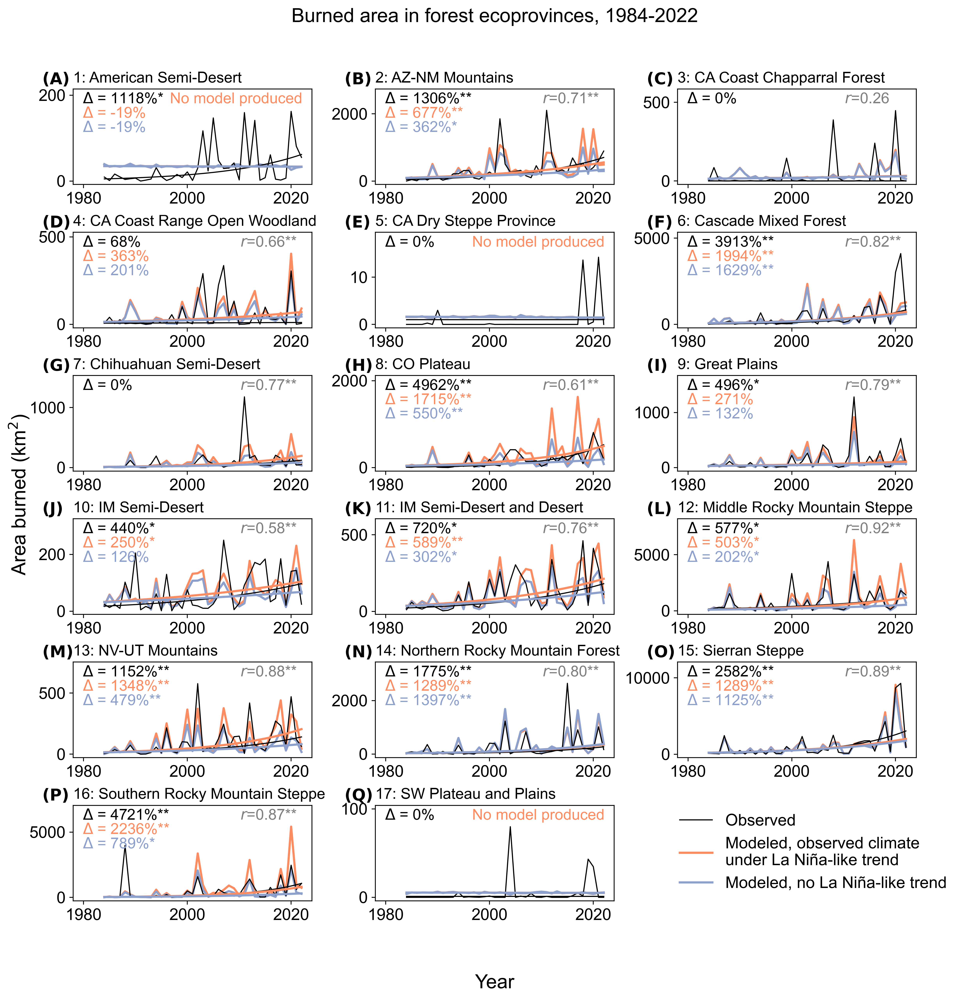

In [60]:
# FOREST create a 4x6 grid for the 17 ecoregions that are available
years = np.arange(firstyear, finalyear+1)
fig, ax = plt.subplots(6,3, figsize=(13,13))
figrow = np.arange(0,6)
figcol = np.arange(0,3)

# these values to manually change (FOREST)
tmpobs = wumifor
tmpmodelpred = BAclimpredfor
tmpmodelpredDT = BAclimpredfor_DT
tmpobstrend = delta_wumifor_ecoprov
tmpmodeltrend = delta_modelfor_ecoprov
tmpmodeltrendDT = delta_modelforDT_ecoprov
tmprmodel = rvalue_climpredfor
tmprmodel_p = rvalue_climpredfor_p
tmpp_obstrend = p_obsfor
tmpp_modeltrend = p_modelfor
tmpp_modelDTtrend = p_modelDTfor

# run the figure
i = 1
for thisrow in figrow:
    for thiscol in figcol:
        if i>=len(dfnames):
            break
        thisname = dfnames[i]
        #print(thisname)
        # select column of ecoregion
        sum_BAclimpred = (10**(tmpmodelpred.filter(like=thisname+'_'))).mean(axis=1)
        sum_BAclimpred_DT = (10**(tmpmodelpredDT.filter(like=thisname+'_'))).mean(axis=1)
        sumswumi = tmpobs.loc[:,str(dfnum[i-1])]
        sumswumilog = np.ma.masked_invalid(np.log10(sumswumi)).filled(0)
        sums_BAclimpredlog = np.ma.masked_invalid(np.log10(sum_BAclimpred)).filled(0)
        sums_BAclimpredlog_DT = np.ma.masked_invalid(np.log10(sum_BAclimpred_DT)).filled(0)
        tmpr = tmprmodel[i]
        tmppmarker = addSigMarker(tmprmodel_p[i])
        tmprlabel = '{:.2f}{:}'.format(tmpr, tmppmarker)
        
        # line of best fit
        # wumi lines of best fit
        tmpbestfit = theilslopes(sumswumilog, x=xyears, method='joint') # regression
        tmpm = tmpbestfit.slope
        tmpb = tmpbestfit.intercept
        # BA model lines of best fit
        tmpbestfit = theilslopes(sums_BAclimpredlog,
                                 x=xyears, method='joint') # regression
        tmpmBA = tmpbestfit.slope
        tmpbBA = tmpbestfit.intercept
        # detrended BA model lines of best fit
        tmpbestfit = theilslopes(sums_BAclimpredlog_DT,
                                 x=xyears, method='joint') # regression
        tmpmBA_DT = tmpbestfit.slope
        tmpbBA_DT = tmpbestfit.intercept
        
        # plot data
        ax[thisrow,thiscol].plot(sumswumi, label='Observed', 
                                 zorder=2, c='k', linewidth=1)
        ax[thisrow,thiscol].plot(years, sum_BAclimpred, label='From observed SST trend', 
                                 c=colorobs, linewidth=2, zorder=1)
        ax[thisrow,thiscol].plot(years, sum_BAclimpred_DT, label='From detrended SST', 
                                 c=colorDT, linewidth=2, zorder=1)
        # plot line of best fit
        ax[thisrow,thiscol].plot(xyears, 10**(tmpm*xyears+tmpb),
                   linewidth=1, c='k', zorder=3)
        ax[thisrow,thiscol].plot(xyears, 10**(tmpmBA*xyears+tmpbBA), 
                   linewidth=2, c=colorobs, zorder=4)
        ax[thisrow,thiscol].plot(xyears, 10**(tmpmBA_DT*xyears+tmpbBA_DT), 
                   linewidth=2, c=colorDT, zorder=5)

        # set decorations
        ax[thisrow,thiscol].set_box_aspect(0.4)
        tmpmax_val = np.array([sumswumi]+[sum_BAclimpred]).max()
        tmprounded_max = np.ceil(tmpmax_val / 5) * 5 
        current_min = ax[thisrow,thiscol].get_ylim()[0]
        ax[thisrow,thiscol].set_xlim([1978,finalyear+2])
        ax[thisrow,thiscol].set_ylim([current_min,tmprounded_max*1.3])
        
        # set title
        ax[thisrow,thiscol].set_title(prov_label_names[i-1], loc='left',fontsize=14)
        #ax[thisrow,thiscol].annotate(prov_label_names[i-1],(0.06,0.85), c='#000', xycoords='axes fraction' )
        
        # print the r value, or else
        # no model produced for these ecoprovinces
        if i in [1,5,17]:
            ax[thisrow,thiscol].annotate('No model produced',(0.96,0.85),
                                         ha='right', c=colorobs, 
                                         xycoords='axes fraction', fontsize=14)
        else:
            ax[thisrow,thiscol].annotate("$r$="+tmprlabel, (0.70,0.85), 
                c='gray', xycoords='axes fraction',fontsize=14)
        
        # change annotations if model is NaN or not
        if np.isnan(tmpobstrend[i-1]):
            ax[thisrow,thiscol].annotate('$\Delta$ = 0%', (0.04,0.85), 
                c='k', xycoords='axes fraction',fontsize=14)
            #ax[thisrow,thiscol].annotate('from gSST = \n0 ppts, 0%',
            #    (0.04,0.45), c='k', xycoords='axes fraction' )
        else:
            tmppmarker = addSigMarker(tmpp_obstrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpobstrend[i-1],tmppmarker),
                    (0.04,0.85), c='k', xycoords='axes fraction', fontsize=14)
            tmppmarker = addSigMarker(tmpp_modeltrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrend[i-1],tmppmarker),
                    (0.04,0.70), c=colorobs, xycoords='axes fraction', fontsize=14 )
            tmppmarker = addSigMarker(tmpp_modelDTtrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrendDT[i-1], tmppmarker),
                    (0.04,0.55), c=colorDT, xycoords='axes fraction', fontsize=14 )
            tmppptsdiff = tmpmodeltrend[i-1]-tmpmodeltrendDT[i-1]
            tmppct = (tmppptsdiff)/(tmpobstrend[i-1])*100
            #ax[thisrow,thiscol].annotate('from gSST = \n{:.0f} ppts, {:.0f}%'.format(tmppptsdiff, tmppct),
            #     (0.04,0.45), c='k', xycoords='axes fraction' )
        #ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f} ppts'.format(tmpmodeltrend[i-1]),
        #                             (0.04,0.65), c=colorobs, xycoords='axes fraction' )
        #ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f} ppts'.format(tmpmodeltrendDT[i-1]), (0.04,0.54), 
        #        c=colorDT, xycoords='axes fraction' )
        
        
        i+=1
fig.supylabel('Area burned (km$^2$)')
fig.supxlabel('Year')
fig.suptitle('Burned area in forest ecoprovinces, '+str(firstyear)+'-'+str(finalyear))
fig.delaxes(ax[5,2])
fig.legend(['Observed',
           'Modeled, observed climate \nunder La Niña-like trend',
           'Modeled, no La Niña-like trend'],
           frameon=False, bbox_to_anchor=(0.96,0.20))

k=0
figlabels = [chr(i) for i in range(65, 65 + len(dfnum)+1)]


# add figure labels
for thisrow in figrow:
    for thiscol in figcol:
        thisfiglabel = figlabels[k]
        ax[thisrow,thiscol].annotate('$\\bf{(%s)}$' % thisfiglabel, (-0.13,1.05), 
                                     c='k', xycoords='axes fraction')
        k+=1

fig.patch.set_alpha(0)
plt.subplots_adjust(wspace=0.22, hspace=0.5, left=0.08, right=0.92, top=0.9, bottom=0.1)

plt.savefig(figfolder + 'Ecoprovince_BurnedArea_Forest.png')

# Figure S7: All nonforest ecoprovinces

/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Use

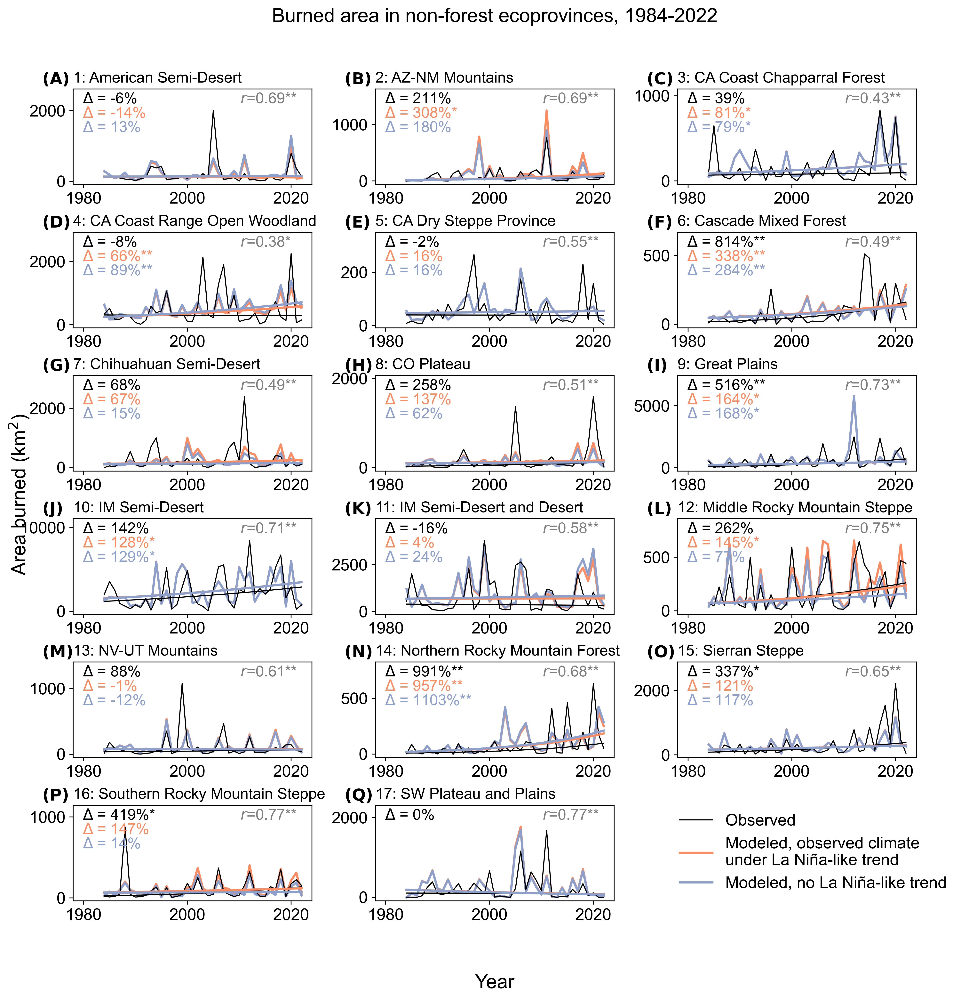

In [61]:
# NONFOREST create a 4x6 grid for the 17 ecoregions that are available
years = np.arange(firstyear, finalyear+1)
fig, ax = plt.subplots(6,3, figsize=(13,13))
figrow = np.arange(0,6)
figcol = np.arange(0,3)

# these values to manually change (NON-FOREST)
tmpobs = wuminon
tmpmodelpred = BAclimprednon
tmpmodelpredDT = BAclimprednon_DT
tmpobstrend = delta_wuminon_ecoprov
tmpmodeltrend = delta_modelnon_ecoprov
tmpmodeltrendDT = delta_modelnonDT_ecoprov
tmprmodel = rvalue_climprednon
tmprmodel_p = rvalue_climprednon_p
tmpp_obstrend = p_obsnon
tmpp_modeltrend = p_modelnon
tmpp_modelDTtrend = p_modelDTnon

# run the figure
i = 1
for thisrow in figrow:
    for thiscol in figcol:
        if i>=len(dfnames):
            break
        thisname = dfnames[i]
        #print(thisname)
        # select column of ecoregion
        sum_BAclimpred = (10**(tmpmodelpred.filter(like=thisname+'_'))).mean(axis=1)
        sum_BAclimpred_DT = (10**(tmpmodelpredDT.filter(like=thisname+'_'))).mean(axis=1)
        sumswumi = tmpobs.loc[:,str(dfnum[i-1])]
        sumswumilog = np.ma.masked_invalid(np.log10(sumswumi)).filled(0)
        sums_BAclimpredlog = np.ma.masked_invalid(np.log10(sum_BAclimpred)).filled(0)
        sums_BAclimpredlog_DT = np.ma.masked_invalid(np.log10(sum_BAclimpred_DT)).filled(0)
        tmpr = tmprmodel[i]
        tmppmarker = addSigMarker(tmprmodel_p[i])
        tmprlabel = '{:.2f}{:}'.format(tmpr, tmppmarker)
        
        # line of best fit
        # wumi lines of best fit
        tmpbestfit = theilslopes(sumswumilog, x=xyears, method='joint') # regression
        tmpm = tmpbestfit.slope
        tmpb = tmpbestfit.intercept
        # BA model lines of best fit
        tmpbestfit = theilslopes(sums_BAclimpredlog,
                                 x=xyears, method='joint') # regression
        tmpmBA = tmpbestfit.slope
        tmpbBA = tmpbestfit.intercept
        # detrended BA model lines of best fit
        tmpbestfit = theilslopes(sums_BAclimpredlog_DT,
                                 x=xyears, method='joint') # regression
        tmpmBA_DT = tmpbestfit.slope
        tmpbBA_DT = tmpbestfit.intercept
        
        # plot data
        ax[thisrow,thiscol].plot(sumswumi, label='Observed', 
                                 zorder=2, c='k', linewidth=1)
        ax[thisrow,thiscol].plot(years, sum_BAclimpred, label='From observed SST trend', 
                                 c=colorobs, linewidth=2, zorder=1)
        ax[thisrow,thiscol].plot(years, sum_BAclimpred_DT, label='From detrended SST', 
                                 c=colorDT, linewidth=2, zorder=1)
        # plot line of best fit
        ax[thisrow,thiscol].plot(xyears, 10**(tmpm*xyears+tmpb),
                   linewidth=1, c='k', zorder=3)
        ax[thisrow,thiscol].plot(xyears, 10**(tmpmBA*xyears+tmpbBA), 
                   linewidth=2, c=colorobs, zorder=4)
        ax[thisrow,thiscol].plot(xyears, 10**(tmpmBA_DT*xyears+tmpbBA_DT), 
                   linewidth=2, c=colorDT, zorder=5)

        # set decorations
        ax[thisrow,thiscol].set_box_aspect(0.4)
        tmpmax_val = np.array([sumswumi]+[sum_BAclimpred]).max()
        tmprounded_max = np.ceil(tmpmax_val / 5) * 5 
        current_min = ax[thisrow,thiscol].get_ylim()[0]
        ax[thisrow,thiscol].set_xlim([1978,finalyear+2])
        ax[thisrow,thiscol].set_ylim([current_min,tmprounded_max*1.3])
        
        # set title
        ax[thisrow,thiscol].set_title(prov_label_names[i-1], loc='left',fontsize=14)
        #ax[thisrow,thiscol].annotate(prov_label_names[i-1],(0.06,0.85), c='#000', xycoords='axes fraction' )
        
        # print the r value
        ax[thisrow,thiscol].annotate("$r$="+tmprlabel, (0.70,0.85), 
            c='gray', xycoords='axes fraction',fontsize=14)
        
        # change annotations if model is NaN or not
        if np.isnan(tmpobstrend[i-1]):
            ax[thisrow,thiscol].annotate('$\Delta$ = 0%', (0.04,0.85), 
                c='k', xycoords='axes fraction',fontsize=14)
            #ax[thisrow,thiscol].annotate('from gSST = \n0 ppts, 0%',
            #    (0.04,0.45), c='k', xycoords='axes fraction' )
        else:
            tmppmarker = addSigMarker(tmpp_obstrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpobstrend[i-1],tmppmarker),
                    (0.04,0.85), c='k', xycoords='axes fraction', fontsize=14)
            tmppmarker = addSigMarker(tmpp_modeltrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrend[i-1],tmppmarker),
                    (0.04,0.70), c=colorobs, xycoords='axes fraction', fontsize=14 )
            tmppmarker = addSigMarker(tmpp_modelDTtrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrendDT[i-1], tmppmarker),
                    (0.04,0.55), c=colorDT, xycoords='axes fraction', fontsize=14 )
            tmppptsdiff = tmpmodeltrend[i-1]-tmpmodeltrendDT[i-1]
            tmppct = (tmppptsdiff)/(tmpobstrend[i-1])*100
            #ax[thisrow,thiscol].annotate('from gSST = \n{:.0f} ppts, {:.0f}%'.format(tmppptsdiff, tmppct),
            #     (0.04,0.45), c='k', xycoords='axes fraction' )
        #ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f} ppts'.format(tmpmodeltrend[i-1]),
        #                             (0.04,0.65), c=colorobs, xycoords='axes fraction' )
        #ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f} ppts'.format(tmpmodeltrendDT[i-1]), (0.04,0.54), 
        #        c=colorDT, xycoords='axes fraction' )
        i+=1
fig.supylabel('Area burned (km$^2$)')
fig.supxlabel('Year')
fig.suptitle('Burned area in non-forest ecoprovinces, '+str(firstyear)+'-'+str(finalyear))
fig.delaxes(ax[5,2])
fig.legend(['Observed',
           'Modeled, observed climate \nunder La Niña-like trend',
           'Modeled, no La Niña-like trend'],
           frameon=False, bbox_to_anchor=(0.96,0.20))

k=0
figlabels = [chr(i) for i in range(65, 65 + len(dfnum)+1)]

#fig.tight_layout()

# add figure labels
for thisrow in figrow:
    for thiscol in figcol:
        thisfiglabel = figlabels[k]
        ax[thisrow,thiscol].annotate('$\\bf{(%s)}$' % thisfiglabel, (-0.13,1.05), 
                                     c='k', xycoords='axes fraction')
        k+=1

fig.patch.set_alpha(0)
plt.subplots_adjust(wspace=0.22, hspace=0.5, left=0.08, right=0.92, top=0.9, bottom=0.1)

plt.savefig(figfolder + 'Ecoprovince_BurnedArea_Nonforest.png')

# Combined forest-nonforest summary figure

Originally taken from the InternalVarFires `Analysis4_BAMaps`, and then put into this document. This is created based on reviewer feedback to have a summary plot and move the forest and nonforest figures above into supplemental info. (3/2/2026).

## The number-one variable picked in each ecoregion

find the model number-one variable from the model txt file (3/2/2026). This is included based on reviewer feedback to have a summary figure of the forest and nonforest information.

In [62]:
# get the model input variable names from the txt files
# climate variables to predict burned area

with open(model_string + "modeloutput_burnarea_for.txt", "r") as f:
    inputsfor_clim = [line.strip() for line in f]
f.close()
with open(model_string + "modeloutput_burnarea_non.txt", "r") as f:
    inputsnon_clim = [line.strip() for line in f]
f.close()

# get indices of where each ecoregion's outputs begin
# get ecoregions so iteration is not manual
iinputsfor_clim = [i for i, e in 
               enumerate(inputsfor_clim) if "+++" in e]
# get ecoregions so iteration is not manual
iinputsnon_clim = [i for i, e in 
               enumerate(inputsnon_clim) if "+++" in e]
# add in last index
iinputsfor_clim.append(len(inputsfor_clim)+1)
iinputsnon_clim.append(len(inputsnon_clim)+1)

In [63]:
climnameno1_for = []
climnameno1_non = []
for thisname in dfnames[1:]:
    # forest
    if thisname in noforestmodels: # skip analysis for these
        climnameno1_for.append('no_model')
        continue
    landname = 'for'
    landtypeinputclim = inputsfor_clim
    landtypeiinputclim = iinputsfor_clim
    istart = landtypeinputclim.index('+++'+thisname)
    iend = landtypeiinputclim[landtypeiinputclim.index(istart)+1]-1
    tmpclim = landtypeinputclim[istart+1:iend+1][0] # get first value
    tmpclim = str(tmpclim).split(' ')[0]
    climnameno1_for.append(tmpclim)

for thisname in dfnames[1:]:
    # non-forest
    if thisname in nononforestmodels: # skip analysis for these
        climnameno1_non.append('no_model')
        continue
    landtypeinputclim = inputsnon_clim
    landtypeiinputclim = iinputsnon_clim
    istart = landtypeinputclim.index('+++'+thisname)
    iend = landtypeiinputclim[landtypeiinputclim.index(istart)+1]-1
    tmpclim = landtypeinputclim[istart+1:iend+1][0] # get first value
    tmpclim = str(tmpclim).split(' ')[0]
    climnameno1_non.append(tmpclim)

# get unique names and labels (from forest and non-forest)
climcolorsno1 = []
climnameno1unique = list(set(climnameno1_non + climnameno1_for))
climnameno1unique.remove('no_model')
climnameno1unique.insert(0, 'no_model')
climnameno1labels = []
for thisclim in climnameno1unique:
    if thisclim=='no_model':
        tmpvarnamefor, tmpunitsfor, tmpcolorfor = ['No model','na','white']
    else:
        tmpvarnamefor, tmpunitsfor, tmpcolorfor = suppnameformat(thisclim)
    climcolorsno1.append(tmpcolorfor)
    climnameno1labels.append(tmpvarnamefor)

TypeError: 'GeoAxes' object is not subscriptable

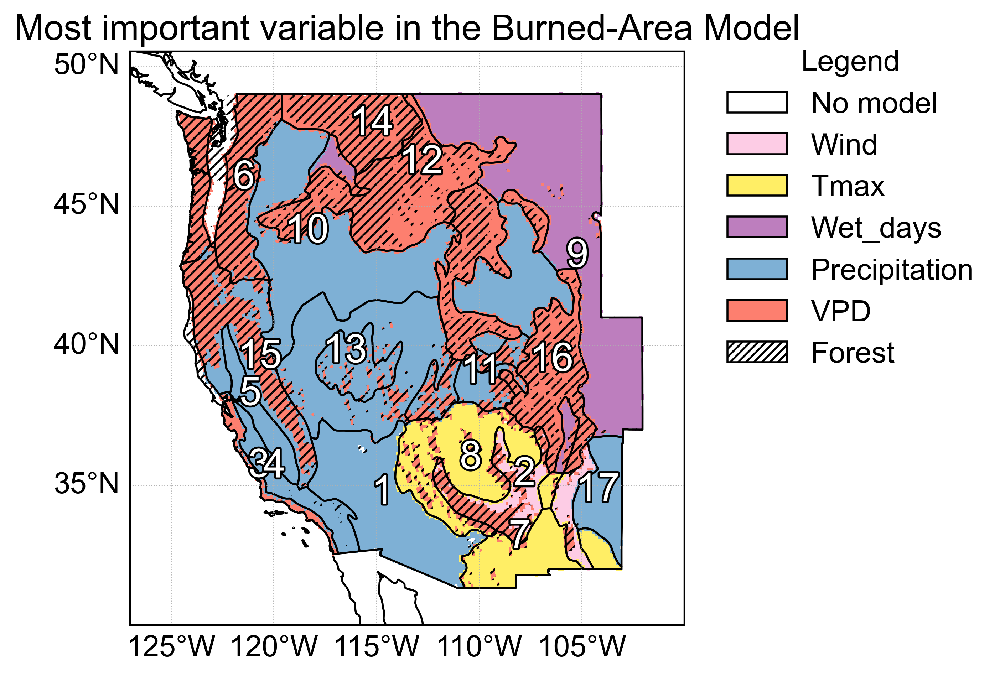

In [71]:
# PLOT OF THE VARIABLE THAT IS NUMBER ONE

# data to plot, filtered out irrelevant ecoprovinces
texttitle = 'Most important variable in the Burned-Area Model'

fig, ax = plt.subplots(figsize=(7,5),
                       subplot_kw={'projection':ccrs.PlateCarree()})

# plot the western US
extent = [-127,-100,30,50]
# add map features
ax.set_extent(extent)
ax.add_feature(LAND, facecolor='white', edgecolor='black')
#ax.add_feature(states, linewidth=0.8, edgecolor='k', alpha=0.5, zorder=2)


# PLOT DATA
# diverging colormap centered at zero

# add data
for counter, thisregnum in enumerate(dfnum):
    # get var and color
    if climnameno1_for[counter]=='no_model':
        tmpvarnamefor, tmpunitsfor, tmpcolorfor = ['No model','na','white'] 
    else:
        tmpvarnamefor, tmpunitsfor, tmpcolorfor = suppnameformat(climnameno1_for[counter])
    if climnameno1_non[counter]=='no_model':
        tmpvarnamenon, tmpunitsnon, tmpcolornon = ['No model','na','white']
    else:
        tmpvarnamenon, tmpunitsnon, tmpcolornon = suppnameformat(climnameno1_non[counter])
    masked_data_for = masked_data_for = xr.where((ecoregfor.sel(province=thisregnum)) > 0, 1, np.nan)
    masked_data_for.plot(
        ax=ax, cmap=mcolors.ListedColormap([tmpcolorfor]), 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        vmin=0, vmax=1, rasterized=True)
    masked_data_non = xr.where((ecoregnon.sel(province=thisregnum)) > 0, 1, np.nan)
    masked_data_non.plot(
        ax=ax, cmap=mcolors.ListedColormap([tmpcolornon]), 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        vmin=0, vmax=1, rasterized=True)

# plot forest shading
forest_shaded = forest.where(forest>=0.5, other=np.nan)
forest_true = np.isfinite(forest_shaded)
forest_true = (np.where(forest_true, forest_true, np.nan))
ax.pcolor(forest_shaded.X.values, forest_shaded.Y.values, forest_true,
              hatch='/////', alpha=0, facecolors=None, zorder=3,
              transform=ccrs.epsg(5070), shading='auto', linewidth=0.25,
              rasterized=True)

# decorate

# add edgeline of each ecoregion
Becoprov.boundary.plot(linewidth=1,
                       edgecolor='k', ax=ax, zorder=2,
                      rasterized=True)
# add number label of ecoprovince
thiscenter = Becoprov.geometry.representative_point()
for i in np.arange(len(Becoprov.NUMBER)):
    ax.text(thiscenter.x[i], thiscenter.y[i], s=(i+1), 
            horizontalalignment='center', color='white', fontsize=20,
            path_effects=[pe.withStroke(linewidth=2, foreground="black")])

# decorate
ax.set_title(texttitle)
ax.set_aspect(1.362/1)
#ax.set_yticks(([30, 35, 40, 45, 50]))
#ax.set_xticks((range(-130, -95, 5)))
ax.set_ylabel('Latitude ($^\circ$)')
ax.set_xlabel('Longitude ($^\circ$)')
BAgrid1 = ax.gridlines(xlocs=(range(-130, -95, 5)), 
             ylocs=([30, 35, 40, 45, 50]), crs=ccrs.PlateCarree(), 
             draw_labels=True,
             linewidth=0.5, linestyle=':')
BAgrid1.top_labels = False
BAgrid1.right_labels = False

ax.set_facecolor("white")
fig.patch.set_alpha(0)

# legend patches
legend_patches = []
for itmplabel, tmplabel in enumerate(climnameno1labels):
    tmppatch = Patch(facecolor=climcolorsno1[itmplabel], 
                     edgecolor='k', label=tmplabel)
    legend_patches.append(tmppatch)

legend_patches.append(Patch(facecolor='none', edgecolor='k', hatch='//////', label='Forest'))

# legend
ax.legend(handles=legend_patches,title='Legend',
          bbox_to_anchor=(1.3,1.05), loc='upper center', frameon=False)
fig.tight_layout()

# add figure labels
figlabels = [chr(i) for i in range(65, 65 + len(dfnum)+1)]
k=0
for thisrow in figrow:
    thisfiglabel = figlabels[k+10]
    ax[thisrow].annotate('$\\bf{(%s)}$' % thisfiglabel, (-0.13,1.05), 
                                 c='k', xycoords='axes fraction', fontsize=fnt)
    k+=1

# output as SVG to modify numbers
plt.savefig(figfolder + 'Fig6_ModelVarMap_TimeSeries_3Var.svg', 
            format='svg', bbox_inches="tight")

## Time series of select forest and non-forest ecoprovinces

Show time series with the largest forest and non-forest area burned. 6 Forest regions, 4 non-forest regions.

In [65]:
# calculate the ones with the LARGEST gSST influence
# (3/10/2026) decided not to use this version
dfnames2 = ['allwestUS', 'ecoprov1', 'ecoprov2', 'ecoprov3', 'ecoprov4', 'ecoprov5', 
           'ecoprov6', 'ecoprov7', 'ecoprov8', 'ecoprov9', 'ecoprov10', 
           'ecoprov12','ecoprov13','ecoprov14','ecoprov15',
           'ecoprov16','ecoprov17','ecoprov18','ecoprov19','ecoprov20','ecoprov21']

# forest
# get the percent change
tmpmodeltrend = delta_modelfor_ecoprov
tmpmodeltrendDT = delta_modelforDT_ecoprov
# calculate gSST contribution (absolute value)
tmppptsdiff = np.abs(tmpmodeltrend-tmpmodeltrendDT)
# make pandas df of the associated ecoprovince names, their index
tmppptsdff_df = pd.DataFrame(list(zip(tmppptsdiff, dfnames[1:])),
                             columns=['tmppptsdiff','dfnames'])
# get top 10 with largest gSST influence (absolute value)
top_labelsfor = tmppptsdff_df.nlargest(5, 'tmppptsdiff').sort_index().dfnames.values

# nonforest
# get the percent change
tmpmodeltrend = delta_modelnon_ecoprov
tmpmodeltrendDT = delta_modelnonDT_ecoprov
# calculate gSST contribution (absolute value)
tmppptsdiff = np.abs(tmpmodeltrend-tmpmodeltrendDT)
# make pandas df of the associated ecoprovince names, their index
tmppptsdff_df = pd.DataFrame(list(zip(tmppptsdiff, dfnames[1:])),
                             columns=['tmppptsdiff','dfnames'])
# get top 5 with largest gSST influence (absolute value) 
# - THEN MANUALLY SELECT BASED ON PAPER DISCUSSION. 
# COMBO OF NON-FOREST IN SOUTH, NONFOREST IN NORTH, AND FOREST-ADJACENT NONFOREST
#top_labelsnon = tmppptsdff_df.nlargest(5, 'tmppptsdiff').sort_index().dfnames.values
top_labelsnon = np.array(['ecoprov1','ecoprov2','ecoprov13','ecoprov14','ecoprov17'])

print(top_labelsfor)
print(top_labelsnon)

# get the indices in the len=17 version!!!!
tmpidffor = [i for i, val in enumerate(dfnames) if val in top_labelsfor]
tmpidfnon = [i for i, val in enumerate(dfnames) if val in top_labelsnon]

# get the string names for wumi
tmpdfnumfor = [x.replace('ecoprov', '') for x in top_labelsfor]
tmpdfnumnon = [x.replace('ecoprov', '') for x in top_labelsnon]
# check
print(tmpidffor)
print(tmpidfnon)

print(tmpdfnumfor)
print(tmpdfnumnon)

['ecoprov2' 'ecoprov8' 'ecoprov10' 'ecoprov16' 'ecoprov20']
['ecoprov1' 'ecoprov2' 'ecoprov13' 'ecoprov14' 'ecoprov17']
[2, 6, 8, 13, 16]
[1, 2, 10, 11, 14]
['2', '8', '10', '16', '20']
['1', '2', '13', '14', '17']


In [66]:
# calculate the n largest
dfnames2 = ['allwestUS', 'ecoprov1', 'ecoprov2', 'ecoprov3', 'ecoprov4', 'ecoprov5', 
           'ecoprov6', 'ecoprov7', 'ecoprov8', 'ecoprov9', 'ecoprov10', 
           'ecoprov12','ecoprov13','ecoprov14','ecoprov15',
           'ecoprov16','ecoprov17','ecoprov18','ecoprov19','ecoprov20','ecoprov21']

# get prep data
nlargestfor = wumifor.sum(axis=0).to_frame(name='area_km').reset_index().rename(columns={'index': 'dfnum'})
nlargestfor['dfname'] = dfnames2
nlargestfor = nlargestfor[nlargestfor['dfname']!='allwestUS']

nlargestnon = wuminon.sum(axis=0).to_frame(name='area_km').reset_index().rename(columns={'index': 'dfnum'})
nlargestnon['dfname'] = dfnames2
nlargestnon = nlargestnon[nlargestnon['dfname']!='allwestUS']

# get largest
tmpsortfor = nlargestfor.nlargest(6, 'area_km').sort_index()
tmpsortnon = nlargestnon.nlargest(4, 'area_km').sort_index()
# get labels, numbers, index
top_labelsfor = tmpsortfor.dfname.values
tmpdfnumfor = tmpsortfor.dfnum.values

top_labelsnon = tmpsortnon.dfname.values
tmpdfnumnon = tmpsortnon.dfnum.values

# get the indices in the len=17 version!!!!
tmpidffor = [i for i, val in enumerate(dfnames) if val in top_labelsfor]
tmpidfnon = [i for i, val in enumerate(dfnames) if val in top_labelsnon]

ecoprov2
1
ecoprov8
5
ecoprov15
11
ecoprov17
13
ecoprov19


/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


14
ecoprov20
15


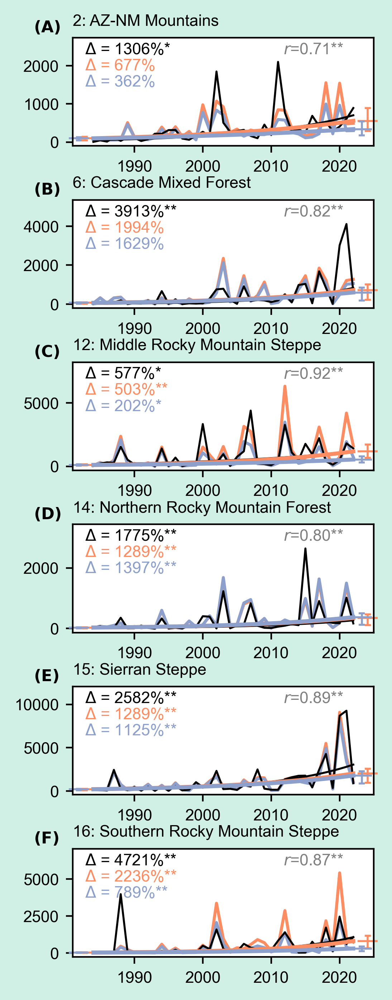

In [69]:
# get row of forest (vertical)

years = np.arange(firstyear, finalyear+1)
panel_w = 2.5 # slightly smaller to adjust to nonforest width
panel_h = 7/6   # ≈1.17
fig, ax = plt.subplots(6,1,figsize = [panel_w, 6*panel_h + 1.0])
figrow = np.arange(0,6)

# these values to manually change (FOREST)
tmpselect = tmpidffor # index of dfnum
tmpdfnum = tmpdfnumfor # ecoprovince number
tmpselnames = top_labelsfor # no allwestUS
tmpobs = wumifor
tmpmodelpred = BAclimpredfor
tmpmodelpredDT = BAclimpredfor_DT
tmpobstrend = delta_wumifor_ecoprov
tmpmodeltrend = delta_modelfor_ecoprov
tmpmodeltrendDT = delta_modelforDT_ecoprov
tmprmodel = rvalue_climpredfor
tmprmodel_p = rvalue_climpredfor_p
tmpp_obstrend = p_obsfor
tmpp_modeltrend = p_modelfor
tmpp_modelDTtrend = p_modelDTfor

i = 0
for thisrow in figrow:
    if i>=len(tmpselnames):
            break
    thisname = tmpselnames[i]
    print(thisname)
    k = tmpselect[i]-1 # start at ecoprov1 than allwestUS?
    # select column of ecoregion
    sum_BAclimpred = (10**(tmpmodelpred.filter(like=thisname+'_'))).mean(axis=1)
    sum_BAclimpred_DT = (10**(tmpmodelpredDT.filter(like=thisname+'_'))).mean(axis=1)
    sumswumi = tmpobs.loc[:,tmpdfnum[i]]
    sumswumilog = np.ma.masked_invalid(np.log10(sumswumi)).filled(0)
    sums_BAclimpredlog = np.ma.masked_invalid(np.log10(sum_BAclimpred)).filled(0)
    sums_BAclimpredlog_DT = np.ma.masked_invalid(np.log10(sum_BAclimpred_DT)).filled(0)
    sums_BAclimpredlog = np.ma.masked_invalid(np.log10(sum_BAclimpred)).filled(0)
    tmpr = tmprmodel[k+1]
    tmppmarker = addSigMarker(tmprmodel_p[k+1])
    tmprlabel = '{:.2f}{:}'.format(tmpr, tmppmarker)
    
    # line of best fit
    # wumi lines of best fit
    tmpbestfit = theilslopes(sumswumilog, x=xyears, method='joint') # regression
    tmpm = tmpbestfit.slope
    tmpb = tmpbestfit.intercept
    # BA model lines of best fit
    tmpbestfit = theilslopes(sums_BAclimpredlog,
                            x=xyears, method='joint') # regression
    tmpmBA = tmpbestfit.slope
    tmpbBA = tmpbestfit.intercept
    # detrended BA model lines of best fit
    tmpbestfit = theilslopes(sums_BAclimpredlog_DT,
                            x=xyears, method='joint') # regression
    tmpmBA_DT = tmpbestfit.slope
    tmpbBA_DT = tmpbestfit.intercept

    # all possible theil-sen trendlines from ensemble members
    slopes_BA, intercepts_BA = ensemble_trends((
        10**tmpmodelpred.filter(like=thisname+'_')), xyears)
    slopes_BA_DT, intercepts_BA_DT = ensemble_trends((
        10**tmpmodelpredDT.filter(like=thisname+'_')), xyears)
    tmpBA_trendspread = 10**(
        slopes_BA[:, None] * xyears[None, :] + intercepts_BA[:, None])
    tmpBADT_trendspread = 10**(
        slopes_BA_DT[:, None] * xyears[None, :] + intercepts_BA_DT[:, None])
    trendBA_lo, trendBA_hi = np.percentile(tmpBA_trendspread, 
                                           [2.5, 97.5], axis=0)
    trendBA_lo_DT, trendBA_hi_DT = np.percentile(tmpBADT_trendspread, 
                                                 [2.5, 97.5], axis=0)
    
    # plot data
    ax[thisrow].plot(sumswumi, label='Observed', 
                             zorder=2, c='k', linewidth=1)
    ax[thisrow].plot(years, sum_BAclimpred, label='From observed SST trend', 
                             c=colorobs, linewidth=1.5, zorder=1)
    ax[thisrow].plot(years, sum_BAclimpred_DT, label='From detrended SST', 
                             c=colorDT, linewidth=1.5, zorder=1)
    # plot line of best fit
    ax[thisrow].plot(xyears, 10**(tmpm*xyears+tmpb),
               linewidth=1, c='k', zorder=3)
    ax[thisrow].plot(xyears, 10**(tmpmBA*xyears+tmpbBA), 
               linewidth=2, c=colorobs, zorder=4)
    ax[thisrow].plot(xyears, 10**(tmpmBA_DT*xyears+tmpbBA_DT), 
               linewidth=2, c=colorDT, zorder=5)

    # add 95% confidence interval for trendlines
    # TRENDLINE UNCERTAINTY WHISKERS (errorbars for 95th percentile confidence range)
    # trendlines already plotted above
    fit_obs = 10**(tmpmBA * xyears + tmpbBA)
    fit_dt  = 10**(tmpmBA_DT * xyears + tmpbBA_DT)
    # x positions in axes coordinates
    xleft_obs  = 0.04
    xleft_dt   = 0.02
    xright_obs = 0.98
    xright_dt  = 0.96
    capwidth = 0.010
    trans = ax[thisrow].get_yaxis_transform()
    # --------------------------------
    # OBSERVED-CLIMATE TRENDLINE
    # left endpoint
    ym = fit_obs[0]
    y0 = trendBA_lo[0]
    y1 = trendBA_hi[0]
    ax[thisrow].vlines(
        xleft_obs, y0, y1, color=colorobs, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].hlines([y0, y1],xleft_obs-capwidth,
        xleft_obs+capwidth, color=colorobs, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].plot(xleft_obs, ym,
        marker='_', markersize=10, color=colorobs,
        transform=trans, clip_on=False)
    # right endpoint
    ym = fit_obs[-1]
    y0 = trendBA_lo[-1]
    y1 = trendBA_hi[-1]
    
    ax[thisrow].vlines(xright_obs, y0, y1, color=colorobs, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].hlines([y0, y1],
        xright_obs-capwidth,
        xright_obs+capwidth, color=colorobs, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].plot(xright_obs, ym,
        marker='_', markersize=10, color=colorobs,
        transform=trans, clip_on=False)
    # --------------------------
    # DETRENDED-SST TRENDLINE
    
    # left endpoint
    ym = fit_dt[0]
    y0 = trendBA_lo_DT[0]
    y1 = trendBA_hi_DT[0]
    
    ax[thisrow].vlines(xleft_dt, y0, y1, color=colorDT, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].hlines([y0, y1],xleft_dt-capwidth,
        xleft_dt+capwidth, color=colorDT, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].plot(xleft_dt, ym, marker='_', markersize=10, 
             color=colorDT, transform=trans, clip_on=False)
    # right endpoint
    ym = fit_dt[-1]
    y0 = trendBA_lo_DT[-1]
    y1 = trendBA_hi_DT[-1]
    
    ax[thisrow].vlines(xright_dt, y0, y1,
        color=colorDT, lw=1, transform=trans, clip_on=False)
    ax[thisrow].hlines([y0, y1],
        xright_dt-capwidth,xright_dt+capwidth, color=colorDT, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].plot(xright_dt, ym,marker='_', markersize=10, color=colorDT,
        transform=trans, clip_on=False)
    
    # ---------------

    # set decorations
    
    bbox = ax[thisrow].get_window_extent().transformed(
        fig.dpi_scale_trans.inverted())
    height = bbox.height
    fnt = 11 * height / 1.2 # scale the font
    
    ax[thisrow].tick_params(axis='both', which='major', labelsize=fnt)
    ax[thisrow].set_facecolor('white')
    
    tmpmax_val = np.array([sumswumi]+[sum_BAclimpred]).max()
    tmprounded_max = np.ceil(tmpmax_val / 5) * 5 
    current_min = ax[thisrow].get_ylim()[0]
    ax[thisrow].set_xlim([1981,finalyear+3])
    ax[thisrow].set_ylim([current_min,tmprounded_max*1.3])
    
    # set title
    ax[thisrow].set_title(prov_label_names[k], loc='left',fontsize=fnt)
    #ax[thisrow].annotate(prov_label_names[k],(0.06,0.85), c='#000', xycoords='axes fraction' )
    
    # print the r value, or else
    # no model produced for these ecoprovinces
    if tmpdfnum[i] in [1,5,17]:
        ax[thisrow].annotate('No model produced',(0.96,0.85),
                                     ha='right', c=colorobs, 
                                     xycoords='axes fraction', fontsize=fnt)
    else:
        ax[thisrow].annotate("$r$="+tmprlabel, (0.70,0.85), 
            c='gray', xycoords='axes fraction',fontsize=fnt)
    
    # change annotations if model is NaN or not
    
    if np.isnan(tmpobstrend[k]):
        ax[thisrow].annotate('$\Delta$ = 0%', (0.04,0.85), 
            c='k', xycoords='axes fraction',fontsize=fnt)
        #ax[thisrow].annotate('from gSST = \n0 ppts, 0%',
        #    (0.04,0.45), c='k', xycoords='axes fraction' )
    else:
        tmppmarker = addSigMarker(tmpp_obstrend[k])
        ax[thisrow].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpobstrend[k],tmppmarker),
                (0.04,0.85), c='k', xycoords='axes fraction', fontsize=fnt)
        tmppmarker = addSigMarker(tmpp_modeltrend[k])
        ax[thisrow].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrend[k],tmppmarker),
                (0.04,0.70), c=colorobs, xycoords='axes fraction', fontsize=fnt )
        tmppmarker = addSigMarker(tmpp_modelDTtrend[k])
        ax[thisrow].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrendDT[k], tmppmarker),
                (0.04,0.55), c=colorDT, xycoords='axes fraction', fontsize=fnt )
        tmppptsdiff = tmpmodeltrend[k]-tmpmodeltrendDT[k]
        tmppct = (tmppptsdiff)/(tmpobstrend[k])*100

    i+=1 # advance index
    print(k)

# add figure labels
k=0
figlabels = [chr(i) for i in range(65, 65 + len(dfnum)+1)]
for thisrow in figrow:
    thisfiglabel = figlabels[k]
    ax[thisrow].annotate('$\\bf{(%s)}$' % thisfiglabel, (-0.13,1.05), 
                                 c='k', xycoords='axes fraction', fontsize=fnt)
    k+=1

fig.patch.set_facecolor('mediumaquamarine')
fig.patch.set_alpha(0.3)
plt.subplots_adjust(wspace=0.22, hspace=0.5, left=0.08, right=0.92, top=0.9, bottom=0.1)

# output as SVG to modify numbers
plt.savefig(figfolder + 'Fig6_ModelVarMap_TimeSeries_1For.svg', 
            format='svg', bbox_inches="tight")

## nonforest

ecoprov5
3
ecoprov12
8
ecoprov13
9
ecoprov14
10


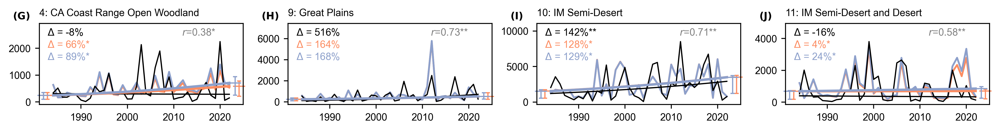

In [70]:
# get row of nonforest (horizontal)

years = np.arange(firstyear, finalyear+1)
panel_w = 3
panel_h = 7/6   # ≈1.17
fig, ax = plt.subplots(1,4,figsize = [panel_w*4 + 1.0, panel_h])
figrow = np.arange(0,4)

# these values to manually change (FOREST)
tmpselect = tmpidfnon # index of dfnum
tmpdfnum = tmpdfnumnon # ecoprovince number
tmpselnames = top_labelsnon # no allwestUS
tmpobs = wuminon
tmpmodelpred = BAclimprednon
tmpmodelpredDT = BAclimprednon_DT
tmpobstrend = delta_wuminon_ecoprov
tmpmodeltrend = delta_modelnon_ecoprov
tmpmodeltrendDT = delta_modelnonDT_ecoprov
tmprmodel = rvalue_climprednon
tmprmodel_p = rvalue_climprednon_p
tmpp_obstrend = p_obsnon
tmpp_modeltrend = p_modelnon
tmpp_modelDTtrend = p_modelDTnon

i = 0
for thisrow in figrow:
    if i>=len(tmpselnames):
            break
    thisname = tmpselnames[i]
    print(thisname)
    k = tmpselect[i]-1 # start at ecoprov1 than allwestUS?
    # select column of ecoregion
    sum_BAclimpred = (10**(tmpmodelpred.filter(like=thisname+'_'))).mean(axis=1)
    sum_BAclimpred_DT = (10**(tmpmodelpredDT.filter(like=thisname+'_'))).mean(axis=1)
    sumswumi = tmpobs.loc[:,tmpdfnum[i]]
    sumswumilog = np.ma.masked_invalid(np.log10(sumswumi)).filled(0)
    sums_BAclimpredlog = np.ma.masked_invalid(np.log10(sum_BAclimpred)).filled(0)
    sums_BAclimpredlog_DT = np.ma.masked_invalid(np.log10(sum_BAclimpred_DT)).filled(0)
    sums_BAclimpredlog = np.ma.masked_invalid(np.log10(sum_BAclimpred)).filled(0)
    tmpr = tmprmodel[k+1]
    tmppmarker = addSigMarker(tmprmodel_p[k+1])
    tmprlabel = '{:.2f}{:}'.format(tmpr, tmppmarker)
    
    # line of best fit
    # wumi lines of best fit
    tmpbestfit = theilslopes(sumswumilog, x=xyears, method='joint') # regression
    tmpm = tmpbestfit.slope
    tmpb = tmpbestfit.intercept
    # BA model lines of best fit
    tmpbestfit = theilslopes(sums_BAclimpredlog,
                            x=xyears, method='joint') # regression
    tmpmBA = tmpbestfit.slope
    tmpbBA = tmpbestfit.intercept
    # detrended BA model lines of best fit
    tmpbestfit = theilslopes(sums_BAclimpredlog_DT,
                            x=xyears, method='joint') # regression
    tmpmBA_DT = tmpbestfit.slope
    tmpbBA_DT = tmpbestfit.intercept

    # all possible theil-sen trendlines from ensemble members
    slopes_BA, intercepts_BA = ensemble_trends((
        10**tmpmodelpred.filter(like=thisname+'_')), xyears)
    slopes_BA_DT, intercepts_BA_DT = ensemble_trends((
        10**tmpmodelpredDT.filter(like=thisname+'_')), xyears)
    tmpBA_trendspread = 10**(
        slopes_BA[:, None] * xyears[None, :] + intercepts_BA[:, None])
    tmpBADT_trendspread = 10**(
        slopes_BA_DT[:, None] * xyears[None, :] + intercepts_BA_DT[:, None])
    trendBA_lo, trendBA_hi = np.percentile(tmpBA_trendspread, 
                                           [2.5, 97.5], axis=0)
    trendBA_lo_DT, trendBA_hi_DT = np.percentile(tmpBADT_trendspread, 
                                                 [2.5, 97.5], axis=0)
    
    # plot data
    ax[thisrow].plot(sumswumi, label='Observed', 
                             zorder=2, c='k', linewidth=1)
    ax[thisrow].plot(years, sum_BAclimpred, label='From observed SST trend', 
                             c=colorobs, linewidth=1.5, zorder=1)
    ax[thisrow].plot(years, sum_BAclimpred_DT, label='From detrended SST', 
                             c=colorDT, linewidth=1.5, zorder=1)
    # plot line of best fit
    ax[thisrow].plot(xyears, 10**(tmpm*xyears+tmpb),
               linewidth=1, c='k', zorder=3)
    ax[thisrow].plot(xyears, 10**(tmpmBA*xyears+tmpbBA), 
               linewidth=2, c=colorobs, zorder=4)
    ax[thisrow].plot(xyears, 10**(tmpmBA_DT*xyears+tmpbBA_DT), 
               linewidth=2, c=colorDT, zorder=5)

    # add 95% confidence interval for trendlines
    # TRENDLINE UNCERTAINTY WHISKERS (errorbars for 95th percentile confidence range)
    # trendlines already plotted above
    fit_obs = 10**(tmpmBA * xyears + tmpbBA)
    fit_dt  = 10**(tmpmBA_DT * xyears + tmpbBA_DT)
    # x positions in axes coordinates
    xleft_obs  = 0.04
    xleft_dt   = 0.02
    xright_obs = 0.98
    xright_dt  = 0.96
    capwidth = 0.010
    trans = ax[thisrow].get_yaxis_transform()
    # --------------------------------
    # OBSERVED-CLIMATE TRENDLINE
    # left endpoint
    ym = fit_obs[0]
    y0 = trendBA_lo[0]
    y1 = trendBA_hi[0]
    ax[thisrow].vlines(
        xleft_obs, y0, y1, color=colorobs, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].hlines([y0, y1],xleft_obs-capwidth,
        xleft_obs+capwidth, color=colorobs, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].plot(xleft_obs, ym,
        marker='_', markersize=10, color=colorobs,
        transform=trans, clip_on=False)
    # right endpoint
    ym = fit_obs[-1]
    y0 = trendBA_lo[-1]
    y1 = trendBA_hi[-1]
    
    ax[thisrow].vlines(xright_obs, y0, y1, color=colorobs, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].hlines([y0, y1],
        xright_obs-capwidth,
        xright_obs+capwidth, color=colorobs, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].plot(xright_obs, ym,
        marker='_', markersize=10, color=colorobs,
        transform=trans, clip_on=False)
    # --------------------------
    # DETRENDED-SST TRENDLINE
    
    # left endpoint
    ym = fit_dt[0]
    y0 = trendBA_lo_DT[0]
    y1 = trendBA_hi_DT[0]
    
    ax[thisrow].vlines(xleft_dt, y0, y1, color=colorDT, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].hlines([y0, y1],xleft_dt-capwidth,
        xleft_dt+capwidth, color=colorDT, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].plot(xleft_dt, ym, marker='_', markersize=10, 
             color=colorDT, transform=trans, clip_on=False)
    # right endpoint
    ym = fit_dt[-1]
    y0 = trendBA_lo_DT[-1]
    y1 = trendBA_hi_DT[-1]
    
    ax[thisrow].vlines(xright_dt, y0, y1,
        color=colorDT, lw=1, transform=trans, clip_on=False)
    ax[thisrow].hlines([y0, y1],
        xright_dt-capwidth,xright_dt+capwidth, color=colorDT, lw=1,
        transform=trans, clip_on=False)
    ax[thisrow].plot(xright_dt, ym,marker='_', markersize=10, color=colorDT,
        transform=trans, clip_on=False)
    
    # ---------------

    # set decorations
    bbox = ax[thisrow].get_window_extent().transformed(
        fig.dpi_scale_trans.inverted())
    height = bbox.height
    fnt = 11 * height / 1.2 # scale the font
    
    ax[thisrow].tick_params(axis='both', which='major', labelsize=fnt)
    ax[thisrow].set_facecolor('white')
    
    tmpmax_val = np.array([sumswumi]+[sum_BAclimpred]).max()
    tmprounded_max = np.ceil(tmpmax_val / 5) * 5 
    current_min = ax[thisrow].get_ylim()[0]
    ax[thisrow].set_xlim([1981,finalyear+3])
    ax[thisrow].set_ylim([current_min,tmprounded_max*1.3])
    
    # set title
    ax[thisrow].set_title(prov_label_names[k], loc='left',fontsize=fnt)
    #ax[thisrow].annotate(prov_label_names[k],(0.06,0.85), c='#000', xycoords='axes fraction' )
    
    # print the r value, or else
    # no model produced for these ecoprovinces
    if tmpdfnum[i] in [1,5,17]:
        ax[thisrow].annotate('No model produced',(0.96,0.85),
                                     ha='right', c=colorobs, 
                                     xycoords='axes fraction', fontsize=fnt)
    else:
        ax[thisrow].annotate("$r$="+tmprlabel, (0.70,0.85), 
            c='gray', xycoords='axes fraction',fontsize=fnt)
    
    # change annotations if model is NaN or not
    
    if np.isnan(tmpobstrend[k]):
        ax[thisrow].annotate('$\Delta$ = 0%', (0.04,0.85), 
            c='k', xycoords='axes fraction',fontsize=fnt)
        #ax[thisrow].annotate('from gSST = \n0 ppts, 0%',
        #    (0.04,0.45), c='k', xycoords='axes fraction' )
    else:
        tmppmarker = addSigMarker(tmpp_obstrend[k])
        ax[thisrow].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpobstrend[k],tmppmarker),
                (0.04,0.85), c='k', xycoords='axes fraction', fontsize=fnt)
        tmppmarker = addSigMarker(tmpp_modeltrend[k])
        ax[thisrow].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrend[k],tmppmarker),
                (0.04,0.70), c=colorobs, xycoords='axes fraction', fontsize=fnt )
        tmppmarker = addSigMarker(tmpp_modelDTtrend[k])
        ax[thisrow].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrendDT[k], tmppmarker),
                (0.04,0.55), c=colorDT, xycoords='axes fraction', fontsize=fnt )
        tmppptsdiff = tmpmodeltrend[k]-tmpmodeltrendDT[k]
        tmppct = (tmppptsdiff)/(tmpobstrend[k])*100

    i+=1 # advance index
    print(k)

fig.patch.set_alpha(0)
plt.subplots_adjust(wspace=0.22, hspace=0.6, left=0.08, right=0.92, top=0.9, bottom=0.1)

# add figure labels
k=0
for thisrow in figrow:
    thisfiglabel = figlabels[k+6]
    ax[thisrow].annotate('$\\bf{(%s)}$' % thisfiglabel, (-0.13,1.05), 
                                 c='k', xycoords='axes fraction', fontsize=fnt)
    k+=1

# output as SVG to modify numbers
plt.savefig(figfolder + 'Fig6_ModelVarMap_TimeSeries_2NF.svg', 
            format='svg', bbox_inches="tight")

## Combine for new Figure 6

Currently changed to raw code because I'm going to use the pieces above instead of the combined code. (6/26/2026)

In [69]:
# datetime object containing current date and time
from datetime import datetime
now = datetime.now()
# dd/mm/YY H:M:S
dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
print("Analysis last run =", dt_string)

Analysis last run = 26/06/2026 14:09:16
